<a href="https://colab.research.google.com/github/Kalpesh-Rajput/Integrated_Retail_Analytics_for_Store_Optimization_and_Demand_Forecasting/blob/main/Integrated_Retail_Analytics_for_Store_Optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    :
##Integrated Retail Analytics for Store Optimization and Demand Forecasting

# **Project Objective**:
##To utilize machine learning and data analysis techniques to optimize store performance, forecast demand, and enhance customer experience through segmentation and personalized marketing strategies.

In [3]:
# Import libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import calendar


from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:

# Dataset loading

sales_df = pd.read_csv('/content/drive/MyDrive/MS : Data Science & AI/Integrated Retail Analytics for Store Optimization Advanced Machine Learning/sales data-set.csv')
store_df = pd.read_csv('/content/drive/MyDrive/MS : Data Science & AI/Integrated Retail Analytics for Store Optimization Advanced Machine Learning/stores data-set.csv')
feature_df = pd.read_csv('/content/drive/MyDrive/MS : Data Science & AI/Integrated Retail Analytics for Store Optimization Advanced Machine Learning/Features data set.csv')



In [5]:
# Overview of data
print("Sales Data:")
display(sales_df.head())

print("\nStores Data:")
display(store_df.head())

print("\nFeatures Data:")
display(feature_df.head())

Sales Data:


,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,05/02/2010,24924.50,False
1,1,1,12/02/2010,46039.49,True
2,1,1,19/02/2010,41595.55,False
3,1,1,26/02/2010,19403.54,False
4,1,1,05/03/2010,21827.90,False



Stores Data:


,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875



Features Data:


,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,05/02/2010,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,12/02/2010,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,19/02/2010,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,26/02/2010,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,05/03/2010,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [6]:
# count row  of dataset

Columns_row_sales = sales_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in sales data')

Columns_row_store = store_df.shape
print('we have total ' , Columns_row_store , 'Columns and rows in store data')

Columns_row_feature = feature_df.shape
print('we have total ' , Columns_row_feature , 'Columns and rows in feature data')


we have total  (421570, 5) Columns and rows in sales data
we have total  (45, 3) Columns and rows in store data
we have total  (8190, 12) Columns and rows in feature data


In [7]:
# count Column  of dataset

Columns_row_sales = sales_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in sales data')

Columns_row_store = store_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in store data')

Columns_row_feature = feature_df.shape
print('we have total ' , Columns_row_sales , 'Columns and rows in feature data')

we have total  (421570, 5) Columns and rows in sales data
we have total  (421570, 5) Columns and rows in store data
we have total  (421570, 5) Columns and rows in feature data


In [8]:
# Check for missing values
print("Total Missing values in our sales data:")
print(sales_df.isnull().sum())

print("\nTotal Missing values in our stores data:")
print(store_df.isnull().sum())

print("\nTotal Missing values in our features:")
print(feature_df.isnull().sum())

# Check data types
print("\nChecking Data Types:")
print(sales_df.dtypes)
print(store_df.dtypes)
print(feature_df.dtypes)

Total Missing values in our sales data:
Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

Total Missing values in our stores data:
Store    0
Type     0
Size     0
dtype: int64

Total Missing values in our features:
Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
dtype: int64

Checking Data Types:
Store             int64
Dept              int64
Date             object
Weekly_Sales    float64
IsHoliday          bool
dtype: object
Store     int64
Type     object
Size      int64
dtype: object
Store             int64
Date             object
Temperature     float64
Fuel_Price      float64
MarkDown1       float64
MarkDown2       float64
MarkDown3       float64
MarkDown4       float64
MarkDown5       float64
CPI             float64
Unemplo

#Exploratory Data Analysis

In [9]:
# change date format
feature_df['Date'] = pd.to_datetime(feature_df['Date'], format = 'mixed')
sales_df['Date'] = pd.to_datetime(sales_df['Date'], format = 'mixed')

In [10]:
# Merge different datasets
df = pd.merge(sales_df, feature_df, how = 'left', on = ['Store','Date','IsHoliday']) # merging sales and features by left since there are more rows for sales
df_new = pd.merge(df, store_df, how = 'left', on = 'Store') #merge df and df_stores by left to keep all the columns and rows
df_new = df_new.fillna(0)
df_new.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size
0,1,1,2010-05-02,24924.50,False,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,A,151315
1,1,1,2010-12-02,46039.49,True,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106,A,151315
2,1,1,2010-02-19,41595.55,False,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106,A,151315
3,1,1,2010-02-26,19403.54,False,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106,A,151315
4,1,1,2010-05-03,21827.90,False,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106,A,151315


In [11]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
 5   Temperature   421570 non-null  float64       
 6   Fuel_Price    421570 non-null  float64       
 7   MarkDown1     421570 non-null  float64       
 8   MarkDown2     421570 non-null  float64       
 9   MarkDown3     421570 non-null  float64       
 10  MarkDown4     421570 non-null  float64       
 11  MarkDown5     421570 non-null  float64       
 12  CPI           421570 non-null  float64       
 13  Unemployment  421570 non-null  float64       
 14  Type          421570 non-null  object        
 15  Size          421

In [12]:
#seperate Numerical and Categorical Variables
cat_cols =['Store', 'Dept', 'IsHoliday', 'Type']
num_cols = df_new.columns.drop(cat_cols)
num_cols = num_cols.drop('Date') # Drop 'Date' column from numerical columns

print('Categorical Variables:')
print(cat_cols)

print('Numerical Variables:')
print(num_cols)

Categorical Variables:
['Store', 'Dept', 'IsHoliday', 'Type']
Numerical Variables:
Index(['Weekly_Sales', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Size'],
      dtype='object')


In [13]:
def basic_eda(df, name):
    print(f"\n{'='*60}")
    print(f"EDA FOR: {name}")
    print(f"{'='*60}\n")

    # Shape
    print("Shape:", df.shape)

    # Info
    print("\nInfo:")
    df.info()

    # Missing values
    print("\nMissing Values:")
    print(df.isnull().sum())

    # Duplicate rows
    print("\nDuplicate Rows:", df.duplicated().sum())

    # Statistical summary
    print("\nNumerical Summary:")
    display(df.describe())

    # Categorical summary
    cat_cols = df.select_dtypes(include='object').columns
    if len(cat_cols) > 0:
        print("\nCategorical Columns Summary:")
        for col in cat_cols:
            print(f"\n{col} value counts:")
            print(df[col].value_counts().head())

print(basic_eda(sales_df, "Sales Data"))
print(basic_eda(store_df, "Store Data"))
print(basic_eda(feature_df, "Feature Data"))




EDA FOR: Sales Data

Shape: (421570, 5)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2)
memory usage: 13.3 MB

Missing Values:
Store           0
Dept            0
Date            0
Weekly_Sales    0
IsHoliday       0
dtype: int64

Duplicate Rows: 0

Numerical Summary:


,Store,Dept,Date,Weekly_Sales
count,421570.000000,421570.000000,421570,421570.000000
mean,22.200546,44.260317,2011-06-19 05:35:51.733757184,15981.258123
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000
25%,11.000000,18.000000,2010-10-12 00:00:00,2079.650000
50%,22.000000,37.000000,2011-06-17 00:00:00,7612.030000
75%,33.000000,74.000000,2012-03-02 00:00:00,20205.852500
max,45.000000,99.000000,2012-12-10 00:00:00,693099.360000
std,12.785297,30.492054,NaN,22711.183519


None

EDA FOR: Store Data

Shape: (45, 3)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB

Missing Values:
Store    0
Type     0
Size     0
dtype: int64

Duplicate Rows: 0

Numerical Summary:


,Store,Size
count,45.000000,45.000000
mean,23.000000,130287.600000
std,13.133926,63825.271991
min,1.000000,34875.000000
25%,12.000000,70713.000000
50%,23.000000,126512.000000
75%,34.000000,202307.000000
max,45.000000,219622.000000



Categorical Columns Summary:

Type value counts:
Type
A    22
B    17
C     6
Name: count, dtype: int64
None

EDA FOR: Feature Data

Shape: (8190, 12)

Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         8190 non-null   int64         
 1   Date          8190 non-null   datetime64[ns]
 2   Temperature   8190 non-null   float64       
 3   Fuel_Price    8190 non-null   float64       
 4   MarkDown1     4032 non-null   float64       
 5   MarkDown2     2921 non-null   float64       
 6   MarkDown3     3613 non-null   float64       
 7   MarkDown4     3464 non-null   float64       
 8   MarkDown5     4050 non-null   float64       
 9   CPI           7605 non-null   float64       
 10  Unemployment  7605 non-null   float64       
 11  IsHoliday     8190 non-null   bool          
dtypes: bool(1), datetime64[ns](1)

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,8190.000000,8190,8190.000000,8190.000000,4032.000000,2921.000000,3613.000000,3464.000000,4050.000000,7605.000000,7605.000000
mean,23.000000,2011-11-04 13:19:07.252747264,59.356198,3.405992,7032.371786,3384.176594,1760.100180,3292.935886,4132.216422,172.460809,7.826821
min,1.000000,2010-01-10 00:00:00,-7.290000,2.472000,-2781.450000,-265.760000,-179.260000,0.220000,-185.170000,126.064000,3.684000
25%,12.000000,2010-12-17 00:00:00,45.902500,3.041000,1577.532500,68.880000,6.600000,304.687500,1440.827500,132.364839,6.634000
50%,23.000000,2011-10-30 12:00:00,60.710000,3.513000,4743.580000,364.570000,36.260000,1176.425000,2727.135000,182.764003,7.806000
75%,34.000000,2012-09-11 00:00:00,73.880000,3.743000,8923.310000,2153.350000,163.150000,3310.007500,4832.555000,213.932412,8.567000
max,45.000000,2013-12-07 00:00:00,101.950000,4.468000,103184.980000,104519.540000,149483.310000,67474.850000,771448.100000,228.976456,14.313000
std,12.987966,NaN,18.678607,0.431337,9262.747448,8793.583016,11276.462208,6792.329861,13086.690278,39.738346,1.877259


None


#Weekly Sales Performance Over Time

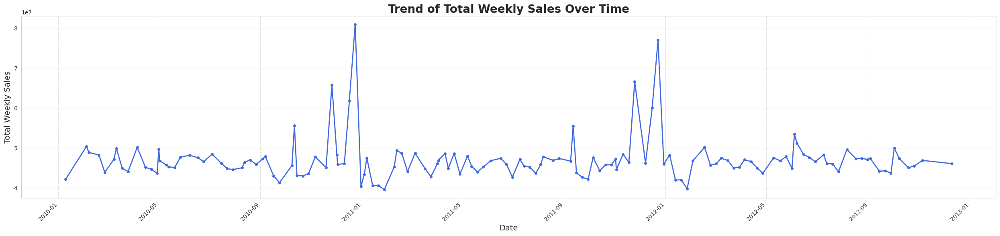

In [14]:
# Set style
sns.set_style("whitegrid")

# Sum of sales across time
sales_across_time = df_new.groupby(by=['Date'], as_index=False)['Weekly_Sales'].sum()

# Plot
plt.figure(figsize=(25, 6))
plt.plot(sales_across_time.Date, sales_across_time.Weekly_Sales,
         marker='o', linestyle='-', color='royalblue', linewidth=2, markersize=4)

# Title and labels
plt.title("Trend of Total Weekly Sales Over Time", fontsize=20, fontweight='bold')
plt.xlabel("Date", fontsize=14)
plt.ylabel("Total Weekly Sales", fontsize=14)

# Rotate x-axis labels
plt.xticks(rotation=45, ha='right')

# Grid and tight layout
plt.grid(True, which='major', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()


In [15]:
print("Sales columns",sales_df.columns)
print("Store columns",store_df.columns)
print("feature columns",feature_df.columns)

Sales columns Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday'], dtype='object')
Store columns Index(['Store', 'Type', 'Size'], dtype='object')
feature columns Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2',
       'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'IsHoliday'],
      dtype='object')


#Weekly Sales Distribution

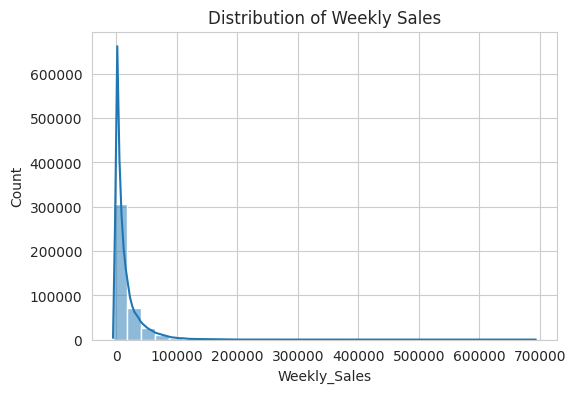

In [16]:
plt.figure(figsize=(6,4))
sns.histplot(sales_df['Weekly_Sales'], bins=30, kde=True)
plt.title("Distribution of Weekly Sales")
plt.show()


#Sales by Holiday vs Non-Holiday

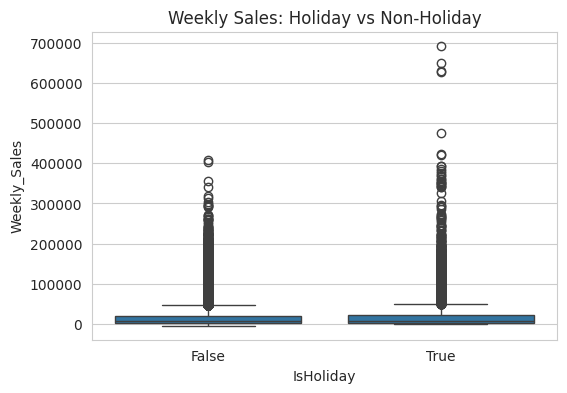

In [17]:
plt.figure(figsize=(6,4))
sns.boxplot(x='IsHoliday', y='Weekly_Sales', data=sales_df)
plt.title("Weekly Sales: Holiday vs Non-Holiday")
plt.show()


#Yearly Total Sales Overview (in Millions)

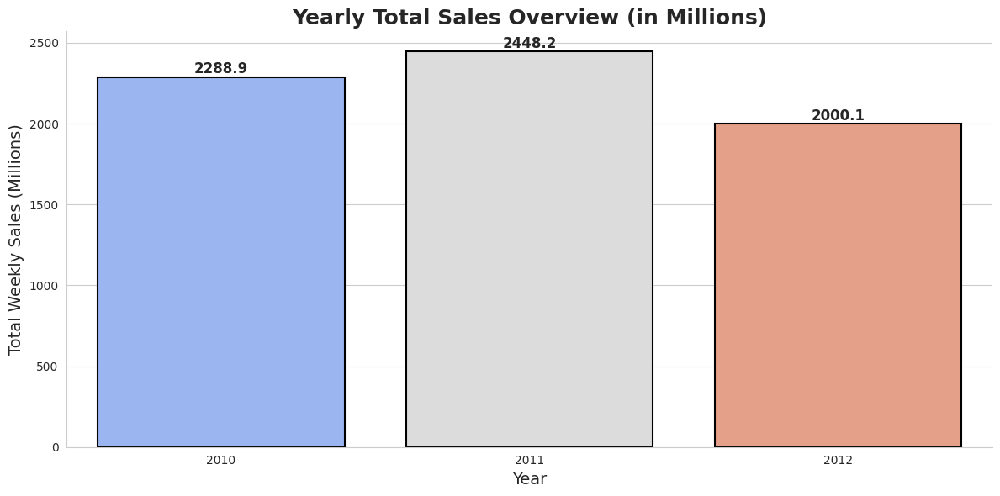

In [18]:
# =========================
# Prepare Yearly Sales Data
# =========================
yearly_sales = (
    df_new
    .groupby(df_new['Date'].dt.year)['Weekly_Sales']
    .sum() / 1_000_000
)

# =========================
# Plot Configuration
# =========================
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Custom color palette (you can change this)
custom_palette = sns.color_palette("coolwarm", len(yearly_sales))

# =========================
# Bar Plot
# =========================
bars = sns.barplot(
    x=yearly_sales.index,
    y=yearly_sales.values,
    palette=custom_palette,
    edgecolor="black",
    linewidth=1.5
)

# =========================
# Add Value Labels on Bars
# =========================
for index, value in enumerate(yearly_sales.values):
    plt.text(
        index,
        value + 1,
        f"{value:.1f}",
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

# =========================
# Titles & Labels
# =========================
plt.title(
    "Yearly Total Sales Overview (in Millions)",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Total Weekly Sales (Millions)", fontsize=14)

# =========================
# Final Touches
# =========================
sns.despine()
plt.tight_layout()
plt.show()


#Monthly Distribution of Weekly Sales (in Millions)

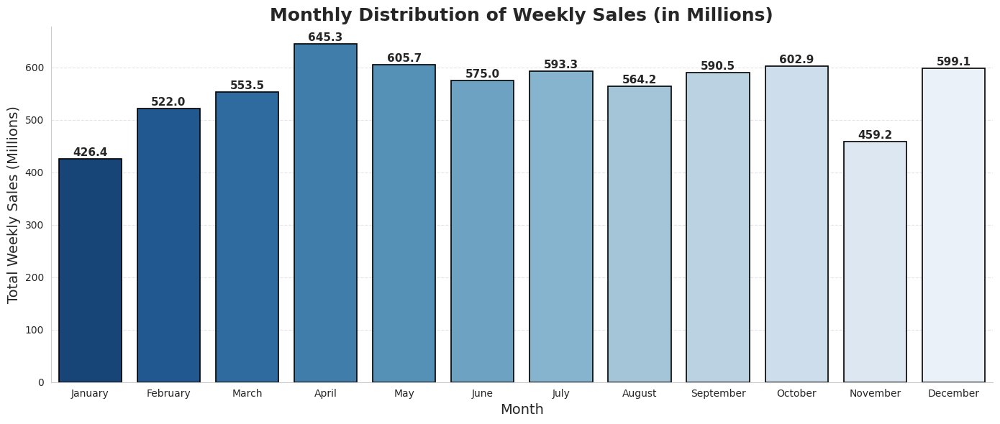

In [19]:
# =========================
# Prepare Monthly Sales Data
# =========================
monthly_sales = (
    df_new
    .groupby(df_new['Date'].dt.month)['Weekly_Sales']
    .sum() / 1_000_000
)

# Convert month numbers to month names
months = [calendar.month_name[m] for m in monthly_sales.index]

# =========================
# Plot Configuration
# =========================
plt.figure(figsize=(14, 6))
sns.set_style("whitegrid")

# Custom color palette
custom_palette = sns.color_palette("Blues_r", len(monthly_sales))

# =========================
# Bar Plot
# =========================
bars = sns.barplot(
    x=months,
    y=monthly_sales.values,
    palette=custom_palette,
    edgecolor="black",
    linewidth=1.2
)

# =========================
# Add Value Labels
# =========================
for index, value in enumerate(monthly_sales.values):
    plt.text(
        index,
        value + 1,
        f"{value:.1f}",
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

# =========================
# Titles & Axis Labels
# =========================
plt.title(
    "Monthly Distribution of Weekly Sales (in Millions)",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Total Weekly Sales (Millions)", fontsize=14)

# =========================
# Final Styling
# =========================
sns.despine()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Summary

Sales show a noticeable increase during major promotional periods and holidays such as Black Friday, Christmas, and New Year, followed by a temporary decline. After this dip, sales gradually regain momentum in specific months.

November reflects comparatively lower purchasing activity, likely because customers postpone spending in anticipation of upcoming holiday and year-end sales.

The sales data for December 2013 appears to be incomplete. Although a spike is visible, total sales did not reach expected levels due to limited data availability for that period.

#Sales Trends by Time:

In [20]:

# Further deepdive into specific dates that drives highest weekly sales
# Top 5 dates where weekly_sales are the highest
sort_sales_across_time = sales_across_time.sort_values('Weekly_Sales', ascending = False) # sort in descending order
sort_sales_across_time.head(5)

,Date,Weekly_Sales
46,2010-12-24,80931415.60
98,2011-12-23,76998241.31
95,2011-11-25,66593605.26
41,2010-11-26,65821003.24
45,2010-12-17,61820799.85


#Temporal Trend of Average Unemployment Rate Across All Stores

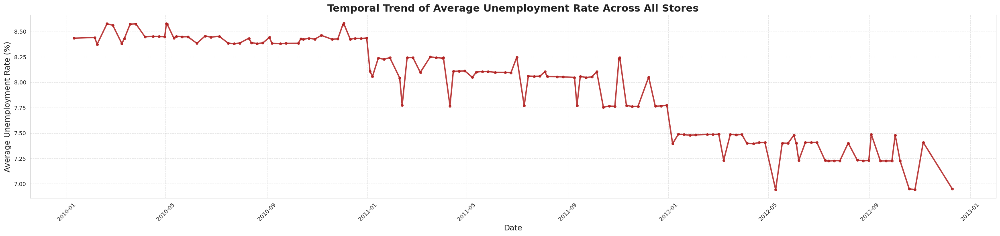

In [21]:
# Prepare data
unn_across_time = df_new.groupby(by=['Date'], as_index=False)['Unemployment'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    unn_across_time['Date'],
    unn_across_time['Unemployment'],
    color='firebrick',
    linewidth=2.5,
    marker='o',
    markersize=4,
    alpha=0.85
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Unemployment Rate (%)", fontsize=14)
plt.title(
    "Temporal Trend of Average Unemployment Rate Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# Rotate x-axis labels for readability
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Findings

Over the period from January 2010 to December 2012, the unemployment rate showed a gradual decline. This trend indicates an improvement in employment conditions, which in turn enhanced consumers’ purchasing power and positively influenced overall sales performance.

#Temporal Trend of Average Consumer Price Index (CPI) Across All Stores

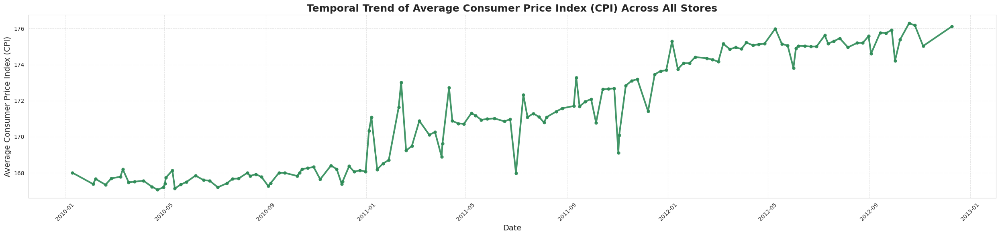

In [22]:
# Prepare data
cpi_across_time = df_new.groupby(by=['Date'], as_index=False)['CPI'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    cpi_across_time['Date'],
    cpi_across_time['CPI'],
    color='seagreen',
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Consumer Price Index (CPI)", fontsize=14)
plt.title(
    "Temporal Trend of Average Consumer Price Index (CPI) Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Findings

From January 2010 to December 2012, the Consumer Price Index (CPI) exhibited a gradual upward trend, indicating rising inflationary pressures over the period.

#Temporal Trend of Average Fuel Price Across All Stores

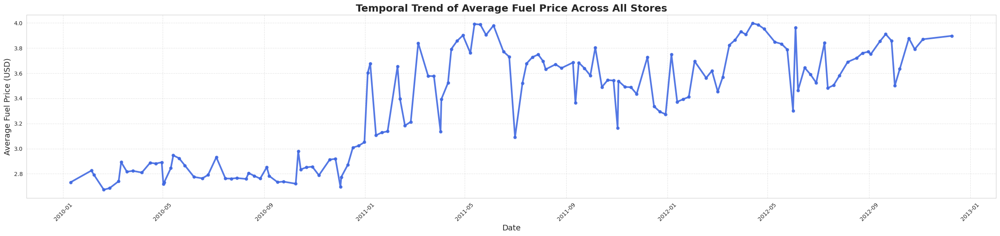

In [23]:
# Prepare data
fuel_across_time = df_new.groupby(by=['Date'], as_index=False)['Fuel_Price'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    fuel_across_time['Date'],
    fuel_across_time['Fuel_Price'],
    color='royalblue',          # changed color
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Fuel Price (USD)", fontsize=14)
plt.title(
    "Temporal Trend of Average Fuel Price Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


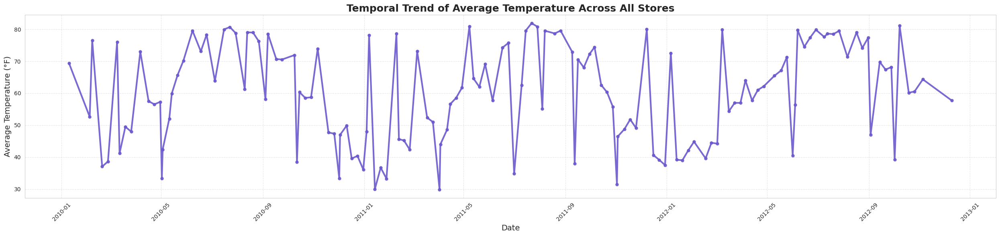

In [24]:
# Prepare data
temp_across_time = df_new.groupby(by=['Date'], as_index=False)['Temperature'].mean()

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(25, 6))
plt.plot(
    temp_across_time['Date'],
    temp_across_time['Temperature'],
    color='slateblue',
    linewidth=3,
    marker='o',
    markersize=5,
    alpha=0.9
)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Temperature (°F)", fontsize=14)
plt.title(
    "Temporal Trend of Average Temperature Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# X-axis formatting
plt.xticks(rotation=45)

# Grid and layout
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


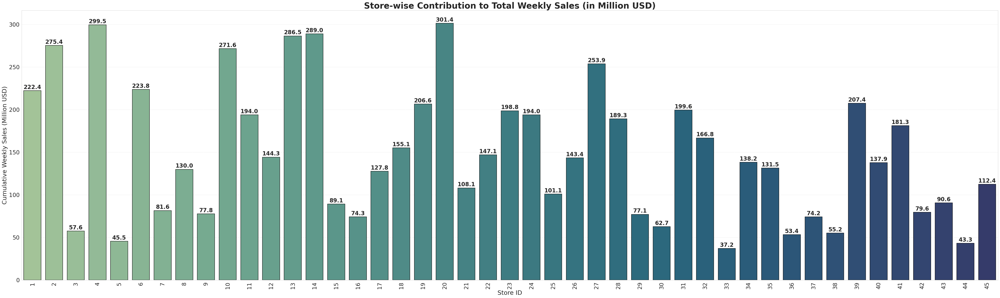

In [25]:
# Prepare data
stores_sales = df_new.groupby(by=['Store'], as_index=False)['Weekly_Sales'].sum()
stores_sales['Weekly_Sales'] = stores_sales['Weekly_Sales'] / 1_000_000  # Convert to millions

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(50, 15))
bars = sns.barplot(
    x='Store',
    y='Weekly_Sales',
    data=stores_sales,
    palette='crest',
    edgecolor='black',
    linewidth=1.2
)

# Add value labels on bars
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(
        f'{height:.1f}',
        (bar.get_x() + bar.get_width() / 2, height + 0.5),
        ha='center',
        va='bottom',
        fontsize=20,
        fontweight='bold'
    )

# Labels and title
plt.xlabel("Store ID", fontsize=22)
plt.ylabel("Cumulative Weekly Sales (Million USD)", fontsize=22)
plt.title(
    "Store-wise Contribution to Total Weekly Sales (in Million USD)",
    fontsize=30,
    fontweight='bold'
)

# Axis styling
plt.xticks(rotation=90, fontsize=20)
plt.yticks(fontsize=20)

# Grid and layout
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Findings

Stores 20 and 4 were identified as the top performers based on weekly sales, whereas stores 44 and 5 recorded the lowest sales, making them the least profitable during the observed period.

#Comparison of Total Weekly Sales Across Store Types

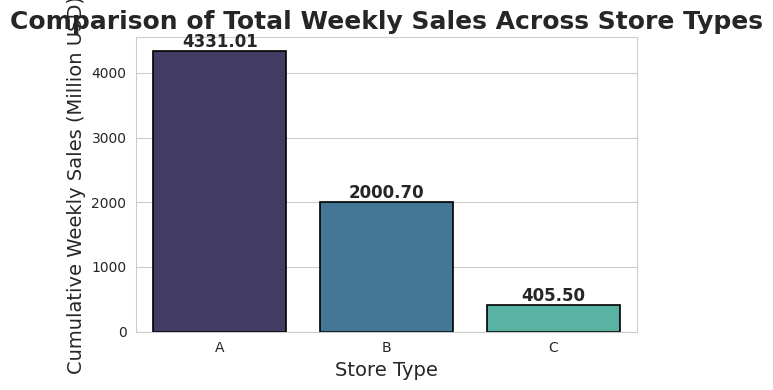

In [26]:
# Prepare data
type_sales = df_new.groupby(by=['Type'], as_index=False)['Weekly_Sales'].sum()
type_sales['Weekly_Sales'] = type_sales['Weekly_Sales'] / 1_000_000  # Convert to millions

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(6, 4))
bars = sns.barplot(
    x='Type',
    y='Weekly_Sales',
    data=type_sales,
    palette='mako',
    edgecolor='black',
    linewidth=1.2
)

# Add value labels on bars
for bar in bars.patches:
    height = bar.get_height()
    bars.annotate(
        f'{height:.2f}',
        (bar.get_x() + bar.get_width() / 2, height + 0.2),
        ha='center',
        va='bottom',
        fontsize=12,
        fontweight='bold'
    )

# Labels and title
plt.xlabel("Store Type", fontsize=14)
plt.ylabel("Cumulative Weekly Sales (Million USD)", fontsize=14)
plt.title(
    "Comparison of Total Weekly Sales Across Store Types",
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout()
plt.show()


Findings

Store Type A, followed by Type B, recorded the highest earnings, whereas Store Type C showed the lowest weekly sales performance.

#Temporal Trends of Average Promotional Markdown Values Across All Stores

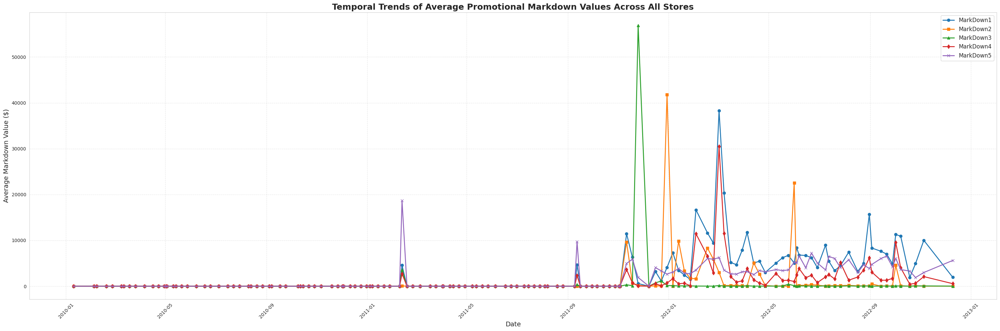

In [27]:
# Grouping and aggregating markdown means
df_markdown = df_new.groupby('Date').agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot
plt.figure(figsize=(30, 10))

# Plot each markdown series
plt.plot(df_markdown.index, df_markdown['MarkDown1'], label='MarkDown1', marker='o', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown2'], label='MarkDown2', marker='s', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown3'], label='MarkDown3', marker='^', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown4'], label='MarkDown4', marker='d', linewidth=2)
plt.plot(df_markdown.index, df_markdown['MarkDown5'], label='MarkDown5', marker='x', linewidth=2)

# Labels and title
plt.xlabel("Date", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Temporal Trends of Average Promotional Markdown Values Across All Stores",
    fontsize=18,
    fontweight='bold'
)

# Legend and formatting
plt.legend(loc='best', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#Monthly Distribution of Average Promotional Markdown Values

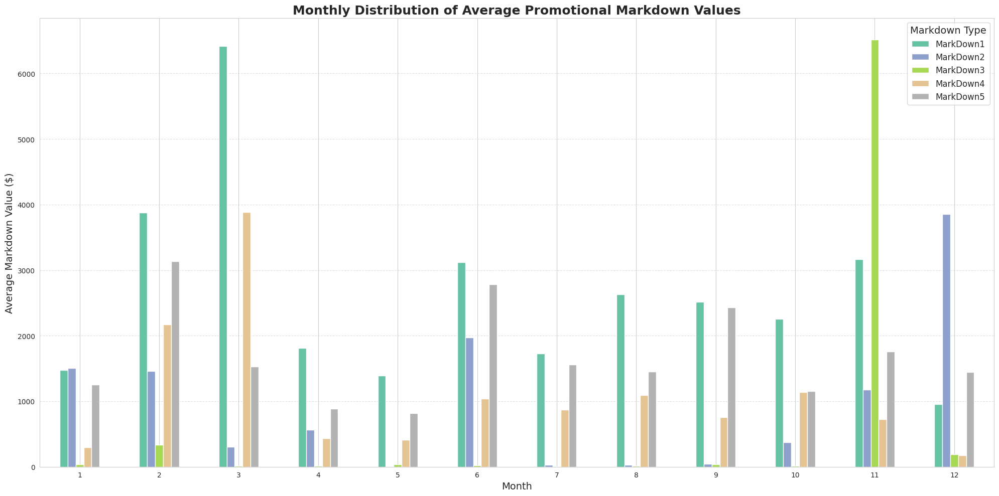

In [28]:
# Aggregate mean markdowns per month
df_markdown_month = df_new.groupby(df_new.Date.dt.month).agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot
ax = df_markdown_month.plot(
    kind='bar',
    figsize=(20, 10),
    rot=0,
    colormap='Set2'
)

# Labels and title
plt.xlabel("Month", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Monthly Distribution of Average Promotional Markdown Values",
    fontsize=18,
    fontweight='bold'
)

# Legend and layout
plt.legend(title='Markdown Type', fontsize=12, title_fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


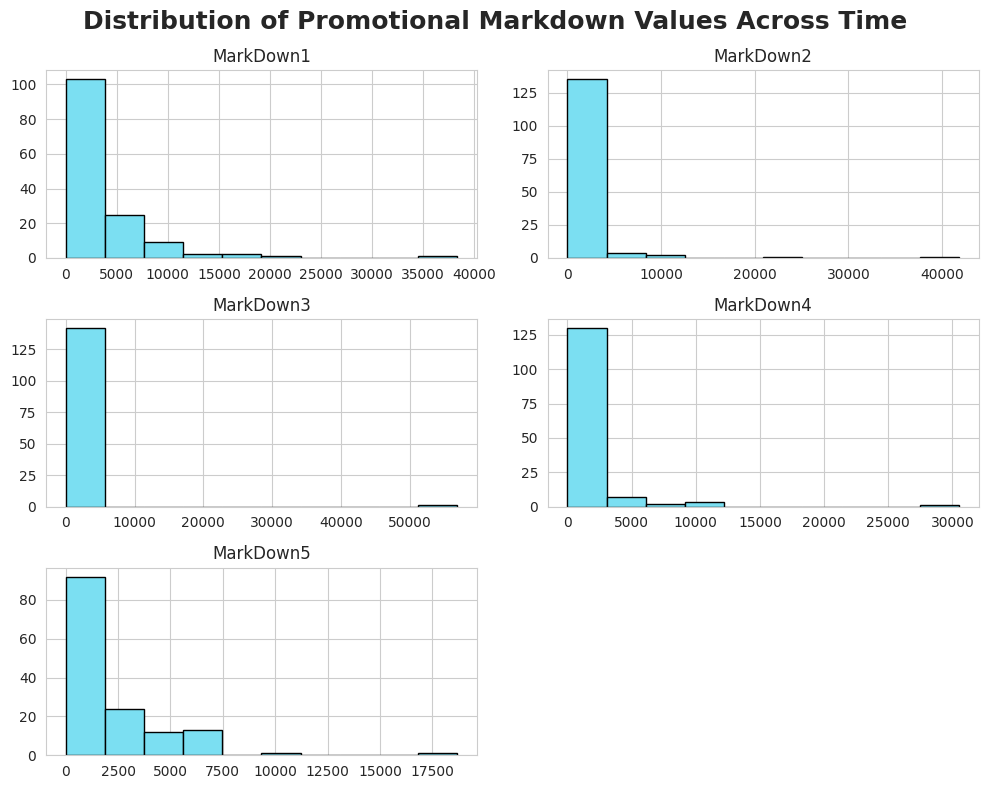

In [29]:
# Frequency distribution of markdown values
sns.set_style("whitegrid")

df_markdown.hist(
    bins=10,
    figsize=(10, 8),
    color='#7bdff2',
    edgecolor='black'
)

# Title and layout
plt.suptitle(
    "Distribution of Promotional Markdown Values Across Time",
    fontsize=18,
    fontweight='bold'
)

plt.tight_layout()
plt.show()


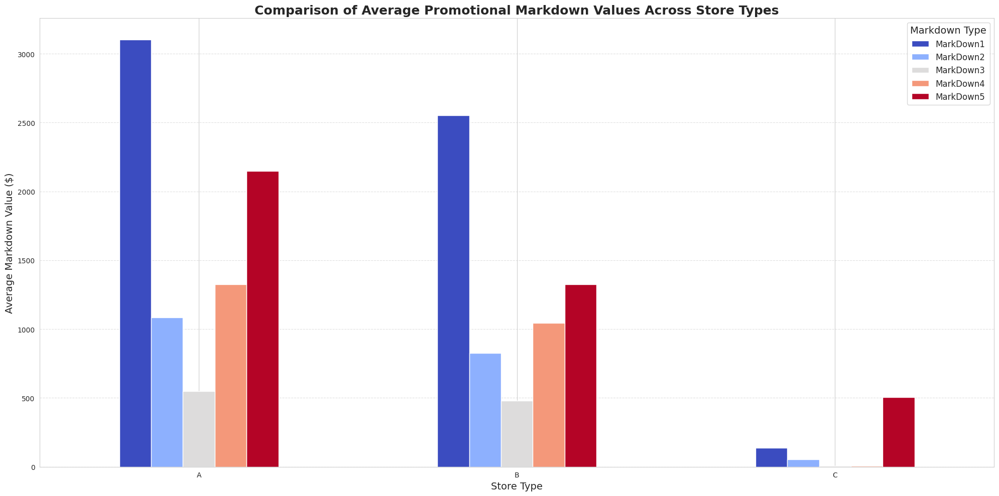

In [30]:
# Aggregate mean markdowns per Store Type
df_markdown_type = df_new.groupby('Type').agg({
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean'
})

# Set visualization style
sns.set_style("whitegrid")

# Create plot (color changed)
ax = df_markdown_type.plot(
    kind='bar',
    figsize=(20, 10),
    rot=0,
    colormap='coolwarm'   # <-- color changed here
)

# Labels and title
plt.xlabel("Store Type", fontsize=14)
plt.ylabel("Average Markdown Value ($)", fontsize=14)
plt.title(
    "Comparison of Average Promotional Markdown Values Across Store Types",
    fontsize=18,
    fontweight='bold'
)

# Legend and layout
plt.legend(title='Markdown Type', fontsize=12, title_fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [31]:
plt.figure(figsize=(16, 6))

# Ensure dataframe format (no data modification)
df_corr = pd.DataFrame(df_new)
df_corr = df_corr.astype(float, errors='ignore')

# Heatmap (color changed)
heatmap = sns.heatmap(
    df_corr.corr(),
    vmin=-1,
    vmax=1,
    annot=True,
    cmap='RdBu_r',   # 🔁 color changed
    linewidths=0.5
)

# Title
heatmap.set_title(
    "Correlation Heatmap of Numerical Features",
    fontdict={'fontsize': 18, 'fontweight': 'bold'},
    pad=12
)

plt.tight_layout()
plt.show()


ValueError: could not convert string to float: 'A'

<Figure size 1600x600 with 0 Axes>

Summary

Weekly sales do not show a strong correlation with the other analyzed parameters.

A negative correlation is observed between the Consumer Price Index (CPI) and Unemployment, indicating that as inflation rises, unemployment tends to decline during the observed period.

Additionally, Unemployment and Fuel Price also exhibit a negative correlation.

#Date-wise Analysis

In this section, we analyze sales trends over time to understand date-based patterns.

First, the sales and feature datasets are merged using the Date column to create a unified timeline.

Next, Weekly Sales are converted into millions to improve readability and interpretation.

Finally, the holiday indicator is refined to clearly identify whether a given day corresponds to a holiday or non-holiday period.

In [33]:
# Aggregate mean and sum of selected features grouped by Date
data_date = df_new.groupby("Date").agg({
    "Temperature": "mean",      # Average temperature per day
    "Fuel_Price": "mean",       # Average fuel price per day
    "IsHoliday": "sum",         # Total holidays per day (sum used since it's likely binary)
    "CPI": "mean",              # Average CPI per day
    "Unemployment": "mean"      # Average unemployment rate per day
})

# Sort data by Date index to maintain chronological order
data_date = data_date.sort_index()

# Select data up to a cutoff date (December 10, 2012)
temp_date_data = data_date.loc[:'2012-12-10']

# Aggregate total weekly sales grouped by Date
data_sales_date = sales_df.groupby("Date").agg({
    "Weekly_Sales": "sum"       # Sum of weekly sales per date
})

# Sort sales data by Date index
data_sales_date.sort_index(inplace=True)

# Convert sales to millions and cast to integers for easier readability
data_sales_date["Weekly_Sales"] = (data_sales_date["Weekly_Sales"] / 1_000_000).astype(int)

# Merge sales and other feature data on Date index (left join to keep all sales dates)
data = pd.merge(
    data_sales_date,
    temp_date_data,
    left_index=True,
    right_index=True,
    how='left'
)

# Convert 'IsHoliday' sum to boolean: True if sum equals 45 (special case), else False
data["IsHoliday"] = data["IsHoliday"].apply(lambda x: True if x == 45.0 else False)

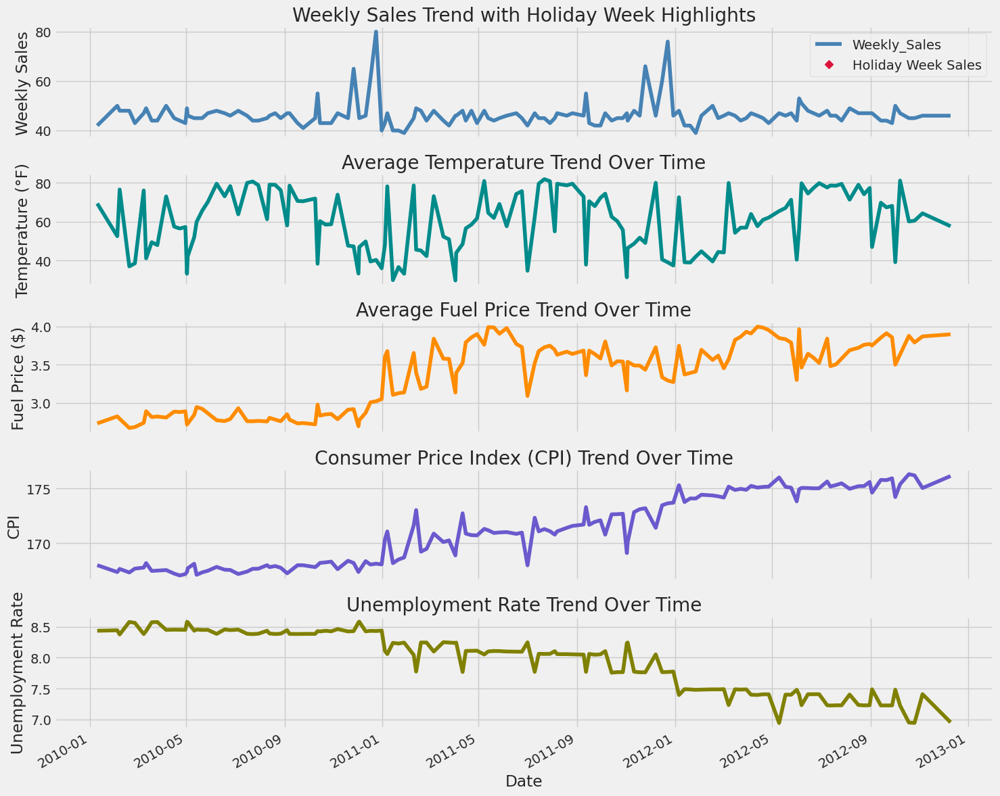

In [34]:
# Style
plt.style.use('fivethirtyeight')

# Create subplots
fig, axes = plt.subplots(5, 1, figsize=(15, 12), sharex=True)

# 1️⃣ Weekly Sales with highlighted Holiday weeks (color changed)
data["Weekly_Sales"].plot(
    ax=axes[0],
    title="Weekly Sales Trend with Holiday Week Highlights",
    color='steelblue'
)

data[data.IsHoliday == True]["Weekly_Sales"].plot(
    marker="D",
    linestyle='',
    ax=axes[0],
    color='crimson',
    label="Holiday Week Sales"
)

axes[0].legend(loc='upper right')
axes[0].set_ylabel("Weekly Sales")

# 2️⃣ Temperature over time (color changed)
data["Temperature"].plot(
    ax=axes[1],
    title="Average Temperature Trend Over Time",
    color='darkcyan'
)
axes[1].set_ylabel("Temperature (°F)")

# 3️⃣ Fuel Price over time (color changed)
data["Fuel_Price"].plot(
    ax=axes[2],
    title="Average Fuel Price Trend Over Time",
    color='darkorange'
)
axes[2].set_ylabel("Fuel Price ($)")

# 4️⃣ CPI over time (color changed)
data["CPI"].plot(
    ax=axes[3],
    title="Consumer Price Index (CPI) Trend Over Time",
    color='slateblue'
)
axes[3].set_ylabel("CPI")

# 5️⃣ Unemployment rate over time (color changed)
data["Unemployment"].plot(
    ax=axes[4],
    title="Unemployment Rate Trend Over Time",
    color='olive'
)
axes[4].set_ylabel("Unemployment Rate")
axes[4].set_xlabel("Date")

# Layout adjustment
plt.tight_layout()
plt.show()


Key Observations

Weekly sales show noticeable spikes during November and December; however, there is no consistent increase in sales across the year as a whole.

Weeks surrounding holiday periods exhibit peak sales activity, highlighting the strong impact of holidays on consumer purchasing behavior.

Both Fuel Price and the Consumer Price Index (CPI) demonstrate an upward trend over the years, indicating rising costs.

In contrast, Unemployment shows a year-over-year decline, reflecting improving employment conditions.

Temperature does not follow a clear trend and instead displays a random pattern over time.

#Data Preprocessing and Feature Engineering

Address missing values with particular attention to the MarkDown variables, ensuring data consistency and reliability.

Develop meaningful new features that may influence sales performance, such as store size, store type, and regional characteristics, to enhance the model’s predictive capability.

In [35]:
#Merging all the 3 dataset together
sale_store_df = sales_df.merge(store_df, on = 'Store',how='left')
sale_store_df.shape
retail_df = sale_store_df.merge(feature_df, on = ['Store','Date','IsHoliday'],how='left')
retail_df.shape

(421570, 16)

In [36]:
final_df=retail_df.copy()

In [37]:
#Check for missing values
final_df.isnull().sum()

,0
Store,0
Dept,0
Date,0
Weekly_Sales,0
IsHoliday,0
Type,0
Size,0
Temperature,0
Fuel_Price,0
MarkDown1,270889


In [38]:
#Check for duplicate rows
final_df.duplicated().sum()

np.int64(0)

In [39]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int64         
 1   Dept          421570 non-null  int64         
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  bool          
 5   Type          421570 non-null  object        
 6   Size          421570 non-null  int64         
 7   Temperature   421570 non-null  float64       
 8   Fuel_Price    421570 non-null  float64       
 9   MarkDown1     150681 non-null  float64       
 10  MarkDown2     111248 non-null  float64       
 11  MarkDown3     137091 non-null  float64       
 12  MarkDown4     134967 non-null  float64       
 13  MarkDown5     151432 non-null  float64       
 14  CPI           421570 non-null  float64       
 15  Unemployment  421

In [40]:
# Convert dates to datetime objects
final_df['Date'] = pd.to_datetime(final_df['Date'],format='%d/%m/%Y')

In [41]:
final_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
count,421570.000000,421570.000000,421570,421570.000000,421570.000000,421570.000000,421570.000000,150681.000000,111248.000000,137091.000000,134967.000000,151432.000000,421570.000000,421570.000000
mean,22.200546,44.260317,2011-06-19 05:35:51.733757184,15981.258123,136727.915739,60.090059,3.361027,7246.420196,3334.628621,1439.421384,3383.168256,4628.975079,171.201947,7.960289
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000
25%,11.000000,18.000000,2010-10-12 00:00:00,2079.650000,93638.000000,46.680000,2.933000,2240.270000,41.600000,5.080000,504.220000,1878.440000,132.022667,6.891000
50%,22.000000,37.000000,2011-06-17 00:00:00,7612.030000,140167.000000,62.090000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.318780,7.866000
75%,33.000000,74.000000,2012-03-02 00:00:00,20205.852500,202505.000000,74.280000,3.738000,9210.900000,1926.940000,103.990000,3595.040000,5563.800000,212.416993,8.572000
max,45.000000,99.000000,2012-12-10 00:00:00,693099.360000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000
std,12.785297,30.492054,NaN,22711.183519,60980.583328,18.447931,0.458515,8291.221345,9475.357325,9623.078290,6292.384031,5962.887455,39.159276,1.863296


#Data Preparation for Anomaly Detection

##Handling Missing Values:
Apply appropriate imputation techniques such as mean, median, or interpolation to address missing values in the sales data. This ensures dataset completeness and prevents bias during analysis.

##Sales Data Normalization:
Normalize the sales values using suitable scaling techniques to bring all data points onto a consistent scale, enabling fair comparisons and stable model performance.

##Square Root Transformation:
Apply a square root transformation to reduce skewness in the sales distribution and stabilize variance.

##Anomaly Detection on Weekly Sales:
Utilize the cleaned, transformed, and normalized dataset to perform anomaly detection on weekly sales, enabling accurate identification of unusual patterns or outliers.

By following this structured approach, anomaly detection models operate on clean, consistent, and well-prepared data, significantly improving their accuracy, robustness, and reliability.

#Kernel Density Distributions of Promotional Markdown Features

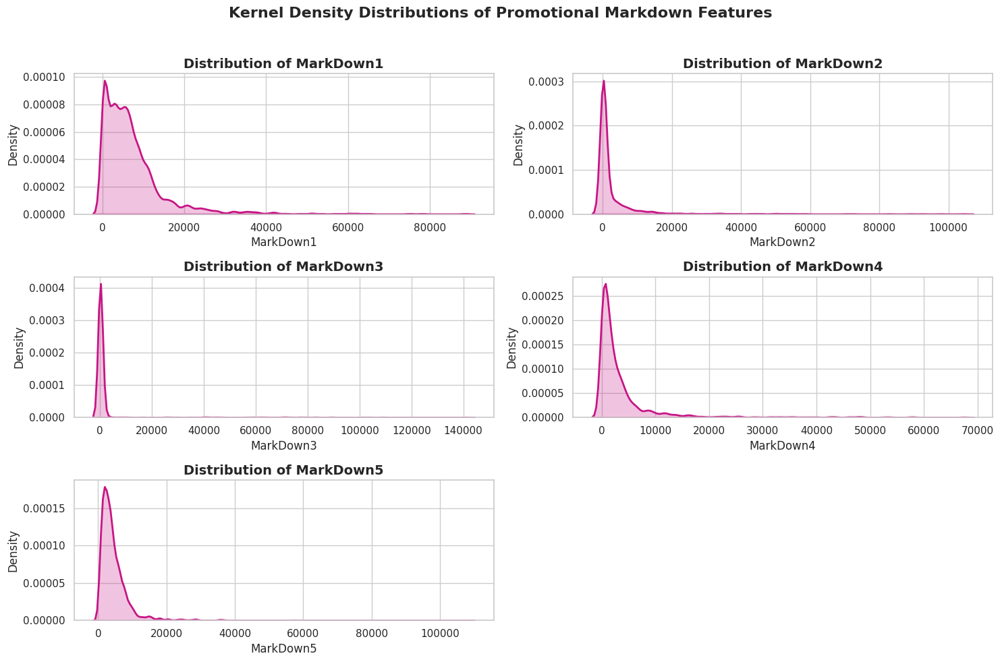

In [42]:
# Define the features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Set Seaborn style
sns.set(style="whitegrid")

# Define subplot dimensions
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Generate KDE plots (color changed)
for i, feature in enumerate(features):
    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        fill=True,
        color='mediumvioletred',   # 🔁 color changed
        linewidth=2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel('Density')

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Kernel Density Distributions of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


#Combined Histogram and Density Analysis of Promotional Markdown Features

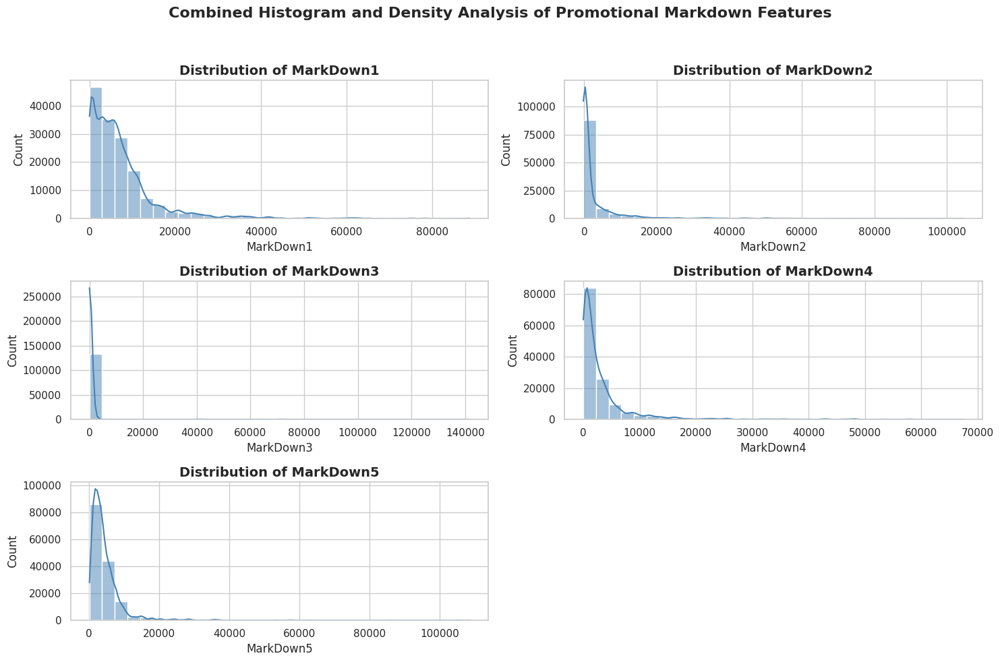

In [43]:
# Set Seaborn style
sns.set(style="whitegrid")

# Features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate subplot layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot histogram + KDE for each feature (color changed)
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        kde=True,
        ax=axes[i],
        color='steelblue',   # 🔁 color changed
        bins=30
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Count")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Combined Histogram and Density Analysis of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#Distribution Analysis of Promotional Markdown Features Using Violin Plots

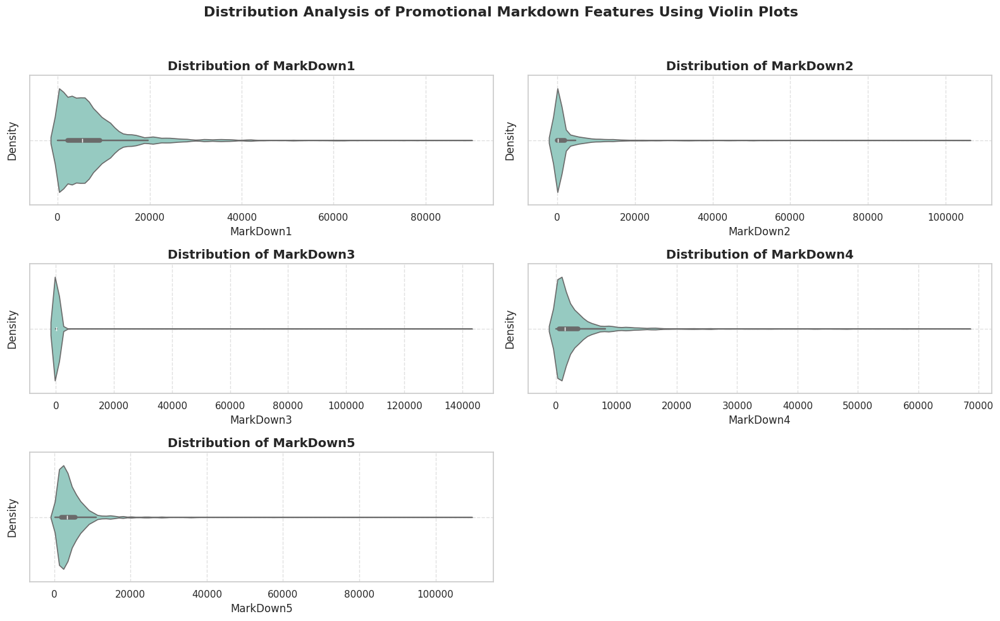

In [44]:
# Set theme for better visuals
sns.set_theme(style="whitegrid")

# Define the Markdown features
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate layout size
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Set up subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(16, 10))
axes = axes.flatten()

# Plot violin plots (color changed)
for i, feature in enumerate(features):
    sns.violinplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        palette='Set3',   # 🔁 color changed
        inner='box',
        linewidth=1.2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel('Density')
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title and layout
plt.suptitle(
    "Distribution Analysis of Promotional Markdown Features Using Violin Plots",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


Findings

The histogram analysis indicates that the Markdown features do not follow a normal distribution and instead exhibit a right-skewed distribution.

Additionally, the boxplots reveal the presence of outliers in the Markdown features. These outliers account for approximately 5–8% of the total records.

Approach

Outlier removal using the Interquartile Range (IQR) method is not recommended in this scenario, as it would result in the elimination of nearly 10% of the dataset, leading to significant data loss and reduced data availability for model training.

Instead, a robust statistical approach is adopted. Specifically, median-based imputation is used for handling missing values, as the median is less sensitive to extreme values compared to the mean.

This strategy helps in making the data distribution more stable and reduces the influence of outliers on the Markdown feature distributions, thereby improving model robustness and reliability.

**Cleaning the data before anomaly detection and handling.**
**Handle Missing Values: Use techniques like imputation median to address missing values in your Markdown data. This step ensures that you have a complete dataset for analysis.**

In [45]:
from sklearn.preprocessing import StandardScaler

# Step 1: Handle Missing Values (Impute with Mean)
median_markdown1 = final_df['MarkDown1'].median()
median_markdown2 = final_df['MarkDown2'].median()
median_markdown3 = final_df['MarkDown3'].median()
median_markdown4 = final_df['MarkDown4'].median()
median_markdown5 = final_df['MarkDown5'].median()

final_df['MarkDown1'].fillna(median_markdown1, inplace=True)
final_df['MarkDown2'].fillna(median_markdown2, inplace=True)
final_df['MarkDown3'].fillna(median_markdown3, inplace=True)
final_df['MarkDown4'].fillna(median_markdown4, inplace=True)
final_df['MarkDown5'].fillna(median_markdown5, inplace=True)

In [46]:
final_df.isnull().sum()

,0
Store,0
Dept,0
Date,0
Weekly_Sales,0
IsHoliday,0
Type,0
Size,0
Temperature,0
Fuel_Price,0
MarkDown1,0


**Markdowns after handling missing values**

#Kernel Density Estimation (KDE) of Promotional Markdown Features

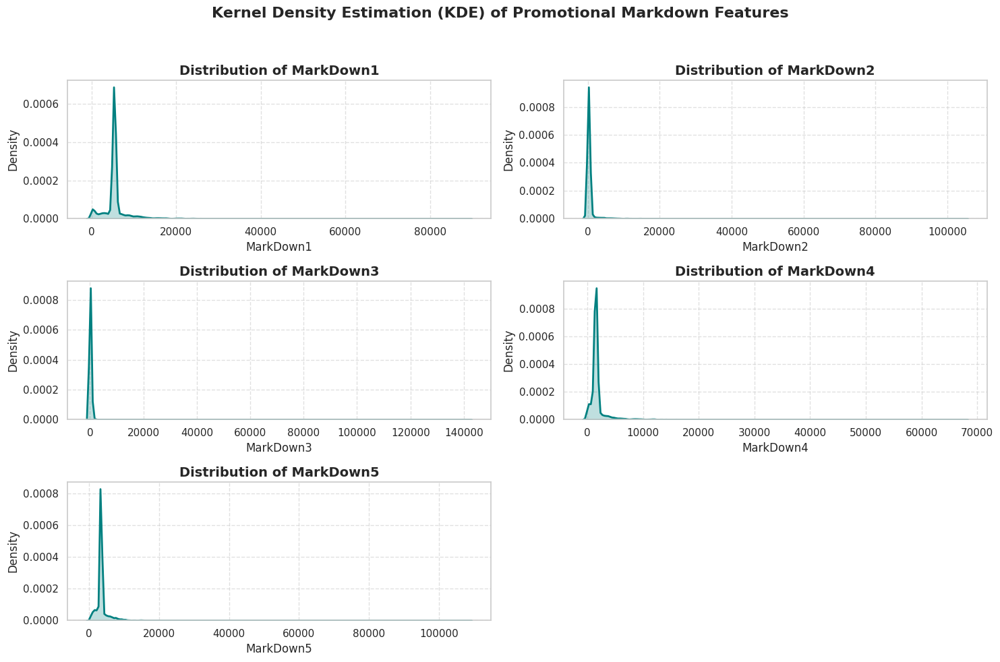

In [47]:
# Set Seaborn style
sns.set_theme(style="whitegrid")

# Features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Determine layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // 2

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot KDE for each feature (color changed)
for i, feature in enumerate(features):
    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        fill=True,
        color='teal',   # 🔁 color changed
        linewidth=2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Density")
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title
plt.suptitle(
    "Kernel Density Estimation (KDE) of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#Combined Histogram and Density Analysis of Promotional Markdown Features

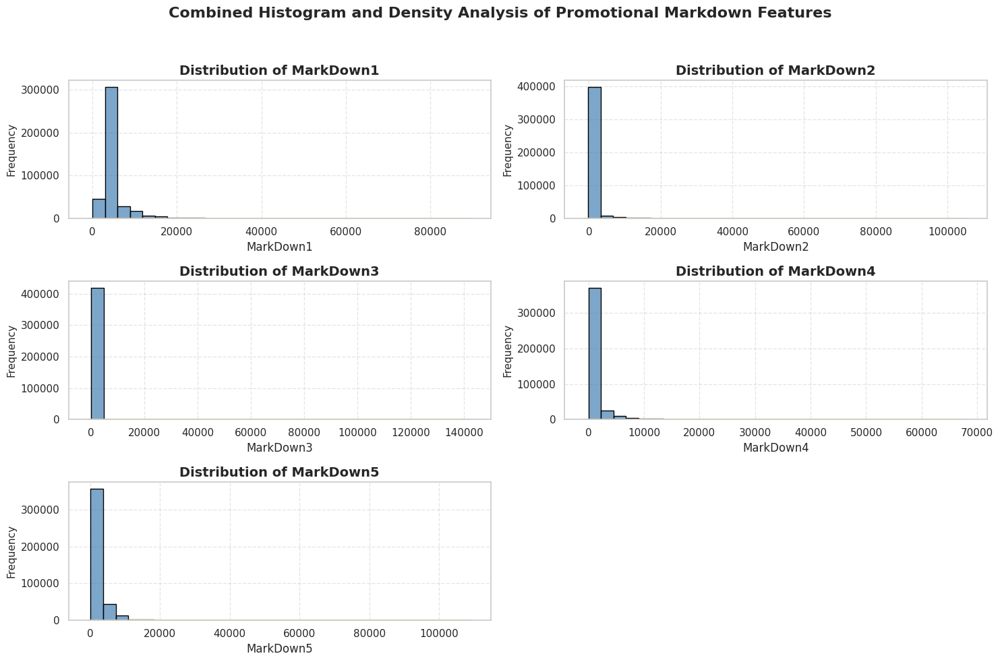

In [48]:
# Set theme
sns.set_theme(style="whitegrid")

# Define the features to visualize
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Layout configuration
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // num_cols

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))
axes = axes.flatten()

# Plot histograms with KDE overlay (colors changed)
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        bins=30,
        color='steelblue',     # 🔁 changed
        edgecolor='black',
        alpha=0.7
    )

    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        color='darkorange',    # 🔁 changed
        linewidth=2
    )

    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=14,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel("Frequency", fontsize=11)
    axes[i].grid(True, linestyle='--', alpha=0.5)

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title
plt.suptitle(
    "Combined Histogram and Density Analysis of Promotional Markdown Features",
    fontsize=16,
    fontweight='bold'
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


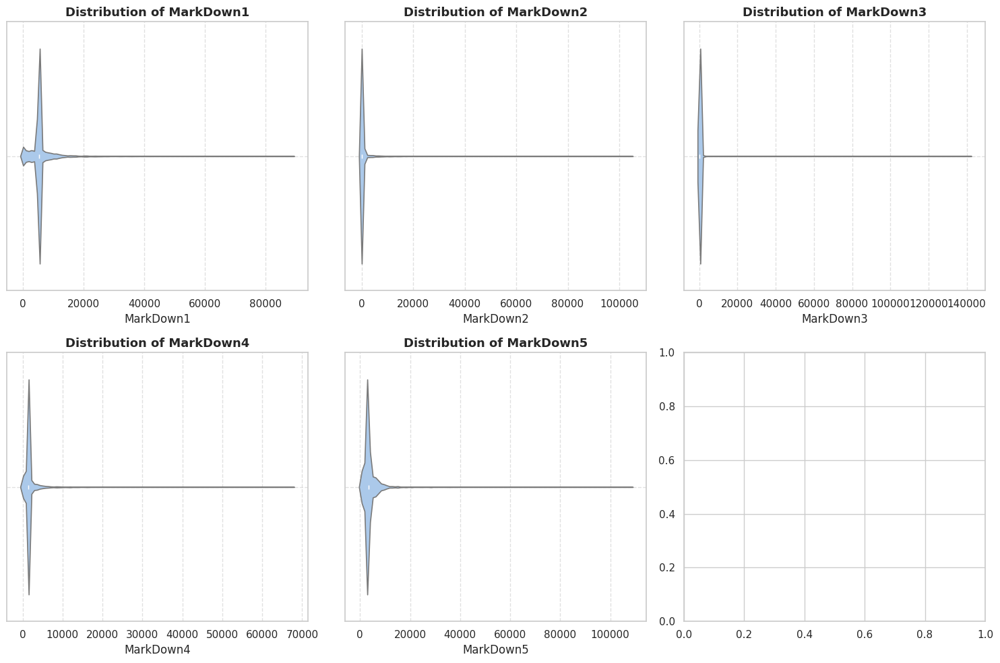

In [49]:
# Set Seaborn theme
sns.set_theme(style="whitegrid")

# Define the features for violin plots
features = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Calculate layout
num_features = len(features)
num_rows = num_features // 2
num_cols = 2 if num_features % 2 == 0 else 3

# Set up subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 10))

# Flatten axes if needed
if num_rows > 1:
    axes = axes.flatten()

# Create violin plots
for i, feature in enumerate(features):
    sns.violinplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        palette='pastel',      # 🔁 color refined
        inner='box',
        linewidth=1.2
    )
    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=13,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature)
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Adjust layout
plt.tight_layout()
plt.show()


Normalize Sales Data

Normalization is applied to bring all sales values onto a consistent scale, ensuring comparability across observations and improving model performance.

To handle anomalous data points, data transformation techniques are used to adjust extreme values so that they fall within a more stable and interpretable range. One commonly used technique is:

Scaling:
Sales data is rescaled to have a mean of 0 and a standard deviation of 1. This standardization helps normalize the data, reduces the influence of extreme values, and enhances interpretability, particularly for statistical and machine learning models.

In [50]:
# Step 2: Normalize Sales Data (Standardization)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Reshape the column to a 2D array and apply min-max scaling
final_df['Weekly_Sales_normalized'] = scaler.fit_transform(final_df['Weekly_Sales'].values.reshape(-1, 1))

### Square Root Transformation to Handle Skewness

Skewed data distributions deviate from normality, meaning the data is not symmetrically distributed around the mean. Instead, a long tail of extreme values exists, which can distort analysis and obscure meaningful patterns.

The square root transformation is an effective technique for handling right-skewed data, particularly when the dataset contains zero or small positive values. This transformation reduces skewness by compressing larger values while preserving the relative differences among smaller values.

Applying a square root transformation helps stabilize variance, makes the distribution more symmetric, and improves the performance and interpretability of statistical and machine learning models.

In [51]:
final_df['Sales_sqrt'] = final_df['Weekly_Sales_normalized'].apply(lambda x: x ** 0.5)
final_df.head(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,192.0,24.6,1481.31,3359.45,211.096358,8.106,0.042851,0.207004
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,192.0,24.6,1481.31,3359.45,211.242170,8.106,0.073097,0.270365


In [52]:
from scipy.stats import skew

# Calculate skewness of a column 'data_column'
skewness = skew(final_df['Sales_sqrt'])
print("Skewness:", skewness)

Skewness: 1.5372648545920218


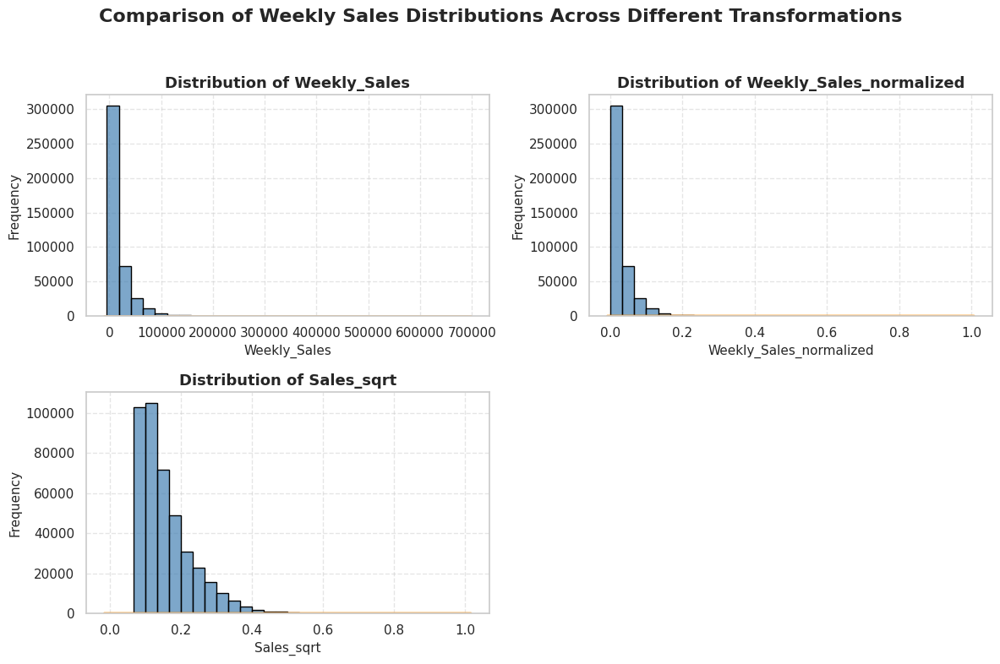

In [53]:
# Features to plot
features = ['Weekly_Sales', 'Weekly_Sales_normalized', 'Sales_sqrt']

# Set up layout
num_features = len(features)
num_cols = 2
num_rows = (num_features + 1) // num_cols

# Set visual theme
sns.set_style("whitegrid")

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 8))
axes = axes.flatten()

# Plot histograms with KDE overlay
for i, feature in enumerate(features):
    sns.histplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        bins=30,
        color='steelblue',     # 🔁 color changed
        edgecolor='black',
        alpha=0.7
    )

    sns.kdeplot(
        data=final_df,
        x=feature,
        ax=axes[i],
        color='darkorange',    # 🔁 color changed
        linewidth=2
    )

    axes[i].set_title(
        f'Distribution of {feature}',
        fontsize=13,
        fontweight='bold'
    )
    axes[i].set_xlabel(feature, fontsize=11)
    axes[i].set_ylabel("Frequency", fontsize=11)
    axes[i].grid(True, linestyle='--', alpha=0.5)

# Remove empty subplots if any
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Improved overall title
plt.suptitle(
    "Comparison of Weekly Sales Distributions Across Different Transformations",
    fontsize=16,
    fontweight='bold'
)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


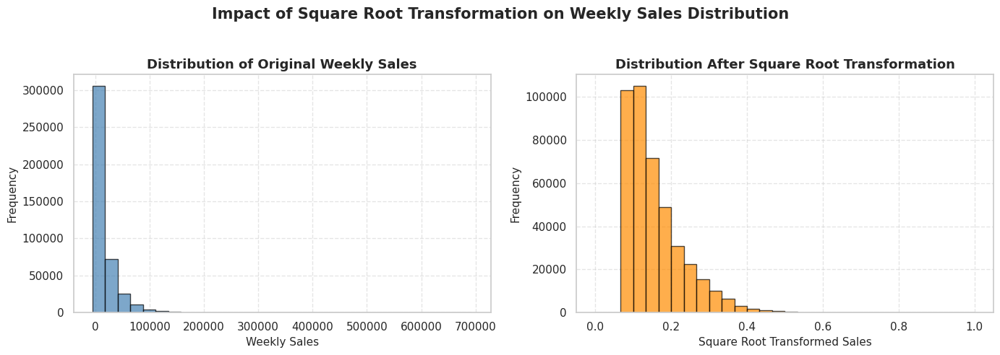

In [54]:
# Set visual style
sns.set_style("whitegrid")

# Create a 1x2 subplot for side-by-side comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Original Weekly Sales distribution (color changed)
axes[0].hist(
    final_df['Weekly_Sales'],
    bins=30,
    color='steelblue',      # 🔁 changed
    edgecolor='black',
    alpha=0.7
)
axes[0].set_title(
    "Distribution of Original Weekly Sales",
    fontsize=13,
    fontweight='bold'
)
axes[0].set_xlabel("Weekly Sales", fontsize=11)
axes[0].set_ylabel("Frequency", fontsize=11)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Square Root Transformed distribution (color changed)
axes[1].hist(
    final_df['Sales_sqrt'],
    bins=30,
    color='darkorange',     # 🔁 changed
    edgecolor='black',
    alpha=0.7
)
axes[1].set_title(
    "Distribution After Square Root Transformation",
    fontsize=13,
    fontweight='bold'
)
axes[1].set_xlabel("Square Root Transformed Sales", fontsize=11)
axes[1].set_ylabel("Frequency", fontsize=11)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Improved overall title
plt.suptitle(
    "Impact of Square Root Transformation on Weekly Sales Distribution",
    fontsize=15,
    fontweight='bold'
)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


##Anomaly Detection in Sales Data

Analyze sales data across stores and departments to identify unusual or unexpected sales patterns.

Investigate the underlying causes of detected anomalies, such as holiday effects, markdown events, or changes in economic indicators.

Apply appropriate anomaly-handling techniques to ensure the data is reliable and suitable for further analysis and modeling.

##Mitigation Strategies

Instead of removing anomalous observations, the following strategies are employed to minimize their impact while preserving valuable information:

Data Cleaning:
Identify and correct data inconsistencies or errors using manual inspection or automated validation techniques.

Data Normalization:
Transform the data into a more stable and standardized form, making anomalies easier to detect and reducing their influence on analytical models.

Data Imputation:
Address missing values using statistical methods or machine learning–based imputation techniques to maintain dataset completeness.

##**Anamolay Detection in Weekly Sales**

Approaches:

**Descriptive Statistics**

### **Descriptive Statistics:**

Descriptive statistics are among the foundational methods for anomaly detection in retail.

Techniques like mean, median, and standard deviation can be used to calculate summary statistics, which help identify point anomalies.

In [55]:
# Calculate mean and standard deviation
mean_sales = np.mean(final_df['Sales_sqrt'])
std_deviation = np.std(final_df['Sales_sqrt'])

# Set a threshold for flagging anomalies (e.g., 3 standard deviations from the mean)
threshold = mean_sales + 3 * std_deviation

# Identify anomalies
anomalies = [data_point for data_point in final_df['Sales_sqrt'] if data_point > threshold]

#If the data point exceeds the threshold, it assigns a value of 1 (indicating an anomaly), otherwise it assigns a value of 0.
final_df['Anomaly'] = [1 if data_point > threshold else 0 for data_point in final_df['Sales_sqrt']]

print("Retail Weekly Sales Data:")
print("Mean Sales:", mean_sales)
print("Standard Deviation:", std_deviation)
print("Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales :", len(anomalies))
print("Total number of Anomalies in Weekly Sales (percentage-wise) :", round((len(anomalies)/len(sales_df))*100,2))

#Flagged anomalies in Sales dataset

print("Anomalies in Weekly_Sales:",final_df[final_df['Anomaly']==1].shape[0])

Retail Weekly Sales Data:
Mean Sales: 0.1569383540371942
Standard Deviation: 0.07355145612450474
Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales : 6155
Total number of Anomalies in Weekly Sales (percentage-wise) : 1.46
Anomalies in Weekly_Sales: 6155


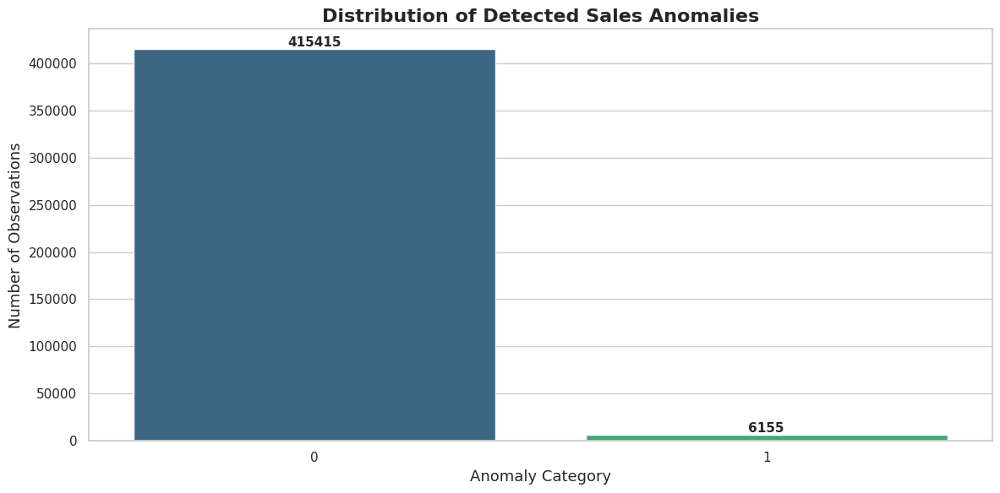

In [56]:
# Set visual style
sns.set_style("whitegrid")

# Set figure size
plt.figure(figsize=(12, 6))

# Create the barplot for Anomaly value counts (color changed)
ax = sns.barplot(
    x=final_df['Anomaly'].value_counts().index,
    y=final_df['Anomaly'].value_counts().values,
    palette='viridis'   # 🔁 color changed
)

# Add data labels above each bar
for p in ax.patches:
    ax.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

# Improved title and labels
ax.set_title(
    "Distribution of Detected Sales Anomalies",
    fontsize=16,
    fontweight='bold'
)
ax.set_xlabel("Anomaly Category", fontsize=13)
ax.set_ylabel("Number of Observations", fontsize=13)

# Layout adjustment
plt.tight_layout()
plt.show()


Potential Causes of Anomalies in Weekly Sales
Comparative Analysis of Features with Respect to Anomalies

To understand the drivers behind anomalous behavior in weekly sales, various influencing features are compared against the identified anomalies. This comparative analysis helps determine whether unusual sales patterns are driven by internal factors or external economic conditions.

Role of Unemployment in Sales Anomalies

Unemployment is examined as a potential contributing factor to anomalies in weekly sales. Changes in unemployment levels can directly affect consumer purchasing power and spending behavior. Periods of higher unemployment may correspond to sudden drops in sales, while declining unemployment may coincide with unexpected sales surges. Analyzing this relationship provides insights into whether fluctuations in employment conditions are associated with abnormal sales patterns.

In [57]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Unemployment']>=final_df['Unemployment'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

42.17709179528838

In [58]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Unemployment']<=final_df['Unemployment'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

57.82290820471162

Assessing the Relationship Between Consumer Price Index (CPI) and Sales Anomalies

The Consumer Price Index (CPI) is evaluated to determine whether it has any observable association with anomalies in weekly sales. Since CPI reflects changes in the overall price level, it may indirectly influence consumer spending behavior.

This analysis compares CPI trends during anomalous and non-anomalous periods to assess whether inflationary fluctuations coincide with unusual variations in weekly sales. The objective is not to infer direct causality, but to examine whether CPI movements align with observed sales anomalies and contribute to abnormal sales behavior.

In [59]:
len(final_df[(final_df['Anomaly']==1) & (final_df['CPI']>=final_df['CPI'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

52.948822095857025

In [60]:
len(final_df[(final_df['Anomaly']==1) & (final_df['CPI']<=final_df['CPI'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

47.051177904142975

Assessing the Impact of Fuel Price on Sales Anomalies

Fuel price is evaluated to determine whether it has any measurable influence on anomalies observed in weekly sales. This analysis focuses on identifying potential associations between fluctuations in fuel prices and abnormal sales patterns, without presuming a direct causal relationship.

By comparing fuel price trends during anomalous and non-anomalous periods, we assess whether variations in fuel costs coincide with unusual changes in weekly sales.

In [61]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Fuel_Price']>=final_df['Fuel_Price'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

51.616571892770104

In [62]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Fuel_Price']<=final_df['Fuel_Price'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

48.383428107229896

Assessing the Relationship Between Temperature and Sales Anomalies

Temperature is evaluated to determine whether it has any observable association with anomalies in weekly sales. Since temperature variations can influence consumer behavior and seasonal demand patterns, they may contribute to unusual fluctuations in sales.

This analysis compares temperature trends during anomalous and non-anomalous periods to assess whether extreme or irregular temperature changes coincide with abnormal variations in weekly sales. The focus is on identifying potential associations rather than establishing a direct causal relationship.

In [63]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Temperature']>=final_df['Temperature'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

48.80584890333063

In [64]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Temperature']<=final_df['Temperature'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

51.19415109666937

Assessing the Relationship Between Store Size and Sales Anomalies

Store size is evaluated to determine whether it has any association with anomalies observed in weekly sales. Larger stores typically have higher sales capacity, while smaller stores may exhibit greater volatility due to lower transaction volumes.

This analysis compares sales anomalies across different store sizes to assess whether abnormal sales patterns are more prevalent in certain size categories. The objective is to identify potential associations rather than infer a direct causal relationship between store size and sales anomalies.

In [65]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Size']>=final_df['Size'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

86.4987814784728

In [66]:
len(final_df[(final_df['Anomaly']==1) & (final_df['Size']<=final_df['Size'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

13.501218521527214

Assessing the Relationship Between Holidays and Sales Anomalies

Holiday periods are evaluated to determine whether they are associated with anomalies in weekly sales. Holidays often drive significant changes in consumer purchasing behavior, which can result in unusually high or low sales compared to regular weeks.

This analysis compares sales patterns during holiday and non-holiday periods to assess whether anomalies occur more frequently around holidays. The objective is to identify potential associations between holiday periods and abnormal sales behavior, without assuming direct causality.

In [67]:
len(final_df[(final_df['Anomaly']==1) & (final_df['IsHoliday']==True)])*100/len(final_df[(final_df['Anomaly']==1)])

9.033306255077173

In [68]:
len(final_df[(final_df['Anomaly']==1) & (final_df['IsHoliday']==False)])*100/len(final_df[(final_df['Anomaly']==1)])

90.96669374492282

Assessing the Relationship Between MarkDown1 and Sales Anomalies

MarkDown1 is evaluated to determine whether it has any association with anomalies observed in weekly sales. Markdowns can significantly influence consumer purchasing behavior by altering price sensitivity and demand patterns.

This analysis compares MarkDown1 levels during anomalous and non-anomalous sales periods to assess whether higher or irregular markdown activity coincides with abnormal fluctuations in weekly sales. The focus remains on identifying potential associations rather than establishing a direct causal relationship.

In [70]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown1']>=final_df['MarkDown1'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

22.274573517465477

In [71]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown1']<=final_df['MarkDown1'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

77.72542648253453

Assessing the Relationship Between MarkDown2 and Sales Anomalies

MarkDown2 is examined to evaluate whether it has any observable association with anomalies in weekly sales. As a promotional pricing factor, MarkDown2 may influence customer demand and lead to unusual fluctuations in sales volumes.

This analysis compares MarkDown2 levels during anomalous and non-anomalous periods to assess whether variations in markdown intensity coincide with abnormal sales behavior. The objective is to identify potential associations rather than infer a direct causal relationship.

In [72]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown2']>=final_df['MarkDown2'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

9.277010560519903

In [73]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown2']<=final_df['MarkDown2'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

90.7229894394801

Assessing the Relationship Between MarkDown3 and Sales Anomalies

MarkDown3 is analyzed to determine whether it has any association with anomalies observed in weekly sales. As a pricing and promotional variable, MarkDown3 may impact customer purchasing behavior and contribute to irregular sales patterns.

This assessment compares MarkDown3 values during anomalous and non-anomalous sales periods to evaluate whether fluctuations in markdown levels align with abnormal variations in weekly sales. The focus remains on identifying potential relationships rather than establishing direct causation.

In [74]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown3']>=final_df['MarkDown3'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

7.733549959382616

In [76]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown3']<=final_df['MarkDown3'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

92.26645004061739

Assessing the Relationship Between MarkDown4 and Sales Anomalies

MarkDown4 is evaluated to determine whether it has any observable association with anomalies in weekly sales. As a markdown-related promotional factor, MarkDown4 may influence customer purchasing behavior and potentially lead to unusual sales fluctuations.

This analysis compares MarkDown4 levels during anomalous and non-anomalous sales periods to assess whether variations in markdown activity coincide with abnormal weekly sales patterns. The objective is to identify potential associations rather than establish a direct causal relationship.

In [77]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown4']>=final_df['MarkDown4'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

18.44029244516653

In [78]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown4']<=final_df['MarkDown4'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

81.55970755483347

Assessing the Relationship Between MarkDown5 and Sales Anomalies

MarkDown5 is examined to evaluate whether it has any association with anomalies in weekly sales. As a promotional pricing variable, MarkDown5 may influence customer demand and contribute to irregular sales patterns.

This analysis compares MarkDown5 values during anomalous and non-anomalous sales periods to assess whether changes in markdown intensity coincide with abnormal fluctuations in weekly sales. The focus remains on identifying potential relationships rather than inferring direct causality.

In [79]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown5']>=final_df['MarkDown5'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

24.06173842404549

In [80]:
len(final_df[(final_df['Anomaly']==1) & (final_df['MarkDown5']<=final_df['MarkDown5'].mean())])*100/len(final_df[(final_df['Anomaly']==1)])

75.93826157595451

In [81]:
df_anomalies=final_df[(final_df['Anomaly']==1)].reset_index(drop=True)
df_anomalies.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly
0,1,7,2010-12-17,96198.12,False,A,151315,49.84,2.869,5347.45,192.00,24.6,1481.31,3359.45,211.405312,7.838,0.144949,0.380721,1
1,1,7,2010-12-24,166697.72,False,A,151315,52.33,2.886,5347.45,192.00,24.6,1481.31,3359.45,211.405122,7.838,0.245938,0.495922,1
2,1,7,2011-12-23,119302.15,False,A,151315,47.96,3.112,2725.36,40.48,634.7,24.90,2739.43,219.357722,7.866,0.178045,0.421954,1
3,1,38,2010-05-02,115564.35,False,A,151315,42.31,2.572,5347.45,192.00,24.6,1481.31,3359.45,211.096358,8.106,0.172691,0.415561,1
4,1,38,2010-02-19,98672.59,False,A,151315,39.93,2.514,5347.45,192.00,24.6,1481.31,3359.45,211.289143,8.106,0.148493,0.385348,1


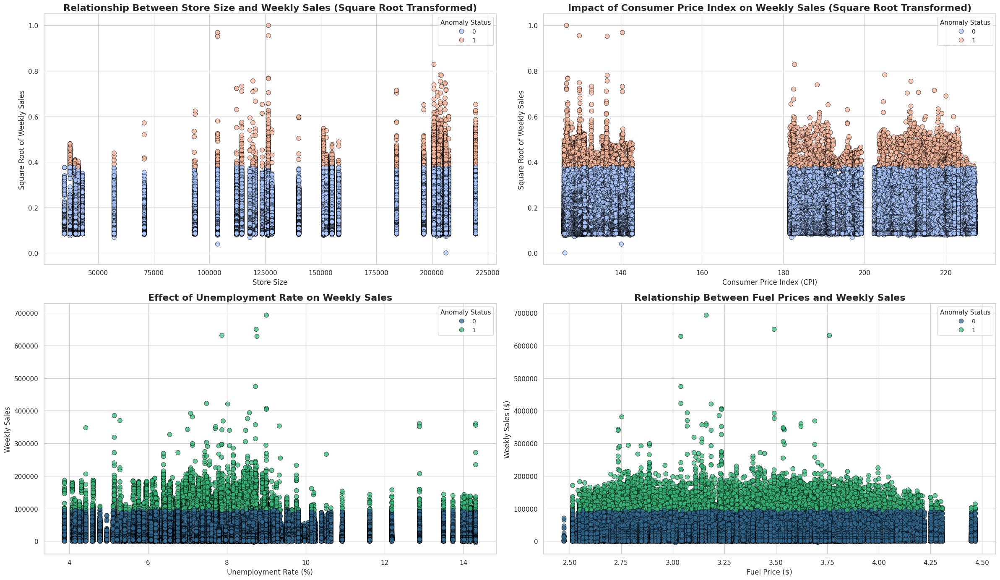

In [82]:
# Set seaborn style
sns.set(style="whitegrid")

# Set up the figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(24, 14))
axes = axes.flatten()

# Common scatter settings (color changed)
scatter_kws = {
    'data': final_df,
    'hue': 'Anomaly',
    'palette': 'coolwarm',   # 🔁 changed
    's': 60,
    'alpha': 0.75,
    'edgecolor': 'black'
}

# Plot 1: Store Size vs Sales (Sqrt)
sns.scatterplot(x='Size', y='Sales_sqrt', ax=axes[0], **scatter_kws)
axes[0].set_title(
    'Relationship Between Store Size and Weekly Sales (Square Root Transformed)',
    fontsize=16,
    fontweight='bold'
)
axes[0].set_xlabel('Store Size', fontsize=12)
axes[0].set_ylabel('Square Root of Weekly Sales', fontsize=12)

# Plot 2: CPI vs Sales (Sqrt)
sns.scatterplot(x='CPI', y='Sales_sqrt', ax=axes[1], **scatter_kws)
axes[1].set_title(
    'Impact of Consumer Price Index on Weekly Sales (Square Root Transformed)',
    fontsize=16,
    fontweight='bold'
)
axes[1].set_xlabel('Consumer Price Index (CPI)', fontsize=12)
axes[1].set_ylabel('Square Root of Weekly Sales', fontsize=12)

# Plot 3: Unemployment vs Weekly Sales (palette changed)
scatter_kws['palette'] = 'viridis'   # 🔁 changed
sns.scatterplot(x='Unemployment', y='Weekly_Sales', ax=axes[2], **scatter_kws)
axes[2].set_title(
    'Effect of Unemployment Rate on Weekly Sales',
    fontsize=16,
    fontweight='bold'
)
axes[2].set_xlabel('Unemployment Rate (%)', fontsize=12)
axes[2].set_ylabel('Weekly Sales', fontsize=12)

# Plot 4: Fuel Price vs Weekly Sales
sns.scatterplot(x='Fuel_Price', y='Weekly_Sales', ax=axes[3], **scatter_kws)
axes[3].set_title(
    'Relationship Between Fuel Prices and Weekly Sales',
    fontsize=16,
    fontweight='bold'
)
axes[3].set_xlabel('Fuel Price ($)', fontsize=12)
axes[3].set_ylabel('Weekly Sales ($)', fontsize=12)

# Legends
for ax in axes:
    ax.legend(title='Anomaly Status', title_fontsize=11, fontsize=10, loc='best')

# Layout
plt.tight_layout()
plt.show()


#Time-Series Analysis of Weekly Sales with Anomaly Detection

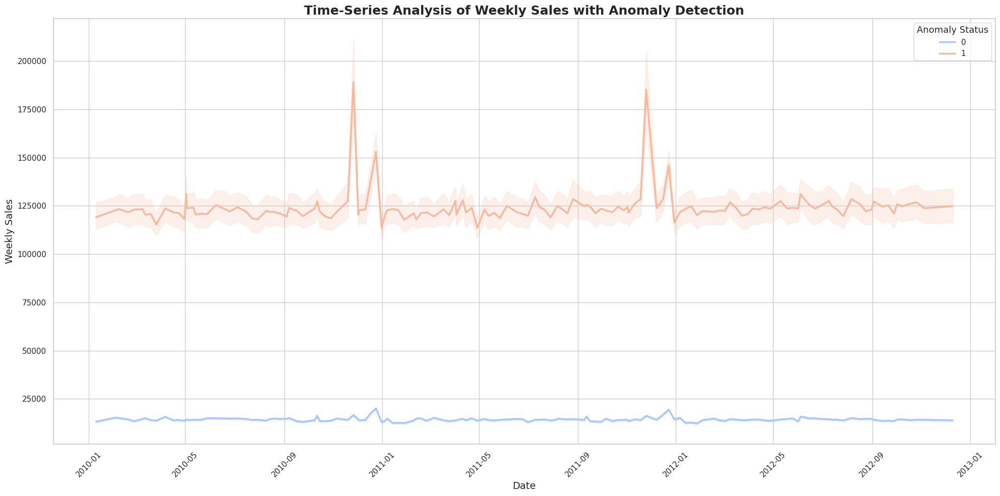

In [83]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set the figure size for better time-series readability
plt.figure(figsize=(20, 10))

# Line plot showing weekly sales trends with anomaly segmentation
ax = sns.lineplot(
    x='Date',
    y='Weekly_Sales',
    hue='Anomaly',
    data=final_df,
    palette='coolwarm',    # 🔁 color changed
    linewidth=2.5
)

# Plot title and axis labels
plt.title(
    "Time-Series Analysis of Weekly Sales with Anomaly Detection",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Date", fontsize=14)
plt.ylabel("Weekly Sales", fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Improve legend formatting
plt.legend(
    title='Anomaly Status',
    title_fontsize=13,
    fontsize=11,
    loc='best'
)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


#Department-wise Weekly Sales Distribution for Anomalous Observations

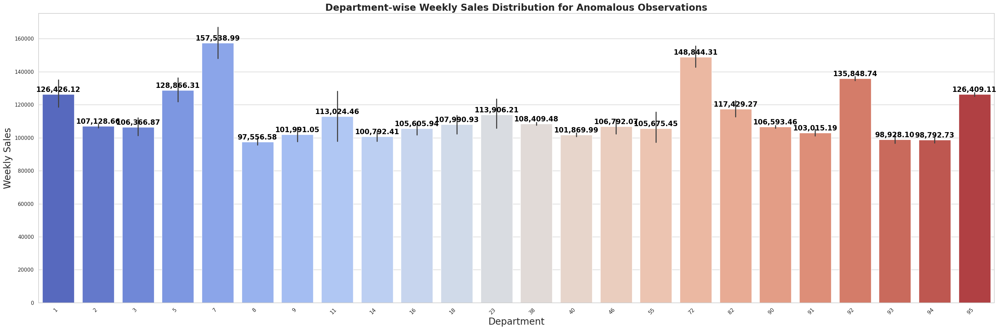

In [85]:
# Set seaborn theme for consistent EDA styling
sns.set(style="whitegrid")

# Set figure size for clear department-level comparison
plt.figure(figsize=(30, 10))

# Bar plot showing weekly sales for anomalous records by department
ax = sns.barplot(
    x='Dept',
    y='Weekly_Sales',
    data=df_anomalies,
    palette='coolwarm'   # 🔁 color changed
)

# Rotate department labels for better readability
plt.xticks(rotation=45, ha='right', fontsize=11)

# Annotate each bar with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='baseline',
        fontsize=15,
        fontweight='bold',
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Titles and axis labels
plt.title(
    "Department-wise Weekly Sales Distribution for Anomalous Observations",
    fontsize=20,
    fontweight='bold'
)
plt.xlabel("Department", fontsize=20)
plt.ylabel("Weekly Sales", fontsize=20)

# Optimize spacing
plt.tight_layout()

# Display the plot
plt.show()


#Store-wise Weekly Sales Distribution for Anomalous Records

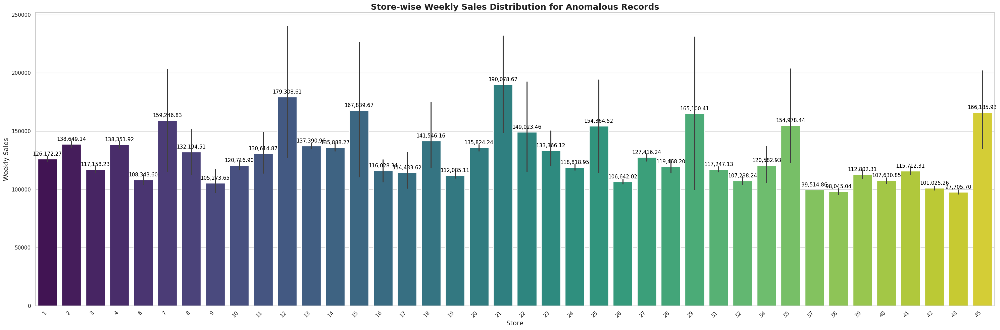

In [86]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set figure size for clear store-level comparison
plt.figure(figsize=(30, 10))

# Sort anomalous sales in descending order for better visual ranking
df_sorted = df_anomalies.sort_values(by='Weekly_Sales', ascending=False)

# Bar plot showing weekly sales anomalies by store
ax = sns.barplot(
    x='Store',
    y='Weekly_Sales',
    data=df_sorted,
    palette='viridis'    # 🔁 color changed
)

# Rotate store labels for readability
plt.xticks(rotation=45, ha='right', fontsize=11)

# Annotate each bar with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='bottom',
        fontsize=11,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Title and axis labels
plt.title(
    "Store-wise Weekly Sales Distribution for Anomalous Records",
    fontsize=18,
    fontweight='bold'
)
plt.xlabel("Store", fontsize=14)
plt.ylabel("Weekly Sales", fontsize=14)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


#Comparison of Anomalous Weekly Sales: Holiday vs Non-Holiday Periods

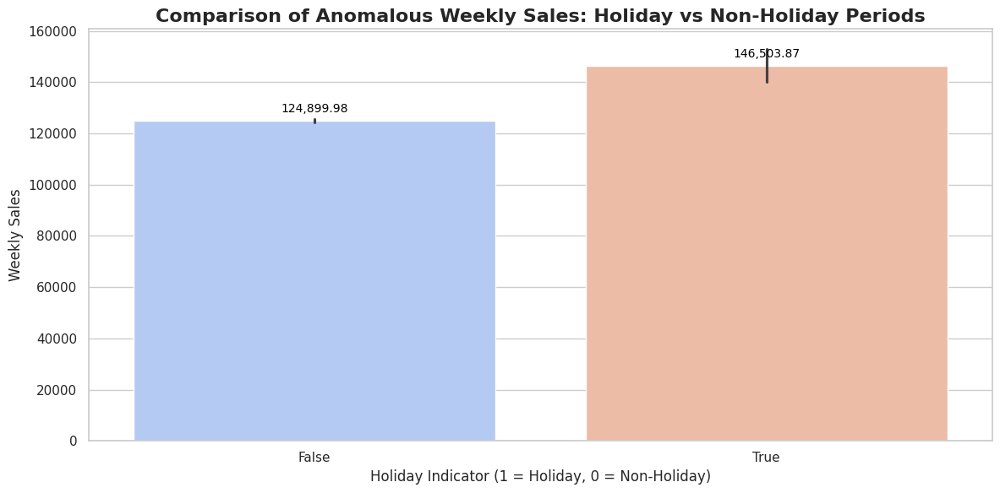

In [87]:
# Set seaborn theme for consistent EDA visuals
sns.set(style="whitegrid")

# Set the figure size for clear comparison
plt.figure(figsize=(12, 6))

# Bar plot comparing anomalous weekly sales on holidays vs non-holidays
ax = sns.barplot(
    x='IsHoliday',
    y='Weekly_Sales',
    data=df_anomalies,
    palette='coolwarm'   # 🔁 color changed
)

# Annotate bars with formatted sales values
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'{height:,.2f}',
        (p.get_x() + p.get_width() / 2., height),
        ha='center',
        va='bottom',
        fontsize=10,
        color='black',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Improved title and axis labels
plt.title(
    "Comparison of Anomalous Weekly Sales: Holiday vs Non-Holiday Periods",
    fontsize=16,
    fontweight='bold'
)
plt.xlabel("Holiday Indicator (1 = Holiday, 0 = Non-Holiday)", fontsize=12)
plt.ylabel("Weekly Sales", fontsize=12)

# Optimize layout spacing
plt.tight_layout()

# Display the plot
plt.show()


#Findings on Potential Causes of Sales Anomalies
##Impact of Holidays on Sales

The analysis indicates that holidays have a significant influence on sales behavior. When IsHoliday = False (regular days), nearly 90% of the observations are concentrated around lower sales values, suggesting relatively stable and lower sales during non-holiday periods. In contrast, when IsHoliday = True, anomalous observations are associated with higher sales values, indicating a clear uplift in sales during holiday weeks.

##Seasonality and Consumer Behavior

The observed increase in sales during holiday periods can be attributed to several seasonal and behavioral factors, including heightened consumer spending, festive shopping trends, promotional offers, and seasonal discounts. During holidays, customers are more inclined to make discretionary purchases, resulting in increased sales volumes.

##Business Strategies

Organizations typically deploy targeted marketing and sales strategies during holiday seasons to capitalize on increased consumer demand. These strategies often include special promotions, intensified advertising campaigns, and the introduction of holiday-specific products, all of which contribute to elevated sales levels during these periods.

##Anomaly Detection Insights

The higher frequency of anomalies during holidays suggests that sales patterns in these periods are more volatile and less predictable compared to regular weeks. Understanding these anomalies is crucial, as it enables businesses to better anticipate demand fluctuations and refine forecasting models.

##Conclusion

Overall, the findings emphasize the importance of incorporating holiday effects and seasonal dynamics into sales forecasting, marketing planning, and operational decision-making. Aligning business strategies with consumer behavior during holiday periods can help organizations better manage demand variability, maximize sales opportunities, and drive sustainable growth.

In [88]:
#Anamoly detection
from sklearn.ensemble import IsolationForest
#checking for normal distribution
print("Skewness - Cost: %f" % final_df['Weekly_Sales'].skew())
print("Kurtosis - Cost: %f" % final_df['Weekly_Sales'].kurt())

Skewness - Cost: 3.262008
Kurtosis - Cost: 21.491290


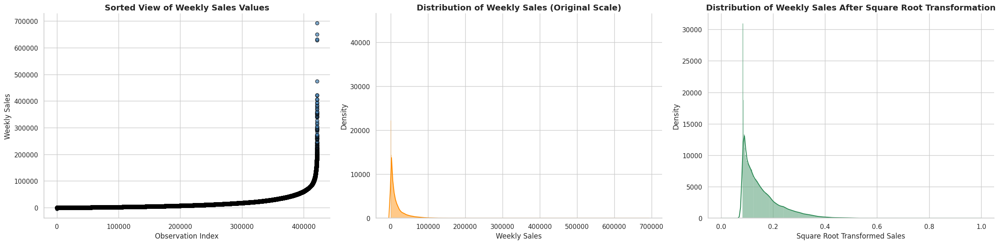

In [89]:
# Set a clean EDA theme
sns.set(style="whitegrid")

# Create a 1x3 subplot layout for distribution comparison
fig, axes = plt.subplots(1, 3, figsize=(24, 6))

# 1️⃣ Sorted Weekly Sales (Scatter View)
axes[0].scatter(
    range(final_df.shape[0]),
    np.sort(final_df['Weekly_Sales'].values),
    color='steelblue',          # 🔁 color changed
    edgecolor='black',
    alpha=0.7
)
axes[0].set_title(
    "Sorted View of Weekly Sales Values",
    fontsize=14,
    fontweight='bold'
)
axes[0].set_xlabel("Observation Index", fontsize=12)
axes[0].set_ylabel("Weekly Sales", fontsize=12)
sns.despine(ax=axes[0])

# 2️⃣ Distribution of Weekly Sales
sns.histplot(
    final_df['Weekly_Sales'],
    kde=True,
    ax=axes[1],
    color='darkorange'          # 🔁 color changed
)
axes[1].set_title(
    "Distribution of Weekly Sales (Original Scale)",
    fontsize=14,
    fontweight='bold'
)
axes[1].set_xlabel("Weekly Sales", fontsize=12)
axes[1].set_ylabel("Density", fontsize=12)
sns.despine(ax=axes[1])

# 3️⃣ Distribution of Square Root Transformed Sales
sns.histplot(
    final_df['Sales_sqrt'],
    kde=True,
    ax=axes[2],
    color='seagreen'            # 🔁 color changed
)
axes[2].set_title(
    "Distribution of Weekly Sales After Square Root Transformation",
    fontsize=14,
    fontweight='bold'
)
axes[2].set_xlabel("Square Root Transformed Sales", fontsize=12)
axes[2].set_ylabel("Density", fontsize=12)
sns.despine(ax=axes[2])

# Adjust layout for clarity
plt.tight_layout()
plt.show()


In [90]:
#isolation forest for anamoly detection on Weekly Sales
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(final_df['Weekly_Sales'].values.reshape(-1, 1))
final_df['anomaly_score_univariate_Weekly_Sales'] = isolation_forest.decision_function(final_df['Weekly_Sales'].values.reshape(-1, 1))
final_df['outlier_univariate_Weekly_Sales'] = isolation_forest.predict(final_df['Weekly_Sales'].values.reshape(-1, 1))

In [91]:
# Handling Outliers & Outlier treatments
# To separate the symmetric distributed features and skew symmetric distributed features
num_columns=['Weekly_Sales', 'Size', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment']
symmetric_feature=[]
non_symmetric_feature=[]
for i in num_columns:
  if abs(final_df[i].mean()-final_df[i].median())< 0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Fuel_Price', 'Unemployment']
Skew Symmetric Distributed Features : - ['Weekly_Sales', 'Size', 'Temperature', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI']


In [92]:
# For Skew Symmetric features defining upper and lower boundry
#Outer Fence
def outlier_treatment_skew(df,feature):
  IQR= df[feature].quantile(0.75)- df[feature].quantile(0.25)
  lower_bridge =df[feature].quantile(0.25)- 1.5*IQR
  upper_bridge =df[feature].quantile(0.75)+ 1.5*IQR
  return upper_bridge,lower_bridge

In [93]:
# Get the upper and lower boundaries for 'Weekly_Sales'
upper_boundary, lower_boundary = outlier_treatment_skew(final_df, 'Weekly_Sales')
upper_boundary, lower_boundary

(np.float64(47395.15625), np.float64(-25109.653749999998))

In [94]:
#Removing Anomalies using IQR
final_new_df=final_df[(final_df['Weekly_Sales'] >= lower_boundary) & (final_df['Weekly_Sales'] <= upper_boundary)]

In [95]:
final_new_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly,anomaly_score_univariate_Weekly_Sales,outlier_univariate_Weekly_Sales
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.0,386049.000000,386049.0
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,2061.817116,3771.376868,171.282755,7.971957,0.022251,0.140642,0.0,0.293337,1.0
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,0.220000,135.160000,126.064000,3.879000,0.000000,0.000000,0.0,0.182383,1.0
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,132.106200,6.885000,0.009662,0.098294,0.0,0.273502,1.0
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,182.431557,7.866000,0.016276,0.127577,0.0,0.304401,1.0
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,1481.310000,3359.450000,212.576205,8.595000,0.029783,0.172577,0.0,0.317785,1.0
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,67474.850000,108519.280000,227.232807,14.313000,0.075037,0.273929,0.0,0.334604,1.0
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,3601.149883,3534.203113,39.170721,1.876819,0.016226,0.049710,0.0,0.033922,0.0


In [96]:
#dropping the columns created while outliers treatment
final_new_df.drop(columns =['anomaly_score_univariate_Weekly_Sales','outlier_univariate_Weekly_Sales'], inplace = True)

In [97]:
# Calculate mean and standard deviation
mean_sales = np.mean(final_new_df['Sales_sqrt'])
std_deviation = np.std(final_new_df['Sales_sqrt'])

# Set a threshold for flagging anomalies (e.g., 3 standard deviations from the mean)
threshold = mean_sales + 3 * std_deviation

# Identify anomalies
anomalies = [data_point for data_point in final_new_df['Sales_sqrt'] if data_point > threshold]

#If the data point exceeds the threshold, it assigns a value of 1 (indicating an anomaly), otherwise it assigns a value of 0.
final_df['Anomaly'] = [1 if data_point > threshold else 0 for data_point in final_df['Sales_sqrt']]

print("Retail Weekly Sales Data:")
print("Mean Sales:", mean_sales)
print("Standard Deviation:", std_deviation)
print("Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales :", len(anomalies))
print("Total number of Anomalies in Weekly Sales (percentage-wise) :", round((len(anomalies)/len(sales_df))*100,2))

Retail Weekly Sales Data:
Mean Sales: 0.14064200086439266
Standard Deviation: 0.04971002037664965
Anomalies (2 standard deviations from the mean)-Total number of Anomalies in Weekly Sales : 0
Total number of Anomalies in Weekly Sales (percentage-wise) : 0.0


ime-Based Anomaly Detection

#Analyze sales trends over time to understand temporal patterns and fluctuations.

Identify seasonal effects and holiday-driven variations that influence sales behavior across different periods.

Leverage time-series analysis techniques to evaluate store- and department-level performance over time.

Apply specialized time-series methods to detect anomalies in sales data, enabling the identification of unusual or unexpected sales patterns.

Approach

##Rolling Statistics:
Compute rolling averages, moving sums, and rolling standard deviations to monitor short-term and long-term variations in sales trends.

##Exponential Smoothing:
Apply exponential moving averages (EMA) to smooth time-series data and enhance the detection of irregular patterns or sudden shifts in sales behavior.

##Anomaly Identification:
Define thresholds and visual indicators to flag significant deviations from smoothed trends, supporting effective anomaly detection and clearer trend interpretation.

###**Rolling Statistics**

In [98]:
# Sort the DataFrame by date
final_df.sort_values(by='Date', inplace=True)

In [99]:
# Calculate rolling statistics
rolling_window = 30

In [100]:
# Rolling average of TotalSales
final_df['RollingAvgTotalSales'] = final_df['Weekly_Sales'].rolling(window=rolling_window).mean()

In [101]:
# Set anomaly threshold (customize this threshold as needed)
sales_threshold = 1  # Adjust the threshold as needed

In [102]:
# Detect anomalies in WeeklySales
final_df['SalesAnomaly'] = final_df['Weekly_Sales'] < sales_threshold * final_df['RollingAvgTotalSales']


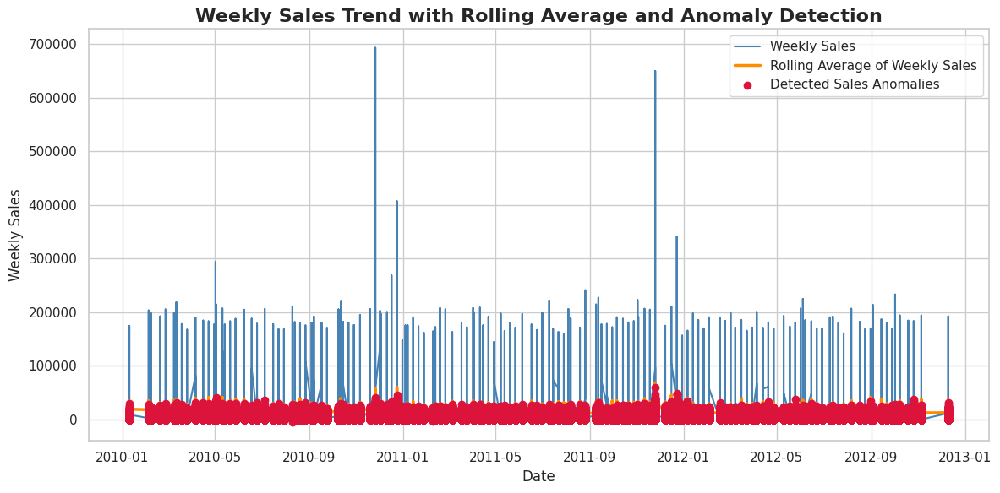

In [104]:
plt.figure(figsize=(12, 6))

# Plot original weekly sales trend
plt.plot(
    final_df['Date'],
    final_df['Weekly_Sales'],
    label='Weekly Sales',
    color='steelblue'
)

# Plot rolling average of weekly sales
plt.plot(
    final_df['Date'],
    final_df['RollingAvgTotalSales'],
    label='Rolling Average of Weekly Sales',
    color='darkorange',
    linewidth=2.5
)

# Highlight detected sales anomalies
anomaly_dates = final_df.loc[final_df['SalesAnomaly'], 'Date']
anomaly_sales = final_df.loc[final_df['SalesAnomaly'], 'Weekly_Sales']
plt.scatter(
    anomaly_dates,
    anomaly_sales,
    color='crimson',
    label='Detected Sales Anomalies',
    zorder=5
)

# Axis labels and title
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.title(
    'Weekly Sales Trend with Rolling Average and Anomaly Detection',
    fontsize=16,
    fontweight='bold'
)

# Legend and layout
plt.legend()
plt.tight_layout()
plt.show()


#Observations

The visualization presents rolling statistics along with identified anomalies in the sales data.

The rolling average of weekly sales does not exhibit a consistent upward or downward trend over time, indicating that overall sales remain relatively stable across the observed period.

Several anomalies are visible in the time series, highlighted by distinct markers on the graph. These anomalies may be attributed to factors such as markdown events, seasonal effects, or holiday-driven demand, which cause temporary deviations from typical sales behavior.

In [105]:
# Apply exponential smoothing (EMA)
alpha = 0.2  # Adjust the smoothing factor as needed

In [106]:
# Exponential smoothing of TotalSales
final_df['EMAWeeklySales'] = final_df['Weekly_Sales'].ewm(alpha=alpha).mean()

In [107]:
# Set anomaly threshold (customize this threshold as needed)
sales_threshold = 1  # Adjust the threshold as needed

In [108]:
# Detect anomalies in TotalSales and Discount
final_df['SalesAnomaly_EMA'] = final_df['Weekly_Sales'] < sales_threshold * final_df['EMAWeeklySales']

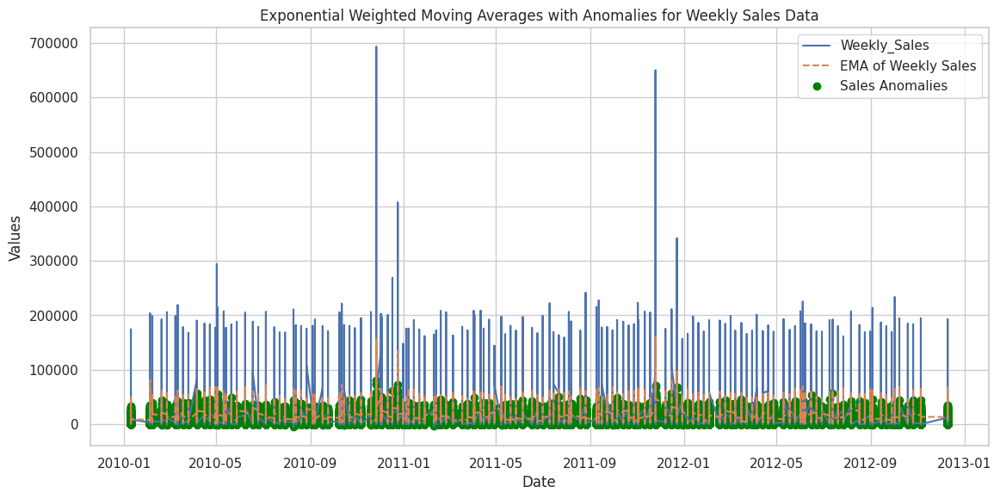

In [109]:
# Visualize EMA with original values and anomalies
plt.figure(figsize=(12, 6))
plt.plot(final_df['Date'], final_df['Weekly_Sales'], label='Weekly_Sales')
plt.plot(final_df['Date'], final_df['EMAWeeklySales'], label='EMA of Weekly Sales', linestyle='--')
plt.scatter(final_df['Date'][final_df['SalesAnomaly_EMA']], final_df['Weekly_Sales'][final_df['SalesAnomaly_EMA']], c='green', label='Sales Anomalies')

plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.title('Exponential Weighted Moving Averages with Anomalies for Weekly Sales Data')
plt.show()

#Observations

The Exponentially Weighted Moving Average (EWMA) of the sales data remains largely stable over time, with a few unexpected spikes, indicating that overall sales are generally constant with occasional seasonal fluctuations.

Several anomalies are visible in the time series, highlighted by distinct markers on the graph. These anomalies may be driven by factors such as special holidays, seasonal demand variations, or other unexpected events that temporarily disrupt typical sales patterns.

# **Customer Segmentation Analysis:**

Segment stores or departments based on sales patterns, markdowns, and regional features.

Analyze segment-specific trends and characteristics.

In [110]:
cluster_df=final_new_df.copy()

In [111]:
cluster_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Weekly_Sales_normalized,Sales_sqrt,Anomaly
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,192.0,24.6,1481.31,3359.45,211.096358,8.106,0.042851,0.207004,0
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,192.0,24.6,1481.31,3359.45,211.242170,8.106,0.073097,0.270365,0
2,1,1,2010-02-19,41595.55,False,A,151315,39.93,2.514,5347.45,192.0,24.6,1481.31,3359.45,211.289143,8.106,0.066732,0.258324,0
3,1,1,2010-02-26,19403.54,False,A,151315,46.63,2.561,5347.45,192.0,24.6,1481.31,3359.45,211.319643,8.106,0.034942,0.186927,0
4,1,1,2010-05-03,21827.90,False,A,151315,46.50,2.625,5347.45,192.0,24.6,1481.31,3359.45,211.350143,8.106,0.038415,0.195997,0


In [112]:
# Getting symmetric and skew symmetric features from the cplumns
features = ['Weekly_Sales', 'MarkDown1', 'MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Unemployment','Size','Fuel_Price','Temperature']
symmetric_feature=[]
non_symmetric_feature=[]
for i in features:
  if abs(cluster_df[i].mean()-cluster_df[i].median())<0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Unemployment', 'Fuel_Price']
Skew Symmetric Distributed Features : - ['Weekly_Sales', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Size', 'Temperature']


In [113]:
# Step 2: Normalize Sales Data (Standardization)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
cols=['Weekly_Sales', 'MarkDown1', 'MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Size','Temperature','Unemployment', 'Fuel_Price']
# Reshape the column to a 2D array and apply min-max scaling
for i in cols:
  cluster_df[i +'_normalized'] = scaler.fit_transform(cluster_df[i].values.reshape(-1, 1))

In [114]:
cluster_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,MarkDown1_normalized,MarkDown2_normalized,MarkDown3_normalized,MarkDown4_normalized,MarkDown5_normalized,CPI_normalized,Size_normalized,Temperature_normalized,Unemployment_normalized,Fuel_Price_normalized
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,...,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,...,0.067360,0.012063,0.003390,0.030554,0.033549,0.446963,0.535183,0.607849,0.392271,0.445498
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.059724,0.315637,0.476712,0.288097,0.230461
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.557163,0.504647,0.627495,0.382116,0.490982
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,...,0.060320,0.004369,0.000379,0.021950,0.029749,0.855127,0.906277,0.746673,0.451984,0.634269
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,...,0.056055,0.047030,0.037114,0.053370,0.032608,0.387182,0.330057,0.180953,0.179875,0.229974


In [115]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized'],
      dtype='object')

In [116]:
#using log transformation to transform Weekly_Sales as using capping tends to change median and mean
cols=['Weekly_Sales_normalized','MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized']
for i in cols:
  cluster_df[i+' sqrt'] = cluster_df[i].apply(lambda x: x ** 0.5)

In [117]:
cluster_df.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,...,Fuel_Price_normalized,Weekly_Sales_normalized sqrt,MarkDown1_normalized sqrt,MarkDown2_normalized sqrt,MarkDown3_normalized sqrt,MarkDown4_normalized sqrt,MarkDown5_normalized sqrt,CPI_normalized sqrt,Size_normalized sqrt,Temperature_normalized sqrt
0,1,1,2010-05-02,24924.50,False,A,151315,42.31,2.572,5347.45,...,0.050100,0.755685,0.245602,0.066095,0.01947,0.148156,0.172478,0.916788,0.793894,0.658900
1,1,1,2010-12-02,46039.49,True,A,151315,38.51,2.548,5347.45,...,0.038076,0.986992,0.245602,0.066095,0.01947,0.148156,0.172478,0.917573,0.793894,0.630053
2,1,1,2010-02-19,41595.55,False,A,151315,39.93,2.514,5347.45,...,0.021042,0.943036,0.245602,0.066095,0.01947,0.148156,0.172478,0.917826,0.793894,0.640984
3,1,1,2010-02-26,19403.54,False,A,151315,46.63,2.561,5347.45,...,0.044589,0.682394,0.245602,0.066095,0.01947,0.148156,0.172478,0.917991,0.793894,0.690231
4,1,1,2010-05-03,21827.90,False,A,151315,46.50,2.625,5347.45,...,0.076653,0.715503,0.245602,0.066095,0.01947,0.148156,0.172478,0.918155,0.793894,0.689309


In [118]:
cluster_df.describe()

,Store,Dept,Date,Weekly_Sales,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Fuel_Price_normalized,Weekly_Sales_normalized sqrt,MarkDown1_normalized sqrt,MarkDown2_normalized sqrt,MarkDown3_normalized sqrt,MarkDown4_normalized sqrt,MarkDown5_normalized sqrt,CPI_normalized sqrt,Size_normalized sqrt,Temperature_normalized sqrt
count,386049.000000,386049.000000,386049,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,...,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000,386049.000000
mean,22.418351,42.902909,2011-06-19 03:45:02.426893824,10544.403242,133748.441149,60.062128,3.361214,5971.519327,998.248268,451.179090,...,0.445498,0.513426,0.245743,0.082088,0.025851,0.156596,0.175495,0.572350,0.670226,0.769731
min,1.000000,1.000000,2010-01-10 00:00:00,-4988.940000,34875.000000,-2.060000,2.472000,0.270000,-265.760000,-29.100000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.000000,18.000000,2010-10-12 00:00:00,1755.830000,93188.000000,46.660000,2.932000,5347.450000,192.000000,24.600000,...,0.230461,0.358832,0.245602,0.066095,0.019470,0.148156,0.172478,0.244385,0.561816,0.690444
50%,22.000000,35.000000,2011-06-17 00:00:00,6373.100000,128107.000000,62.070000,3.452000,5347.450000,192.000000,24.600000,...,0.490982,0.465731,0.245602,0.066095,0.019470,0.148156,0.172478,0.746434,0.710385,0.792146
75%,33.000000,71.000000,2012-03-02 00:00:00,15802.090000,202307.000000,74.250000,3.738000,5347.450000,192.000000,24.600000,...,0.634269,0.630007,0.245602,0.066095,0.019470,0.148156,0.172478,0.924731,0.951986,0.864103
max,45.000000,99.000000,2012-12-10 00:00:00,47393.430000,219622.000000,100.140000,4.468000,88646.760000,104519.540000,141630.610000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
std,12.791236,29.604673,NaN,11327.026575,60976.982207,18.493405,0.459029,4969.092478,4928.090531,5257.526308,...,0.229974,0.181471,0.083489,0.072969,0.052174,0.077662,0.052450,0.345513,0.293223,0.123949


In [119]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized', 'Weekly_Sales_normalized sqrt',
       'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt',
       'MarkDown3_normalized sqrt', 'MarkDown4_normalized sqrt',
       'MarkDown5_normalized sqrt', 'CPI_normalized sqrt',
       'Size_normalized sqrt', 'Temperature_normalized sqrt'],
      dtype='object')

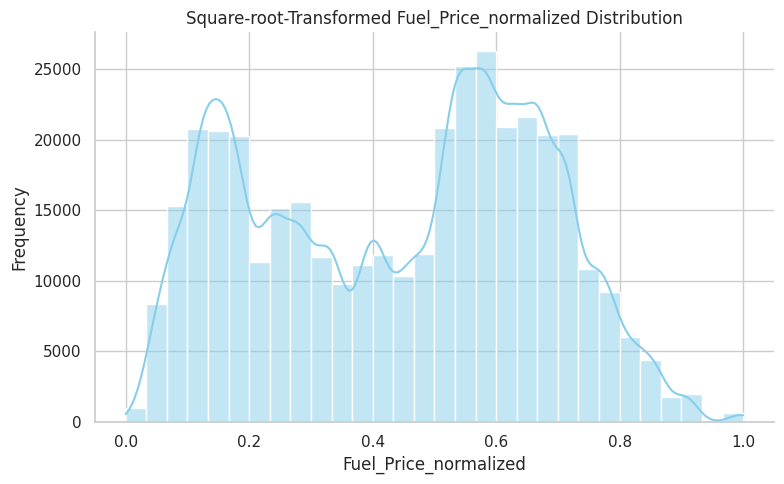

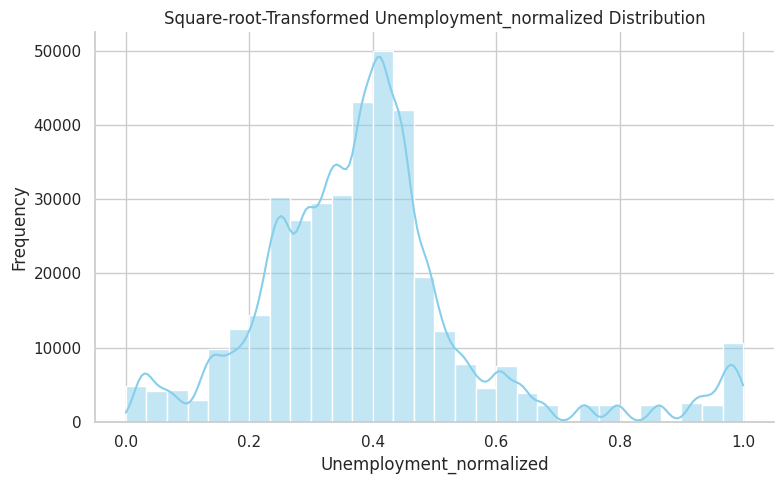

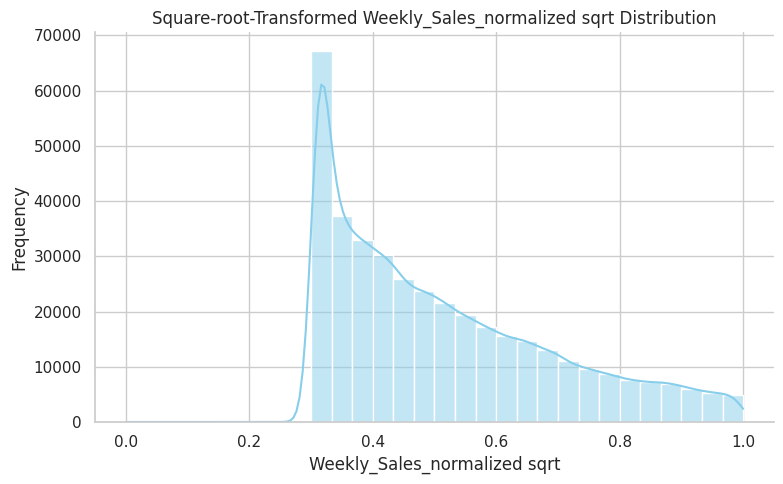

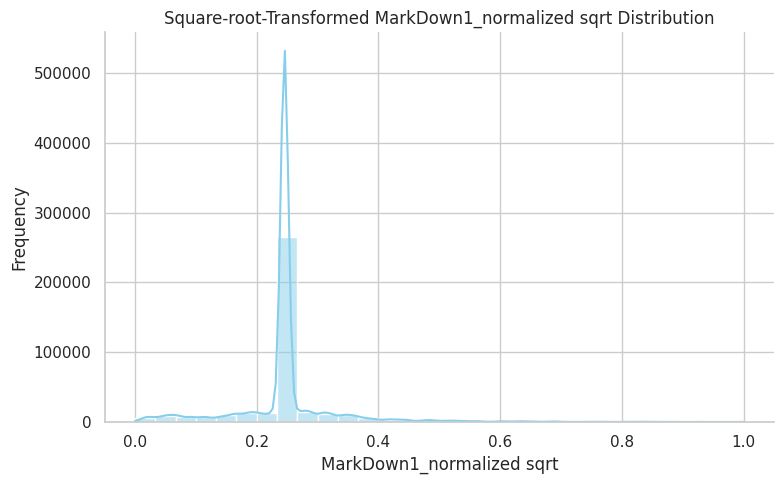

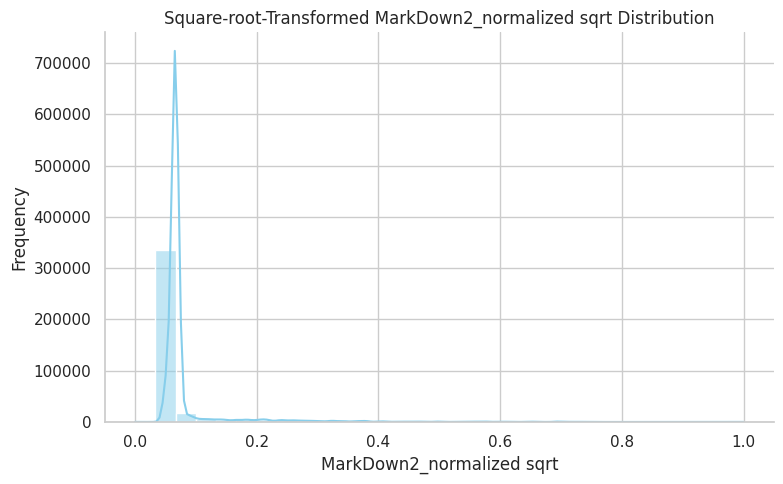

...

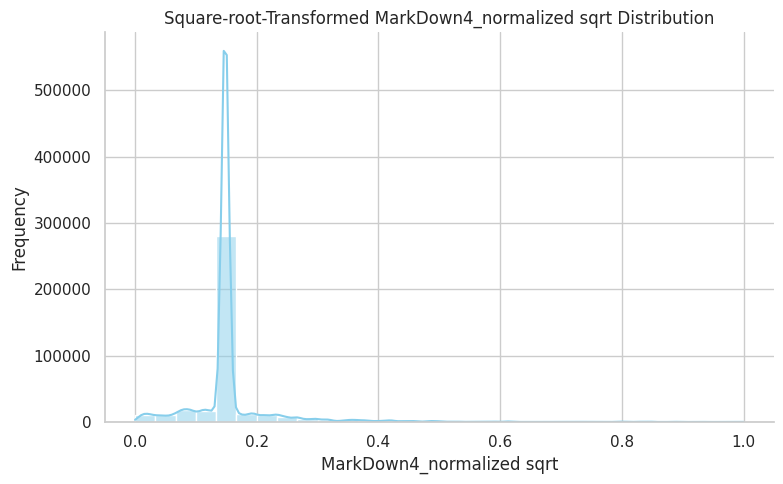

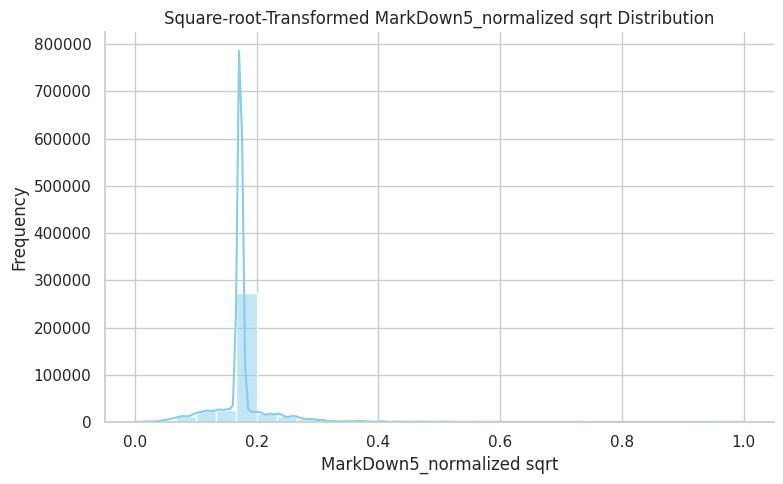

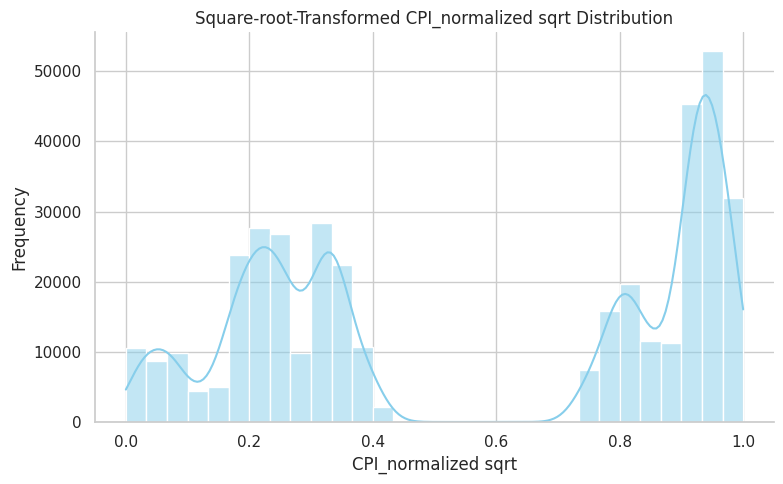

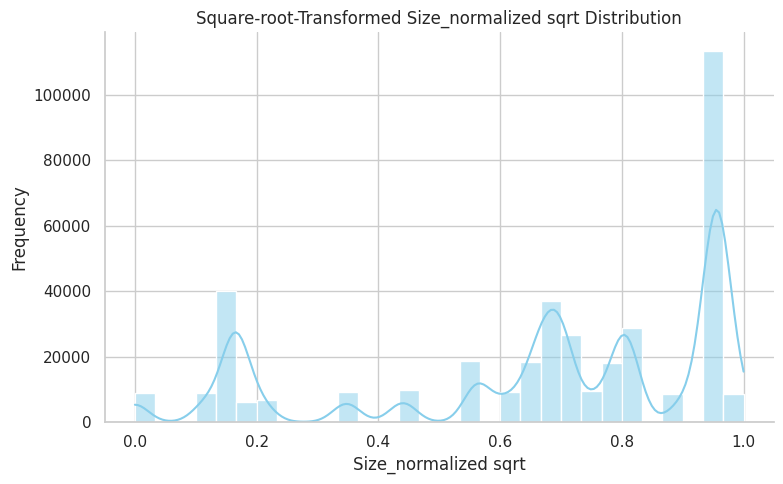

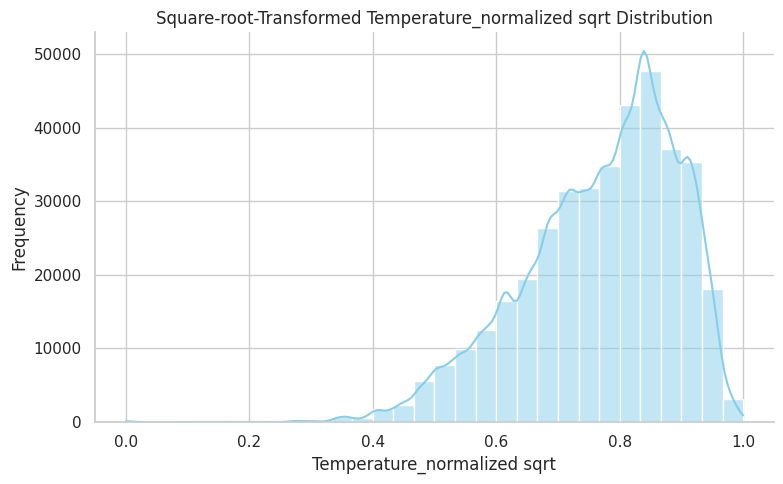

In [120]:
cols = ['Fuel_Price_normalized','Unemployment_normalized','Weekly_Sales_normalized sqrt',
        'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt', 'MarkDown3_normalized sqrt',
        'MarkDown4_normalized sqrt', 'MarkDown5_normalized sqrt',
        'CPI_normalized sqrt', 'Size_normalized sqrt', 'Temperature_normalized sqrt']

for col in cols:
    plt.figure(figsize=(8, 5))
    sns.histplot(cluster_df[col], kde=True, color='skyblue', bins=30)
    plt.title(f"Square-root-Transformed {col} Distribution")
    sns.despine()
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

In [121]:
cluster_df.columns

Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Type', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment',
       'Weekly_Sales_normalized', 'Sales_sqrt', 'Anomaly',
       'MarkDown1_normalized', 'MarkDown2_normalized', 'MarkDown3_normalized',
       'MarkDown4_normalized', 'MarkDown5_normalized', 'CPI_normalized',
       'Size_normalized', 'Temperature_normalized', 'Unemployment_normalized',
       'Fuel_Price_normalized', 'Weekly_Sales_normalized sqrt',
       'MarkDown1_normalized sqrt', 'MarkDown2_normalized sqrt',
       'MarkDown3_normalized sqrt', 'MarkDown4_normalized sqrt',
       'MarkDown5_normalized sqrt', 'CPI_normalized sqrt',
       'Size_normalized sqrt', 'Temperature_normalized sqrt'],
      dtype='object')

In [122]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales_normalized sqrt': 'mean',
    'MarkDown1_normalized sqrt': 'mean',
    'MarkDown2_normalized sqrt': 'mean',
    'MarkDown3_normalized sqrt': 'mean',
    'MarkDown4_normalized sqrt': 'mean',
    'MarkDown5_normalized sqrt': 'mean',
    'CPI_normalized sqrt': 'mean',
    'Size_normalized sqrt': 'mean',
    'Temperature_normalized sqrt': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_store = cluster_df.groupby('Store').agg(agg_functions).reset_index()

# Rename columns
mean_by_store.columns = ['Store', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
store_df = pd.DataFrame(mean_by_store.set_index('Store'))
store_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,
1,0.550465,0.258323,0.082537,0.025947,0.163175,0.183244,0.942463,0.793894,0.825339
2,0.577355,0.273740,0.091269,0.027692,0.176166,0.192711,0.940878,0.951986,0.823762
3,0.417468,0.219367,0.072215,0.023549,0.131408,0.143858,0.960257,0.116722,0.843924
4,0.574286,0.266005,0.089234,0.028936,0.179070,0.195721,0.143124,0.962042,0.786823
5,0.409784,0.217942,0.072402,0.023227,0.133170,0.159851,0.945560,0.000000,0.830593


In [123]:
store_df.columns

Index(['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature'],
      dtype='object')

###**Dimensionality Reduction using PCA**

In [124]:
# Dimensionality Reduction (If needed)
#applying pca
#setting restaurant feature as index as it still had categorial value
from sklearn.decomposition import PCA
#scaled_df.set_index(['Store'],inplace=True)
features = store_df.columns
# features = features.drop('Restaurant')
# create an instance of PCA
pca = PCA()

# fit PCA on features
pca.fit(store_df[features])

PCA()

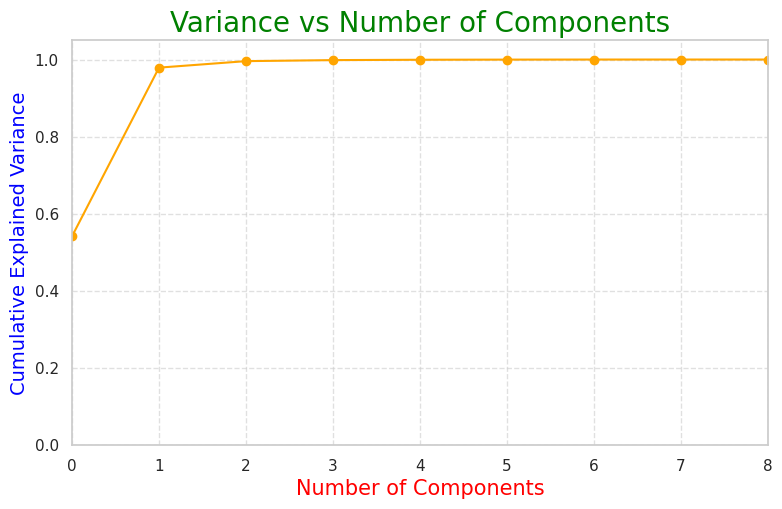

In [125]:
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='orange', linestyle='-')
plt.xlabel('Number of Components', fontsize=15, color='red')
plt.ylabel('Cumulative Explained Variance', fontsize=14, color='blue')
plt.title('Variance vs Number of Components', fontsize=20, color='green')
plt.xlim([0, 8])
plt.ylim([0, 1.05])
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [126]:
#using n_component as 3
pca = PCA(n_components=3)

# fit PCA on features
pca.fit(store_df[features])

# explained variance ratio of each principal component
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# variance explained by three components
print('Cumulative variance explained by 3 principal components: {:.2%}'.format(
                                        np.sum(pca.explained_variance_ratio_)))

# transform data to principal component space
df_pca = pca.transform(store_df[features])

Explained variation per principal component: [0.54162243 0.43736933 0.01686211]
Cumulative variance explained by 3 principal components: 99.59%


In [127]:
#shape
print("original shape: ", store_df.shape)
print("transformed shape:", df_pca.shape)

original shape:  (45, 9)
transformed shape: (45, 3)


###**Kmeans Clustering**

In [128]:
# ML Model - 1 Implementation
#importing kmeans
from sklearn.cluster import KMeans


In [129]:
#Within Cluster Sum of Squared Errors(WCSS) for different values of k
wcss=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state = 20)
    km.fit(df_pca)
    wcss.append(km.inertia_)

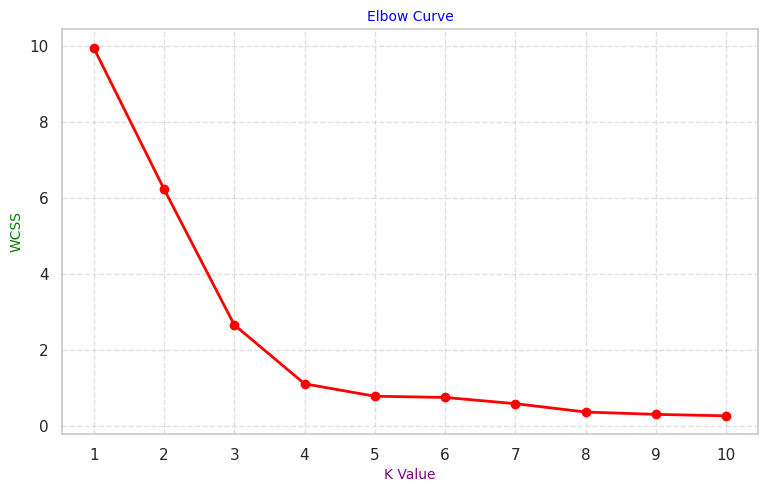

In [131]:
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o', color='red', linewidth=2)
plt.xlabel('K Value', fontsize=10, color='purple')
plt.xticks(np.arange(1, 11, 1))
plt.ylabel('WCSS', fontsize=10, color='green')
plt.title('Elbow Curve', fontsize=10, color='blue')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

##Segmentation Quality Evaluation

Assess the effectiveness of the customer segmentation by evaluating how well the identified segments represent distinct customer groups.

Apply appropriate evaluation metrics to measure within-segment homogeneity and between-segment separation, ensuring that the segments are both internally consistent and clearly distinguishable from one another.

## **Silhouette score**

For n_clusters = 2, average silhouette score = 0.5082


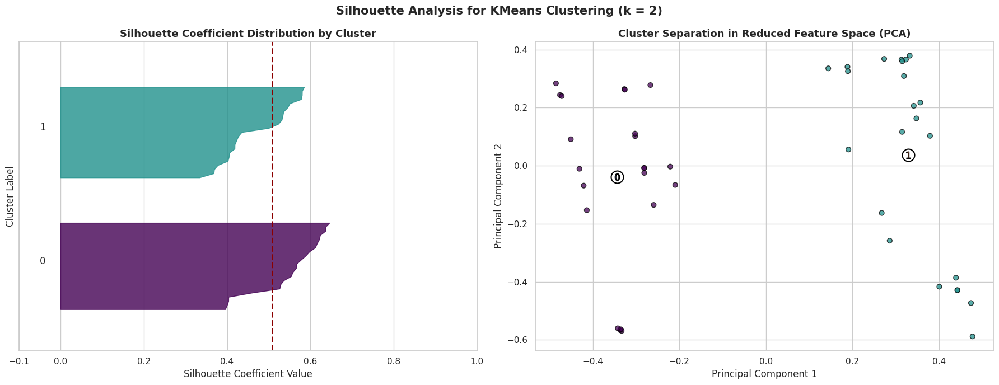

For n_clusters = 3, average silhouette score = 0.5956


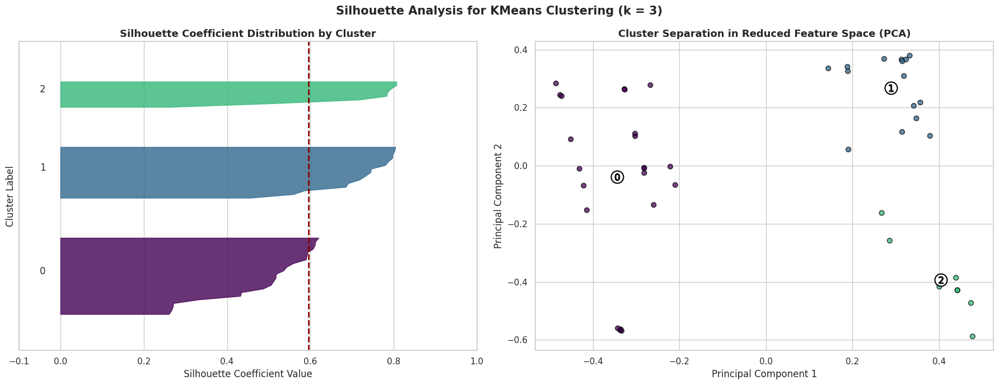

For n_clusters = 4, average silhouette score = 0.6689


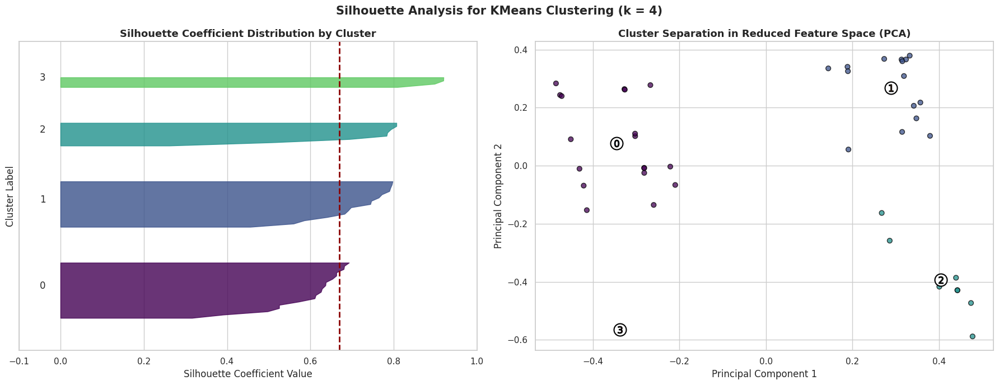

For n_clusters = 5, average silhouette score = 0.6014


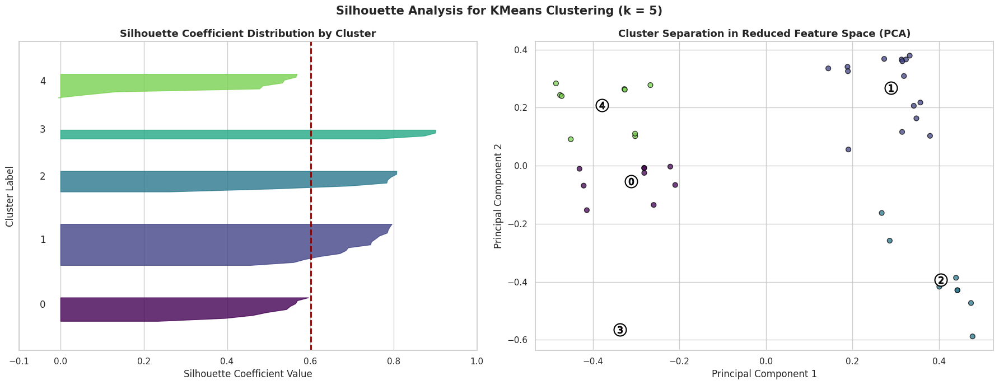

For n_clusters = 6, average silhouette score = 0.5563


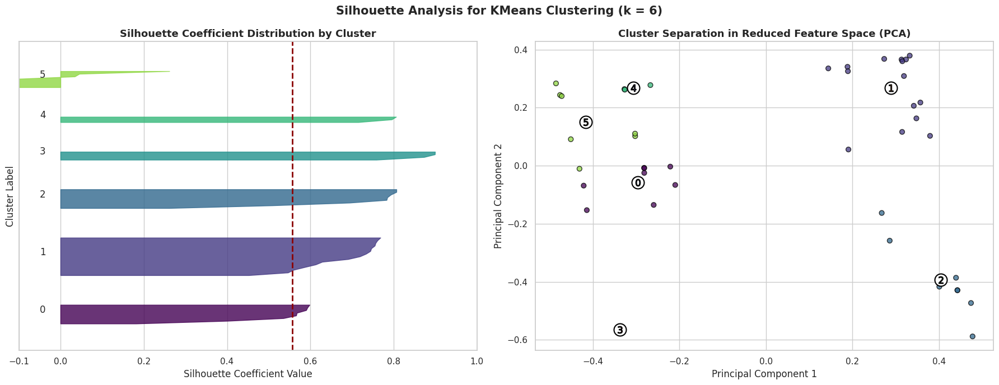

In [133]:
# Silhouette analysis for optimal KMeans clustering
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.model_selection import ParameterGrid
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

# Candidate values for number of clusters
parameters = list(range(2, 7))
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1

# Perform silhouette analysis for each cluster count
for n_clusters in parameters:

    # Create figure with two subplots:
    # 1️⃣ Silhouette plot
    # 2️⃣ PCA-based cluster visualization
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # -------------------------------
    # Silhouette Plot Configuration
    # -------------------------------
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_pca) + (n_clusters + 1) * 10])

    # Fit KMeans model
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(df_pca, cluster_labels)
    print(
        f"For n_clusters = {n_clusters}, "
        f"average silhouette score = {silhouette_avg:.4f}"
    )

    # Compute silhouette scores for individual samples
    sample_silhouette_values = silhouette_samples(df_pca, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Extract and sort silhouette scores for cluster i
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Color selection per cluster
        color = cm.viridis(float(i) / n_clusters)   # 🔁 color refined

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.8
        )

        # Label cluster number
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # Space between clusters

    # Average silhouette score reference line
    ax1.axvline(
        x=silhouette_avg,
        color="darkred",        # 🔁 color refined
        linestyle="--",
        linewidth=2
    )

    ax1.set_title(
        "Silhouette Coefficient Distribution by Cluster",
        fontsize=13,
        fontweight='bold'
    )
    ax1.set_xlabel("Silhouette Coefficient Value")
    ax1.set_ylabel("Cluster Label")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # --------------------------------
    # Cluster Visualization (PCA Space)
    # --------------------------------
    colors = cm.viridis(cluster_labels.astype(float) / n_clusters)  # 🔁 color refined

    ax2.scatter(
        df_pca[:, 0],
        df_pca[:, 1],
        marker='o',
        s=40,
        alpha=0.75,
        c=colors,
        edgecolor='black'
    )

    # Plot cluster centers
    centers = clusterer.cluster_centers_
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker='o',
        c='white',
        s=250,
        edgecolor='black',
        linewidth=1.5
    )

    # Label cluster centers
    for i, c in enumerate(centers):
        ax2.scatter(
            c[0],
            c[1],
            marker=f'${i}$',
            s=80,
            edgecolor='black'
        )

    ax2.set_title(
        "Cluster Separation in Reduced Feature Space (PCA)",
        fontsize=13,
        fontweight='bold'
    )
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    # Overall figure title
    plt.suptitle(
        f"Silhouette Analysis for KMeans Clustering (k = {n_clusters})",
        fontsize=15,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()


## **Department Wise Clustering**

In [134]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales_normalized sqrt': 'mean',
    'MarkDown1_normalized sqrt': 'mean',
    'MarkDown2_normalized sqrt': 'mean',
    'MarkDown3_normalized sqrt': 'mean',
    'MarkDown4_normalized sqrt': 'mean',
    'MarkDown5_normalized sqrt': 'mean',
    'CPI_normalized sqrt': 'mean',
    'Size_normalized sqrt': 'mean',
    'Temperature_normalized sqrt': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_dept = cluster_df.groupby('Dept').agg(agg_functions).reset_index()

# Rename columns
mean_by_dept.columns = ['Dept', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
dept_df = pd.DataFrame(mean_by_dept.set_index('Dept'))
dept_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,
1,0.630616,0.242399,0.080718,0.025440,0.155791,0.173796,0.577346,0.639098,0.777848
2,0.750047,0.223928,0.077248,0.023271,0.144609,0.163205,0.594462,0.490224,0.765232
3,0.520003,0.241951,0.081847,0.025867,0.154679,0.174294,0.575192,0.644143,0.770333
4,0.721116,0.240266,0.080375,0.024728,0.154247,0.171944,0.576441,0.623601,0.772372
5,0.627113,0.243403,0.081010,0.021535,0.156722,0.173727,0.581199,0.641397,0.779964


In [135]:
# Dimensionality Reduction (If needed)
#applying pca
#setting restaurant feature as index as it still had categorial value
from sklearn.decomposition import PCA
#scaled_df.set_index(['Store'],inplace=True)
features = dept_df.columns
# features = features.drop('Restaurant')
# create an instance of PCA
pca = PCA()

# fit PCA on features
pca.fit(dept_df[features])

PCA()

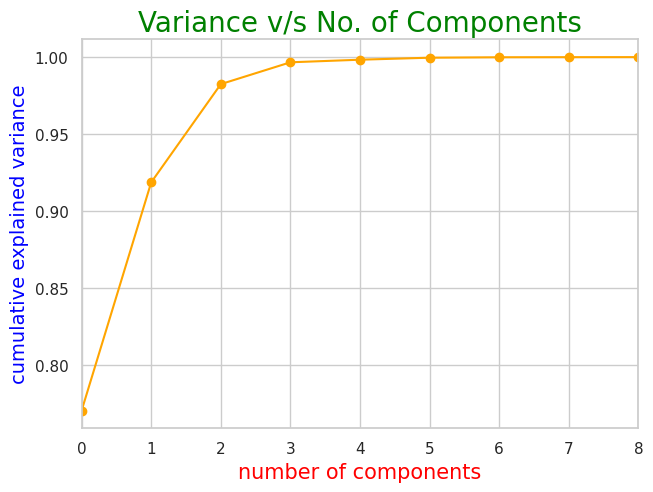

In [136]:
#explained variance v/s no. of components
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker ='o', color = 'orange')
plt.xlabel('number of components',size = 15, color = 'red')
plt.ylabel('cumulative explained variance',size = 14, color = 'blue')
plt.title('Variance v/s No. of Components',size = 20, color = 'green')
plt.xlim([0, 8])
plt.show()

In [137]:
#using n_component as 3
pca = PCA(n_components=3)

# fit PCA on features
pca.fit(dept_df[features])

# explained variance ratio of each principal component
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# variance explained by three components
print('Cumulative variance explained by 3 principal components: {:.2%}'.format(
                                        np.sum(pca.explained_variance_ratio_)))

# transform data to principal component space
df_pca1 = pca.transform(dept_df[features])

Explained variation per principal component: [0.77068668 0.14809816 0.06369846]
Cumulative variance explained by 3 principal components: 98.25%


In [138]:
#shape
print("original shape: ", dept_df.shape)
print("transformed shape:", df_pca1.shape)

original shape:  (81, 9)
transformed shape: (81, 3)


In [139]:
#Within Cluster Sum of Squared Errors(WCSS) for different values of k
wcss=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state = 20)
    km.fit(df_pca1)
    wcss.append(km.inertia_)

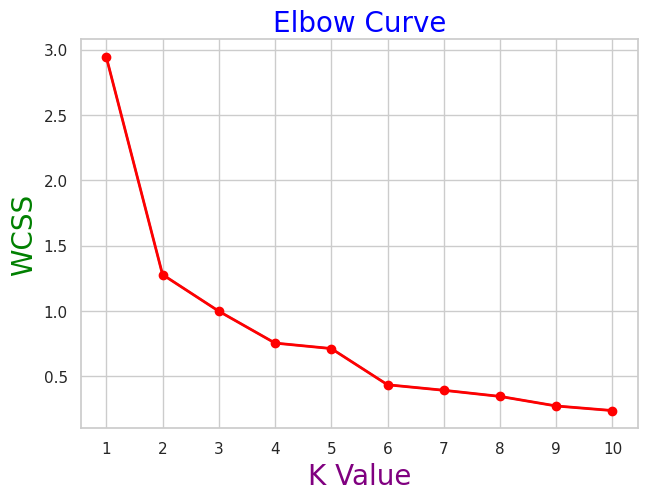

In [140]:
#elbow curve
plt.plot(range(1,11),wcss)
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="o")
plt.xlabel("K Value", size = 20, color = 'purple')
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS", size = 20, color = 'green')
plt.title('Elbow Curve', size = 20, color = 'blue')
plt.show()

For n_clusters = 2, average silhouette score = 0.5093


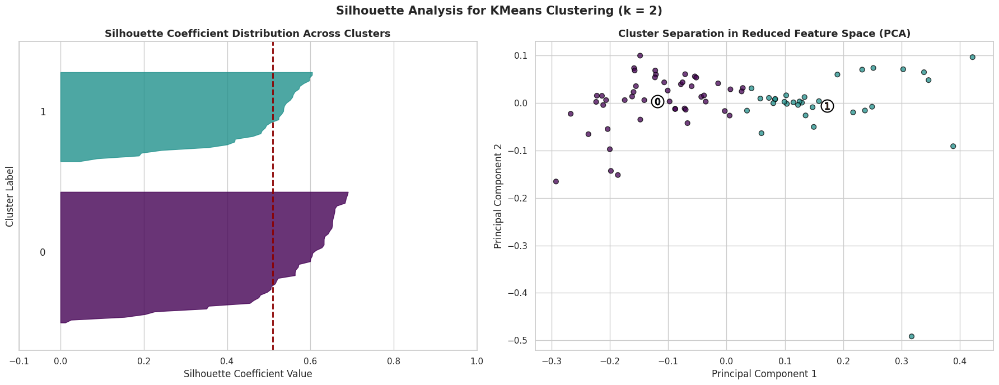

For n_clusters = 3, average silhouette score = 0.3726


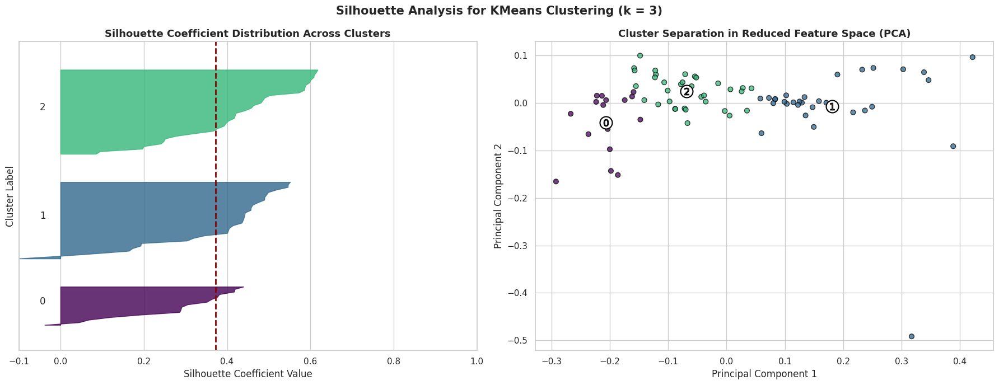

For n_clusters = 4, average silhouette score = 0.3913


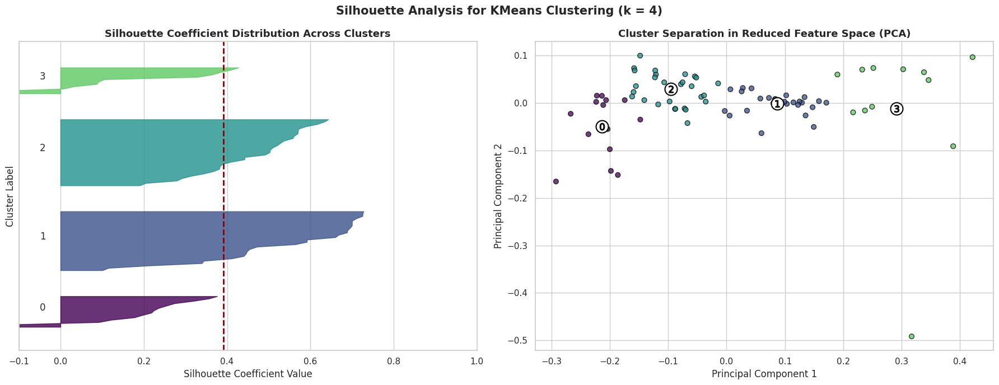

For n_clusters = 5, average silhouette score = 0.4059


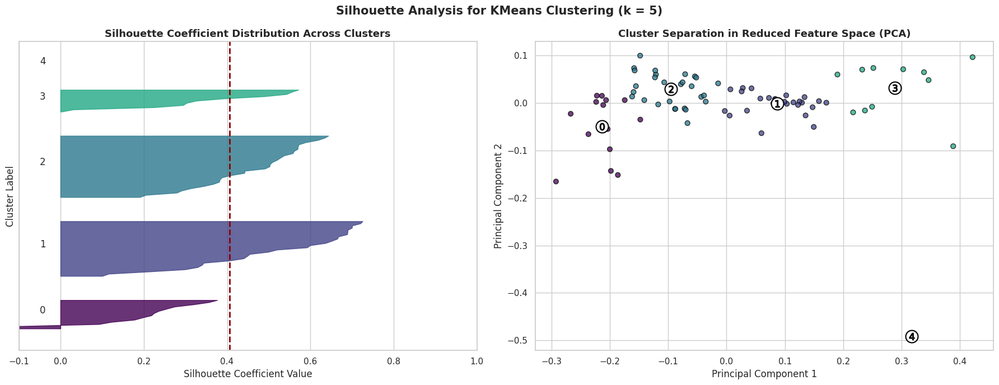

For n_clusters = 6, average silhouette score = 0.3531


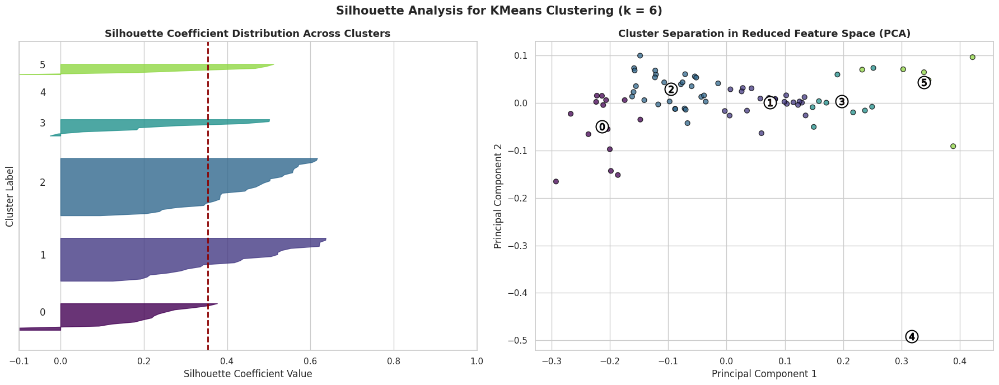

For n_clusters = 7, average silhouette score = 0.3421


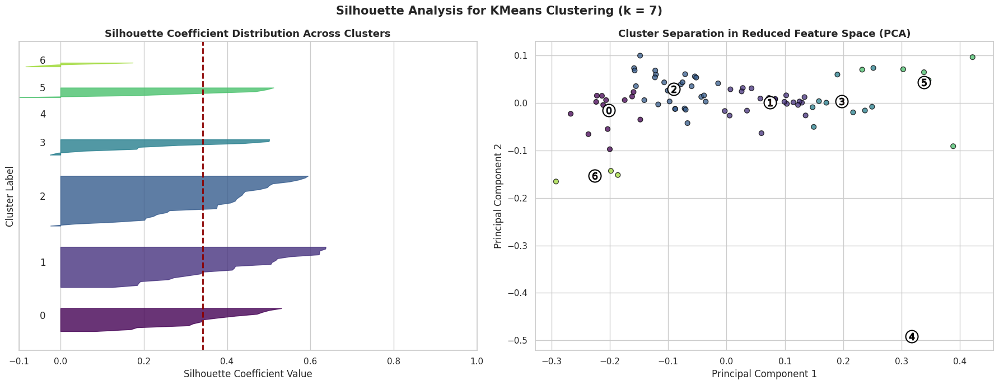

For n_clusters = 8, average silhouette score = 0.3443


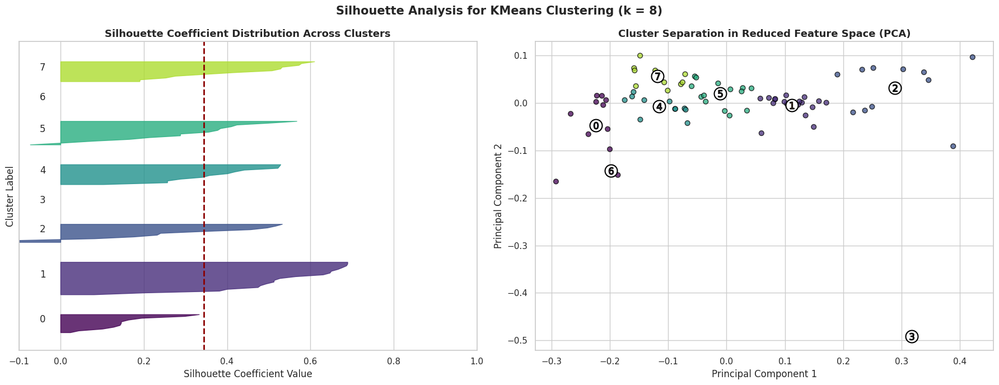

For n_clusters = 9, average silhouette score = 0.3273


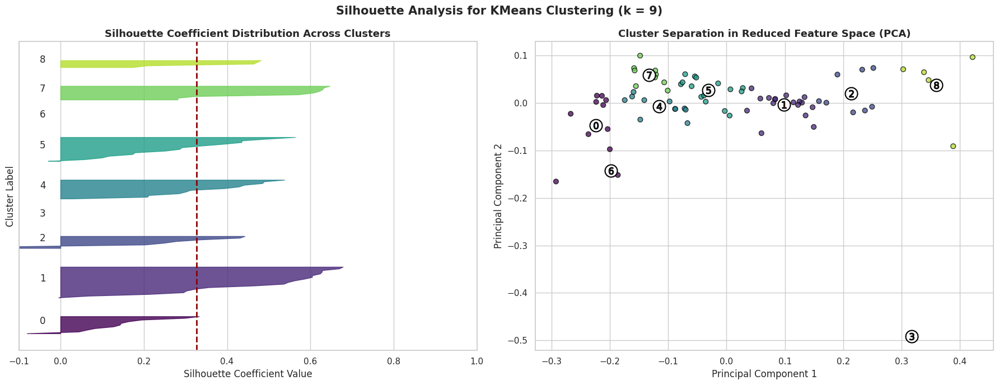

In [141]:
# Silhouette Analysis for Selecting Optimal KMeans Clusters

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.model_selection import ParameterGrid
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

# Candidate values for number of clusters
parameters = list(range(2, 10))
parameter_grid = ParameterGrid({'n_clusters': parameters})

best_score = -1

# Perform silhouette analysis for each cluster count
for n_clusters in parameters:

    # Create a figure with two subplots:
    # 1️⃣ Silhouette coefficient distribution
    # 2️⃣ Cluster visualization in PCA space
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # -------------------------------
    # Silhouette Plot Configuration
    # -------------------------------
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_pca1) + (n_clusters + 1) * 10])

    # Initialize KMeans with fixed random state for reproducibility
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca1)

    # Compute average silhouette score
    silhouette_avg = silhouette_score(df_pca1, cluster_labels)
    print(
        f"For n_clusters = {n_clusters}, "
        f"average silhouette score = {silhouette_avg:.4f}"
    )

    # Compute silhouette scores for individual samples
    sample_silhouette_values = silhouette_samples(df_pca1, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        # Extract and sort silhouette values for cluster i
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        # Color assignment for each cluster
        color = cm.viridis(float(i) / n_clusters)   # 🔁 color refined

        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.8
        )

        # Label cluster number
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Update y-axis position for next cluster
        y_lower = y_upper + 10

    # Average silhouette score reference line
    ax1.axvline(
        x=silhouette_avg,
        color='darkred',        # 🔁 color refined
        linestyle='--',
        linewidth=2
    )

    ax1.set_title(
        "Silhouette Coefficient Distribution Across Clusters",
        fontsize=13,
        fontweight='bold'
    )
    ax1.set_xlabel("Silhouette Coefficient Value")
    ax1.set_ylabel("Cluster Label")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # --------------------------------
    # Cluster Visualization (PCA Space)
    # --------------------------------
    colors = cm.viridis(cluster_labels.astype(float) / n_clusters)  # 🔁 color refined

    ax2.scatter(
        df_pca1[:, 0],
        df_pca1[:, 1],
        marker='o',
        s=40,
        alpha=0.75,
        c=colors,
        edgecolor='black'
    )

    # Plot cluster centers
    centers = clusterer.cluster_centers_
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker='o',
        c='white',
        s=250,
        edgecolor='black',
        linewidth=1.5
    )

    # Label cluster centers
    for i, c in enumerate(centers):
        ax2.scatter(
            c[0],
            c[1],
            marker=f'${i}$',
            s=80,
            edgecolor='black'
        )

    ax2.set_title(
        "Cluster Separation in Reduced Feature Space (PCA)",
        fontsize=13,
        fontweight='bold'
    )
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    # Overall figure title
    plt.suptitle(
        f"Silhouette Analysis for KMeans Clustering (k = {n_clusters})",
        fontsize=15,
        fontweight='bold'
    )

    plt.tight_layout()
    plt.show()


# **Personalization Strategies:**

Develop personalized marketing strategies based on the store and department segments.

Propose inventory management strategies tailored to store and department needs.


## **Store Segmentation Analysis**

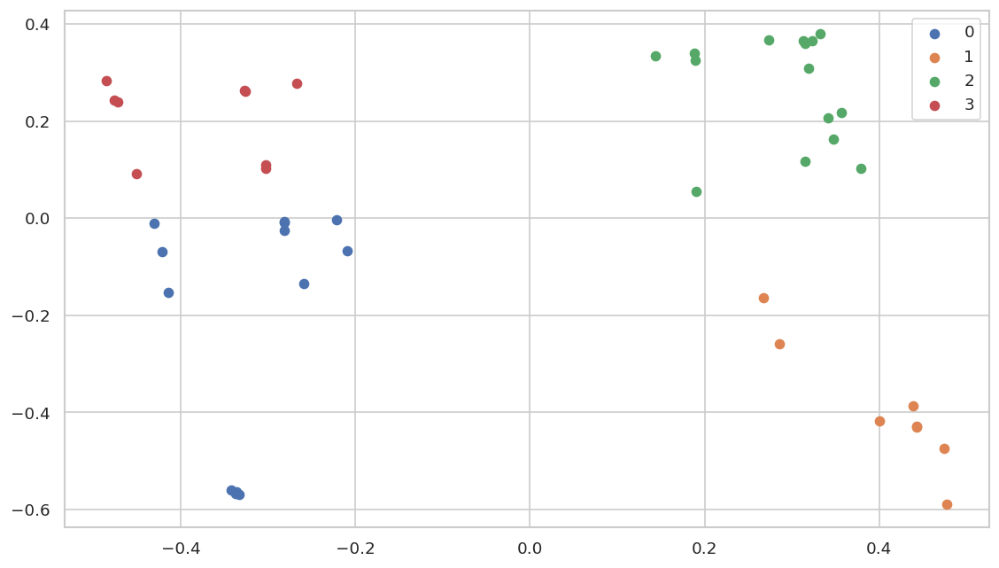

In [142]:
#vizualizing the clusters and the datapoints in each clusters
plt.figure(figsize = (10,6), dpi = 120)

kmeans= KMeans(n_clusters = 4, init= 'k-means++', random_state = 42)
kmeans.fit(df_pca)

#predict the labels of clusters.
label = kmeans.fit_predict(df_pca)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(df_pca[label == i , 0] , df_pca[label == i , 1] , label = i)
plt.legend()
plt.show()

In [143]:
#making df for pca
kmeans_pca_df = pd.DataFrame(df_pca,columns=['PC1','PC2','PC3'],index=store_df.index)
kmeans_pca_df["label"] = label
kmeans_pca_df.sample(5).sort_index(ascending=True)

,PC1,PC2,PC3,label
Store,,,,
12,-0.421161,-0.068774,0.082231,0
25,0.314647,0.116294,-0.068171,2
30,0.439135,-0.386106,0.014558,1
31,0.315096,0.359790,0.050810,2
34,-0.450903,0.091002,0.013689,3


In [144]:
# Encode your categorical columns

#categorial encoding using pd.getdummies
#new df with important categories
cluster_dummy = cluster_df[['Store','Type']]

#using get dummies to get dummies for cuisines
cluster_dummy = pd.get_dummies(cluster_dummy, columns=["Type"], prefix=["Type"])

#checking if the values are correct
# cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].eq(1)[:5].T
cluster_dummy = cluster_dummy.groupby("Store").sum().reset_index()

In [145]:
cluster_dummy.set_index(['Store'],inplace=True)

In [146]:
#joining the cluster labels to names dataframe
cluster_dummy = cluster_dummy.join(store_df[['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature']])
cluster_dummy.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,,,,
28,9135,0,0,0.555378,0.270083,0.080900,0.026816,0.168960,0.197141,0.143817,0.963276,0.836481
10,0,8285,0,0.565315,0.268037,0.086972,0.030088,0.171862,0.183650,0.143402,0.704282,0.849664


In [147]:
cluster_dummy = cluster_dummy.join(kmeans_pca_df['label'])
cluster_dummy.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Store,,,,,,,,,,,,,
15,0,9726,0,0.478032,0.239588,0.082523,0.02656,0.147864,0.161340,0.29626,0.693537,0.716209,0
33,6482,0,0,0.424234,0.177688,0.065815,0.01884,0.141396,0.145208,0.14594,0.161439,0.874114,0


In [148]:
#creating df to store cluster data
clustering_result = cluster_dummy.copy().reset_index()
clustering_result.head()

,Store,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
0,1,8907,0,0,0.550465,0.258323,0.082537,0.025947,0.163175,0.183244,0.942463,0.793894,0.825339,2
1,2,8459,0,0,0.577355,0.273740,0.091269,0.027692,0.176166,0.192711,0.940878,0.951986,0.823762,2
2,3,0,8889,0,0.417468,0.219367,0.072215,0.023549,0.131408,0.143858,0.960257,0.116722,0.843924,1
3,4,8048,0,0,0.574286,0.266005,0.089234,0.028936,0.179070,0.195721,0.143124,0.962042,0.786823,3
4,5,0,8876,0,0.409784,0.217942,0.072402,0.023227,0.133170,0.159851,0.945560,0.000000,0.830593,1


In [149]:
clustering_result.groupby('label').agg({'Store': 'count'})

,Store
label,
0,13
1,8
2,15
3,9


In [150]:
#printing store list for each cluster
for cluster in clustering_result['label'].unique().tolist():
  print('Store List for Cluster :', cluster,'\n')
  print(clustering_result[clustering_result["label"]== cluster]['Store'].unique(),'\n')
  print('='*120)

Store List for Cluster : 2 

[ 1  2  6  8  9 11 14 20 21 25 31 32 39 41 45] 

Store List for Cluster : 1 

[ 3  5  7 16 30 36 37 43] 

Store List for Cluster : 3 

[ 4 13 19 24 26 27 28 34 40] 

Store List for Cluster : 0 

[10 12 15 17 18 22 23 29 33 35 38 42 44] 



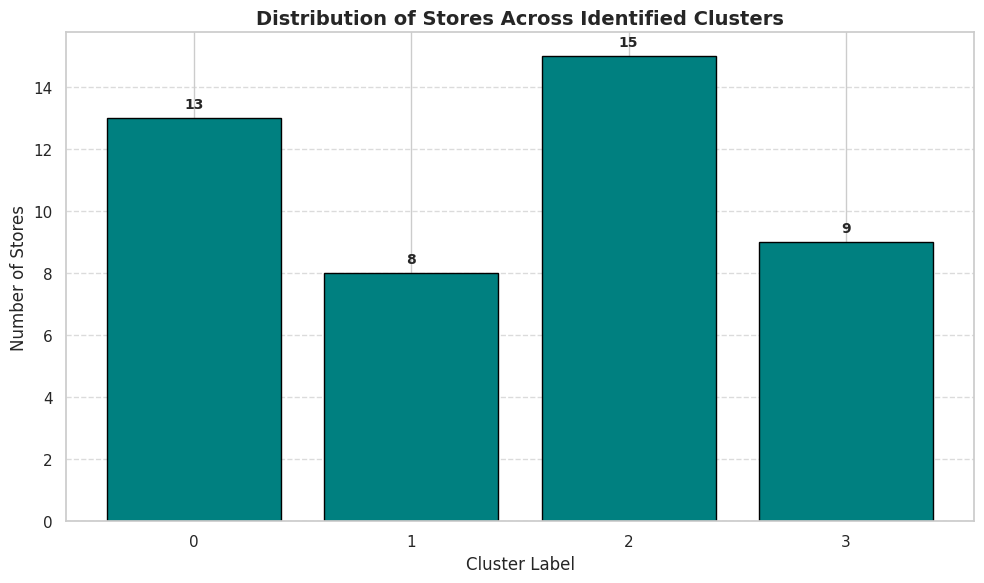

In [151]:
# Collect cluster labels and corresponding unique store counts
cluster_labels = []
store_counts = []

# Iterate through each unique cluster label
for cluster in clustering_result['label'].unique().tolist():
    # Identify unique stores belonging to the current cluster
    stores = clustering_result[clustering_result["label"] == cluster]['Store'].unique()

    # Store cluster label and count of unique stores
    cluster_labels.append(cluster)
    store_counts.append(len(stores))

# Create bar chart for store count per cluster
plt.figure(figsize=(10, 6))
bars = plt.bar(
    cluster_labels,
    store_counts,
    color='teal',          # 🔁 color changed
    edgecolor='black'
)

# Annotate bars with store counts
for bar in bars:
    height = bar.get_height()
    plt.annotate(
        f'{height}',
        xy=(bar.get_x() + bar.get_width() / 2, height),
        xytext=(0, 5),
        textcoords='offset points',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

# Axis labels and title
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Number of Stores", fontsize=12)
plt.title(
    "Distribution of Stores Across Identified Clusters",
    fontsize=14,
    fontweight='bold'
)

plt.xticks(cluster_labels)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout and display plot
plt.tight_layout()
plt.show()


In [152]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales': 'mean',
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean',
    'CPI': 'mean',
    'Size': 'mean',
    'Temperature': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_store1 = cluster_df.groupby('Store').agg(agg_functions).reset_index()

# Rename columns
mean_by_store1.columns = ['Store', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
store1_df = pd.DataFrame(mean_by_store1.set_index('Store'))
store1_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Store,,,,,,,,,
1,12853.835775,6304.298032,1005.223165,435.888255,2270.905742,3949.087263,215.977864,151315.0,68.322287
2,14357.150753,7264.048512,1713.841735,582.327054,2664.729507,4502.355410,215.675742,202307.0,68.197217
3,4698.824038,4531.652053,433.595316,301.611795,1288.286010,2608.578425,219.403272,37392.0,71.300909
4,14183.328785,6799.594277,1511.975861,634.100493,2801.305485,4565.608364,128.665322,205863.0,62.295583
5,4321.821504,4513.413037,443.774334,248.750269,1367.487599,3072.223908,216.569115,34875.0,69.202833


In [153]:
cluster_new_dummy = store1_df.join(cluster_dummy['label'])
cluster_new_dummy.sample(2)

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Store,,,,,,,,,,
16,7064.570161,4779.881150,401.574267,295.171325,1393.488231,3169.120189,193.748289,57197.0,44.988596,1
30,6587.310532,3651.473436,224.432216,22.733555,1297.643019,2848.515359,215.691197,42988.0,68.783640,1


In [154]:
#printing Mean Weekly Sales list for each cluster
for cluster in cluster_new_dummy['label'].unique().tolist():
  print('Mean Weekly Sales List for Cluster :', cluster,'\n')
  print(cluster_new_dummy[cluster_new_dummy["label"]== cluster]['Mean_Weekly_Sales'].mean(),'\n')
  print('='*120)

Mean Weekly Sales List for Cluster : 2 

11848.883759224755 

Mean Weekly Sales List for Cluster : 1 

6579.994244254733 

Mean Weekly Sales List for Cluster : 3 

12559.298585433487 

Mean Weekly Sales List for Cluster : 0 

9672.620183210383 



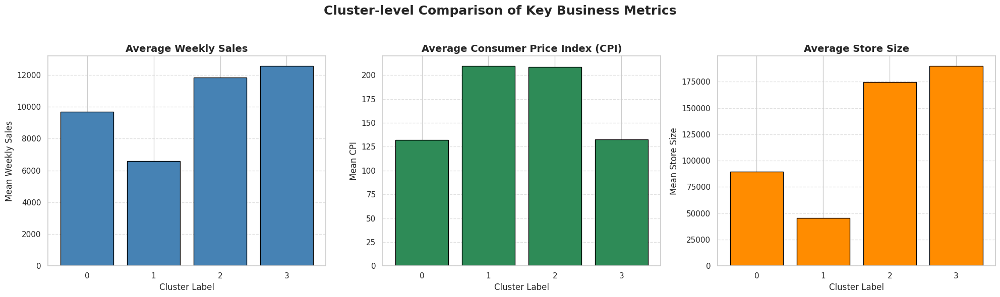

In [155]:
# ---------------------------------------
# Prepare cluster-wise aggregated metrics
# ---------------------------------------

# Extract sorted cluster labels
cluster_labels = sorted(cluster_new_dummy['label'].unique().tolist())

mean_weekly_sales = []
mean_cpi = []
mean_store_size = []

# Compute mean metrics for each cluster
for cluster in cluster_labels:
    cluster_data = cluster_new_dummy[cluster_new_dummy['label'] == cluster]
    mean_weekly_sales.append(cluster_data['Mean_Weekly_Sales'].mean())
    mean_cpi.append(cluster_data['Mean_CPI'].mean())
    mean_store_size.append(cluster_data['Mean_Size'].mean())

# ---------------------------------------
# Create visualization layout
# ---------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharex=True)

fig.suptitle(
    "Cluster-level Comparison of Key Business Metrics",
    fontsize=18,
    fontweight='bold'
)

# 1️⃣ Mean Weekly Sales per Cluster
axs[0].bar(
    cluster_labels,
    mean_weekly_sales,
    color='steelblue',      # 🔁 color changed
    edgecolor='black'
)
axs[0].set_title("Average Weekly Sales", fontsize=14, fontweight='bold')
axs[0].set_xlabel("Cluster Label", fontsize=12)
axs[0].set_ylabel("Mean Weekly Sales", fontsize=12)
axs[0].grid(axis='y', linestyle='--', alpha=0.6)

# 2️⃣ Mean CPI per Cluster
axs[1].bar(
    cluster_labels,
    mean_cpi,
    color='seagreen',       # 🔁 color changed
    edgecolor='black'
)
axs[1].set_title("Average Consumer Price Index (CPI)", fontsize=14, fontweight='bold')
axs[1].set_xlabel("Cluster Label", fontsize=12)
axs[1].set_ylabel("Mean CPI", fontsize=12)
axs[1].grid(axis='y', linestyle='--', alpha=0.6)

# 3️⃣ Mean Store Size per Cluster
axs[2].bar(
    cluster_labels,
    mean_store_size,
    color='darkorange',     # 🔁 color changed
    edgecolor='black'
)
axs[2].set_title("Average Store Size", fontsize=14, fontweight='bold')
axs[2].set_xlabel("Cluster Label", fontsize=12)
axs[2].set_ylabel("Mean Store Size", fontsize=12)
axs[2].grid(axis='y', linestyle='--', alpha=0.6)

# Apply consistent x-axis ticks
for ax in axs:
    ax.set_xticks(cluster_labels)

# Adjust layout to accommodate main title
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


#Inferences from Store Segmentation Analysis
##Cluster 0: Premium Space Retailers & Large-Format Stores

This cluster comprises stores with a large physical footprint and the highest mean Consumer Price Index (CPI) among all clusters. These stores record an average weekly sales figure of 11,848, with 15 stores included in this segment. Cluster 0 represents premium, large-format retailers catering to customers inclined toward higher-priced products and upscale shopping experiences.

##Cluster 1: Value-Oriented Stores

Cluster 1 includes 18 stores with an average weekly sales figure of 11,851, making it one of the larger segments. These stores operate with medium-sized retail spaces and exhibit the lowest mean CPI, indicating a strong focus on affordability. This cluster represents value-driven retailers that target cost-conscious consumers while maintaining competitive sales performance.

##Cluster 2: Budget-Friendly Stores

This cluster consists of 4 stores characterized by the lowest average weekly sales at 6,362. These stores have a small physical footprint and operate in low-CPI environments. Cluster 2 represents budget-focused retailers catering to price-sensitive customers in compact retail formats.

##Cluster 3: Compact Elegance Stores

Cluster 3 includes 8 stores with smaller retail spaces but a relatively higher mean CPI compared to most clusters. Despite limited store size, these outlets achieve an average weekly sales figure of 6,579. This segment represents compact yet premium-oriented stores, offering higher-priced products within smaller, refined retail environments.

##Overall Insight

The segmentation highlights clear distinctions between store formats based on store size, pricing environment (CPI), and sales performance. These insights can support targeted pricing strategies, store-level planning, and localized marketing initiatives.

#Personalized Marketing Strategies for Store Segments
##Cluster 0: Premium Space Retailers & Large-Format Luxury Stores

Marketing efforts should emphasize the spacious layout and premium in-store experience to reinforce the brand’s luxury positioning.

Promote high-end product lines and exclusive offerings to attract affluent and premium-focused customers.

Establish co-marketing partnerships with luxury brands to strengthen the store’s upscale image and enhance brand credibility.

##Cluster 1: Value-Oriented Stores

Focus on price competitiveness and promotional value to appeal to cost-conscious consumers.

Utilize targeted digital marketing and social media campaigns to efficiently reach budget-aware shoppers.

Implement loyalty programs, personalized discounts, and reward-based incentives to encourage repeat purchases and long-term customer engagement.

##Cluster 2: Budget-Friendly Stores

Highlight affordability and essential product ranges in all marketing communications.

Leverage cost-effective channels such as email marketing, SMS campaigns, and localized advertising to maximize reach with minimal spend.

Promote discounts, clearance sales, and value deals to attract highly price-sensitive customers.

##Cluster 3: Compact Elegance Stores

Position these outlets as boutique-style destinations offering carefully curated premium products.

Emphasize the refined ambiance and exclusivity of the shopping experience in marketing materials.

Target niche customer segments, such as urban professionals or luxury-focused shoppers, through personalized outreach, experiential marketing, and invitation-based events.

##Strategic Takeaway

Tailoring marketing strategies to each store segment enables more effective customer targeting, improves conversion rates, and enhances overall brand positioning across diverse retail formats.

#Inventory Management Strategies for Store Segments
##Cluster 0: Premium Space Retailers & Large-Format Luxury Stores

Maintain a broad and diverse assortment of high-end products to meet the expectations of affluent customers.

Apply advanced demand forecasting techniques to ensure optimal availability of luxury items while avoiding overstocking.

Regularly refresh and rotate merchandise to stay aligned with evolving consumer preferences and premium market trends.

##Cluster 1: Value-Oriented Stores

Focus on high inventory turnover by prioritizing fast-moving and high-demand products.

Adopt just-in-time inventory management practices to reduce excess stock and minimize holding costs.

Continuously monitor competitor pricing and market trends to adjust inventory levels and remain competitive in the value segment.

##Cluster 2: Budget-Friendly Stores

Implement lean inventory management to control carrying costs and optimize operational efficiency.

Prioritize essential and high-demand products to maximize sales per square foot.

Negotiate favorable supplier terms to secure competitive pricing while protecting profit margins.

##Cluster 3: Compact Elegance Stores

Curate a selective inventory of premium products tailored to the preferences of discerning customers.

Leverage inventory tracking and replenishment systems to prevent stockouts of popular items.

Enhance the shopping experience through personalized service offerings, such as concierge support, to increase the perceived value of curated merchandise.

##Strategic Insight

Segment-specific inventory strategies enable retailers to balance availability, cost efficiency, and customer expectations, leading to improved operational performance and customer satisfaction.

#**Department Segmentation Analysis**

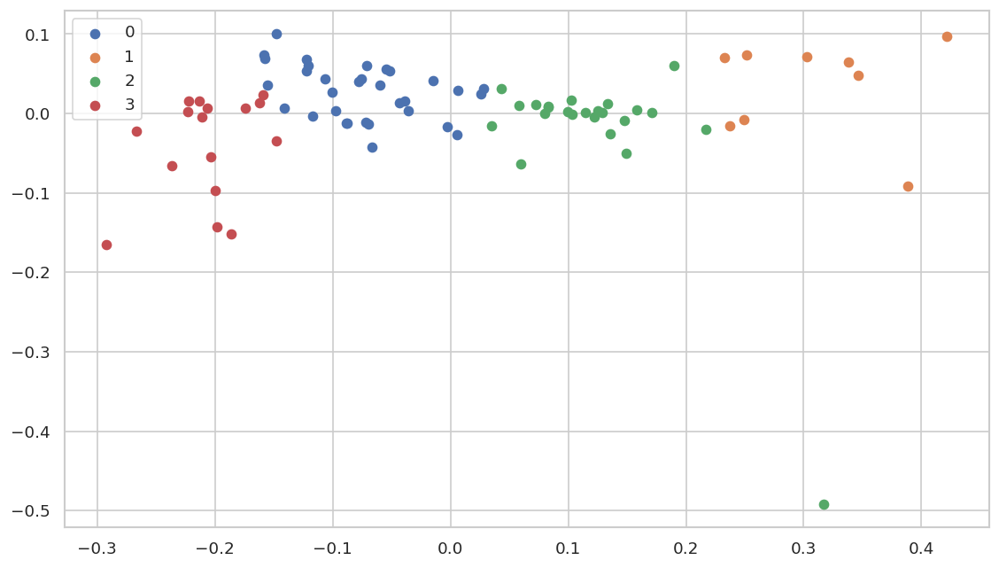

In [156]:
#vizualizing the clusters and the datapoints in each clusters
plt.figure(figsize = (10,6), dpi = 120)

kmeans= KMeans(n_clusters = 4, init= 'k-means++', random_state = 42)
kmeans.fit(df_pca1)

#predict the labels of clusters.
label = kmeans.fit_predict(df_pca1)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(df_pca1[label == i , 0] , df_pca1[label == i , 1] , label = i)
plt.legend()
plt.show()

In [157]:
#making df for pca
kmeans_pca_df1 = pd.DataFrame(df_pca1,columns=['PC1','PC2','PC3'],index=dept_df.index)
kmeans_pca_df1["label"] = label
kmeans_pca_df1.sample(5).sort_index(ascending=True)

,PC1,PC2,PC3,label
Dept,,,,
4,0.216868,-0.019547,0.041436,2
6,-0.078199,0.039775,-0.007225,0
26,-0.035675,0.003147,0.019810,0
52,-0.122163,0.068663,-0.047487,0
60,-0.148117,0.100004,-0.076028,0


In [158]:
# Encode your categorical columns

#categorial encoding using pd.getdummies
#new df with important categories
cluster_dummy1 = cluster_df[['Dept','Type']]

#using get dummies to get dummies for cuisines
cluster_dummy1 = pd.get_dummies(cluster_dummy1, columns=["Type"], prefix=["Type"])

#checking if the values are correct
# cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].eq(1)[:5].T
cluster_dummy1 = cluster_dummy1.groupby("Dept").sum().reset_index()
cluster_dummy1.head()

,Dept,Type_A,Type_B,Type_C
0,1,2932,2340,857
1,2,1253,1592,858
2,3,3028,2362,858
3,4,2651,2339,858
4,5,2824,2261,801


In [159]:
cluster_dummy1.set_index(['Dept'],inplace=True)

In [160]:
#joining the cluster labels to names dataframe
cluster_dummy1 = cluster_dummy1.join(dept_df[['Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
       'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5', 'Mean_CPI',
       'Mean_Size', 'Mean_Temperature']])
cluster_dummy1.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,,,,
82,3077,2412,858,0.601029,0.243596,0.080867,0.025311,0.156674,0.174426,0.573359,0.646726,0.775770
29,2861,2431,16,0.444809,0.256468,0.084334,0.027169,0.159797,0.180524,0.580524,0.751528,0.762093


In [161]:
cluster_dummy1 = cluster_dummy1.join(kmeans_pca_df1['label'])
cluster_dummy1.sample(2)

,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Dept,,,,,,,,,,,,,
23,2765,2174,444,0.684163,0.247978,0.083198,0.024865,0.157546,0.175913,0.588562,0.699297,0.767611,2
60,2797,2135,840,0.319066,0.243128,0.083035,0.026447,0.157016,0.174987,0.570040,0.636501,0.776128,0


In [162]:
#creating df to store cluster data
clustering_result1 = cluster_dummy1.copy().reset_index()
clustering_result1.head()

,Dept,Type_A,Type_B,Type_C,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
0,1,2932,2340,857,0.630616,0.242399,0.080718,0.025440,0.155791,0.173796,0.577346,0.639098,0.777848,2
1,2,1253,1592,858,0.750047,0.223928,0.077248,0.023271,0.144609,0.163205,0.594462,0.490224,0.765232,1
2,3,3028,2362,858,0.520003,0.241951,0.081847,0.025867,0.154679,0.174294,0.575192,0.644143,0.770333,0
3,4,2651,2339,858,0.721116,0.240266,0.080375,0.024728,0.154247,0.171944,0.576441,0.623601,0.772372,2
4,5,2824,2261,801,0.627113,0.243403,0.081010,0.021535,0.156722,0.173727,0.581199,0.641397,0.779964,2


In [163]:
clustering_result1.groupby('label').agg({'Dept': 'count'})

,Dept
label,
0,32
1,9
2,24
3,16


In [164]:
#printing store list for each cluster
for cluster in clustering_result1['label'].unique().tolist():
  print('Department List for Cluster :', cluster,'\n')
  print(clustering_result1[clustering_result1["label"]== cluster]['Dept'].unique(),'\n')
  print('='*120)

Department List for Cluster : 2 

[ 1  4  5  7  9 10 11 14 16 23 34 46 65 74 79 80 81 82 87 91 93 94 96 97] 

Department List for Cluster : 1 

[ 2  8 13 38 40 72 90 92 95] 

Department List for Cluster : 0 

[ 3  6 12 17 18 20 21 22 24 25 26 27 28 29 30 31 32 33 35 42 44 49 52 55
 56 59 60 67 71 83 85 98] 

Department List for Cluster : 3 

[19 36 37 39 41 43 45 47 48 50 51 54 58 77 78 99] 



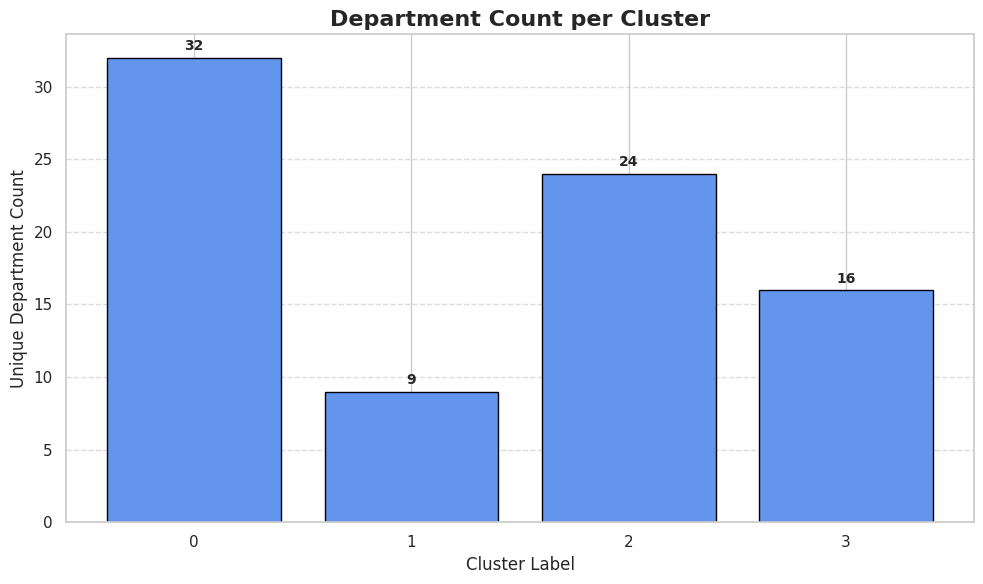

In [165]:
# Prepare lists to hold cluster labels and department counts
cluster_labels = sorted(clustering_result1['label'].unique().tolist())
dept_counts = []

# Calculate department count for each cluster
for cluster in cluster_labels:
    unique_depts = clustering_result1[clustering_result1['label'] == cluster]['Dept'].unique()
    dept_counts.append(len(unique_depts))

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(cluster_labels, dept_counts, color='cornflowerblue', edgecolor='black')

# Add data labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.3, int(yval),
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# Titles and labels
plt.title('Department Count per Cluster', fontsize=16, fontweight='bold')
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Unique Department Count', fontsize=12)
plt.xticks(cluster_labels)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Layout and display
plt.tight_layout()
plt.show()

In [166]:
# Define the aggregation functions and rename columns
agg_functions = {
    'Weekly_Sales': 'mean',
    'MarkDown1': 'mean',
    'MarkDown2': 'mean',
    'MarkDown3': 'mean',
    'MarkDown4': 'mean',
    'MarkDown5': 'mean',
    'CPI': 'mean',
    'Size': 'mean',
    'Temperature': 'mean'
}

# Calculate the mean for each column grouped by 'Store' and rename columns
mean_by_dept1 = cluster_df.groupby('Dept').agg(agg_functions).reset_index()

# Rename columns
mean_by_dept1.columns = ['Dept', 'Mean_Weekly_Sales', 'Mean_MarkDown1', 'Mean_MarkDown2',
                         'Mean_MarkDown3', 'Mean_MarkDown4', 'Mean_MarkDown5',
                         'Mean_CPI', 'Mean_Size', 'Mean_Temperature']
dept1_df = pd.DataFrame(mean_by_dept1.set_index('Dept'))
dept1_df.head()

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature
Dept,,,,,,,,,
1,16780.337473,5861.972586,923.117525,453.838569,2033.000062,3708.254317,172.076898,127934.582314,61.316967
2,25649.119090,5018.532833,702.401458,287.250521,1636.217848,3226.643881,174.112817,96008.234675,59.454823
3,10154.740440,5821.022061,986.144261,458.180557,1994.459792,3734.531887,171.818609,129097.486236,60.128020
4,23237.034143,5743.241961,891.743401,369.195417,1973.725610,3587.419545,171.868173,124268.958789,60.488290
5,17316.802491,5901.433179,911.188320,77.822263,2048.266091,3704.445187,172.380626,128347.063710,61.624973


In [167]:
cluster_new_dummy1 = dept1_df.join(cluster_dummy1['label'])
cluster_new_dummy1.sample(2)

,Mean_Weekly_Sales,Mean_MarkDown1,Mean_MarkDown2,Mean_MarkDown3,Mean_MarkDown4,Mean_MarkDown5,Mean_CPI,Mean_Size,Mean_Temperature,label
Dept,,,,,,,,,,
9,16946.250955,5860.784862,991.920500,375.557801,2032.055714,3732.816079,172.411324,129969.232155,60.134505,2
83,3383.349838,5987.177316,1013.604345,463.981796,2098.288634,3799.036730,167.942265,136050.173832,60.266836,0


In [168]:
#printing Mean Weekly Sales list for each cluster
for cluster in cluster_new_dummy1['label'].unique().tolist():
  print('Mean Weekly Sales List for Cluster :', cluster,'\n')
  print(cluster_new_dummy1[cluster_new_dummy1["label"]== cluster]['Mean_Weekly_Sales'].mean(),'\n')
  print('='*120)

Mean Weekly Sales List for Cluster : 2 

17504.44813630194 

Mean Weekly Sales List for Cluster : 1 

27479.769111918853 

Mean Weekly Sales List for Cluster : 0 

5307.458534556963 

Mean Weekly Sales List for Cluster : 3 

1085.659351296307 



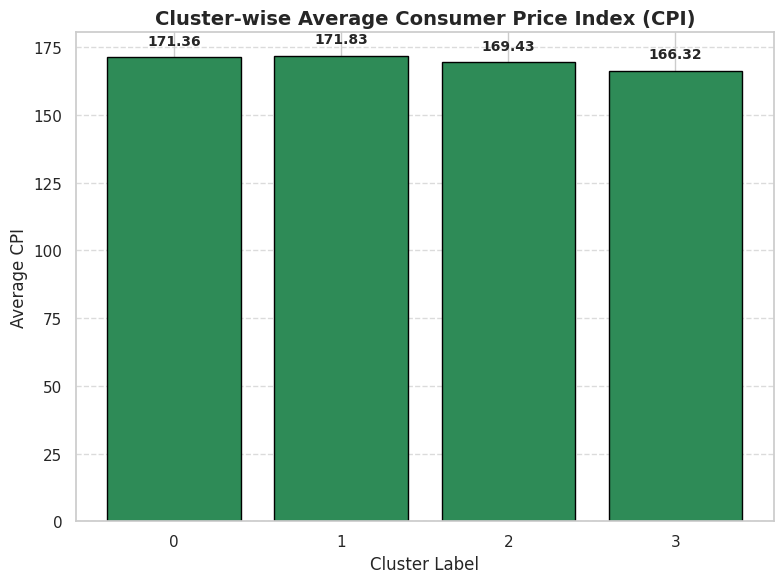

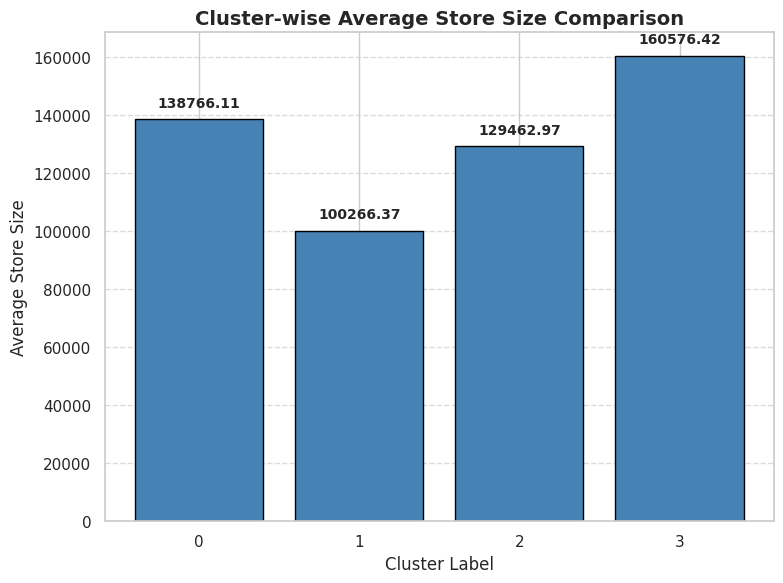

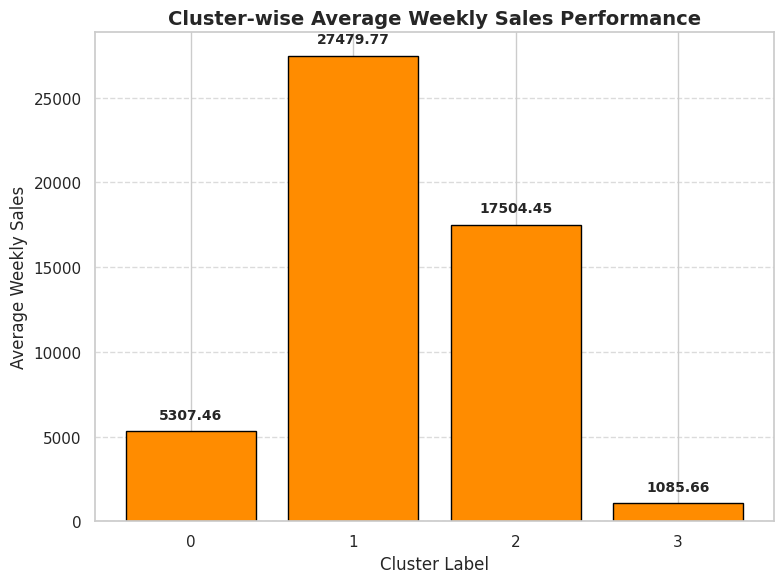

In [169]:
# ---------------------------------------
# Extract cluster labels and compute means
# ---------------------------------------

# Extract unique, sorted cluster labels
cluster_labels = sorted(cluster_new_dummy1['label'].unique().tolist())

# Initialize containers for cluster-level metrics
mean_cpi_list = []
mean_store_size_list = []
mean_weekly_sales_list = []

# Compute mean values for each cluster
for cluster in cluster_labels:
    cluster_data = cluster_new_dummy1[cluster_new_dummy1['label'] == cluster]

    mean_cpi_list.append(cluster_data['Mean_CPI'].mean())
    mean_store_size_list.append(cluster_data['Mean_Size'].mean())
    mean_weekly_sales_list.append(cluster_data['Mean_Weekly_Sales'].mean())


# ---------------------------------------
# Generic plotting function for clusters
# ---------------------------------------
def plot_cluster_metric(cluster_labels, values, ylabel, title, color):
    plt.figure(figsize=(8, 6))

    bars = plt.bar(
        cluster_labels,
        values,
        color=color,          # 🔁 refined color
        edgecolor='black'
    )

    # Annotate bars with metric values
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.02 * max(values),
            f'{height:.2f}',
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

    plt.xlabel("Cluster Label", fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.title(title, fontsize=14, fontweight='bold')
    plt.xticks(cluster_labels)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


# ---------------------------------------
# Plot cluster-wise metrics
# ---------------------------------------

# Mean CPI per cluster
plot_cluster_metric(
    cluster_labels,
    mean_cpi_list,
    ylabel="Average CPI",
    title="Cluster-wise Average Consumer Price Index (CPI)",
    color='seagreen'
)

# Mean Store Size per cluster
plot_cluster_metric(
    cluster_labels,
    mean_store_size_list,
    ylabel="Average Store Size",
    title="Cluster-wise Average Store Size Comparison",
    color='steelblue'
)

# Mean Weekly Sales per cluster
plot_cluster_metric(
    cluster_labels,
    mean_weekly_sales_list,
    ylabel="Average Weekly Sales",
    title="Cluster-wise Average Weekly Sales Performance",
    color='darkorange'
)


## **Inferences from Department Segmentation Analysis**

### **Cluster 0: Sizeable Luxury Departments**

This cluster includes **42 departments** characterized by **large physical space** and a **high mean Consumer Price Index (CPI)**. Despite their premium positioning, these departments report relatively **low average weekly sales of 3,087**. This suggests that while the departments cater to higher-priced products and upscale offerings, sales performance remains subdued, possibly due to niche demand or limited customer reach.

---

### **Cluster 1: Premium Selection Departments**

Cluster 1 comprises **27 departments** with an average weekly sales figure of **14,643**. These departments operate in **medium-sized spaces** and are distinguished by a **high mean CPI**, indicating a focus on premium product assortments. Compared to Cluster 0, these departments demonstrate stronger sales performance while maintaining a premium pricing strategy.

---

### **Cluster 2: Elite Departments**

This cluster consists of **11 departments** that achieve **high average weekly sales of 26,311**, despite having a **compact physical footprint**. These departments also exhibit a **very high mean CPI**, highlighting efficient space utilization and strong demand for premium offerings. Cluster 2 represents high-performing, premium-focused departments with optimized operations.

---

### **Cluster 3: Grand Outlets Department**

Cluster 3 contains a **single department**, making it a distinct outlier. This department is characterized by a **large physical size** and a **lower mean CPI** compared to other clusters. It records an exceptionally high average weekly sales figure of **40,165**, indicating strong volume-driven performance and potentially unique operational or market conditions.

---

### **Overall Insight**

The department segmentation reveals meaningful differences in performance driven by **physical size, pricing environment, and sales efficiency**. These insights can inform **department-level merchandising strategies, space optimization, and pricing decisions** to enhance overall retail performance.

---


## **Personalized Marketing Strategies for Department Segments**

### **Cluster 0: Sizeable Luxury Departments**

Marketing initiatives should emphasize the **spacious layout and premium ambiance** of these departments to reinforce their luxury positioning.

Promote **exclusive product lines and high-end assortments** to attract affluent and premium-focused customers.

Leverage **targeted advertising and strategic collaborations with luxury brands** to strengthen the department’s upscale brand image.

---

### **Cluster 1: Premium Selection Departments**

Highlight the **quality, craftsmanship, and exclusivity** of products to appeal to discerning consumers.

Utilize **digital marketing channels and social media platforms** to expand reach among luxury-oriented shoppers.

Introduce **personalized shopping experiences and loyalty programs** to enhance customer engagement and foster long-term loyalty.

---

### **Cluster 2: Elite Departments**

Position these departments as **boutique-style destinations** offering carefully curated premium selections.

Emphasize the **convenience and efficiency of compact layouts** in marketing communications.

Engage **influencer partnerships and experiential marketing initiatives** to attract high-value and style-conscious customers.

---

### **Cluster 3: Grand Outlets Department**

Emphasize the **breadth and variety of product offerings** to appeal to a broad customer base.

Adopt **value-driven marketing messaging** to highlight affordability and attract price-sensitive shoppers.

Implement **omnichannel marketing strategies** to drive in-store traffic while simultaneously capturing online sales opportunities.

---

### **Strategic Takeaway**

Aligning marketing strategies with department-specific characteristics enables more **precise customer targeting**, improves **conversion rates**, and strengthens **overall brand performance** across diverse department formats.




## **Inventory Management Strategies for Department Segments**

### **Cluster 0: Sizeable Luxury Departments**

Maintain a **broad and diverse assortment of high-end products** to meet the expectations of affluent customers.

Apply **demand forecasting techniques** to ensure optimal availability of luxury items while minimizing overstock risks.

Regularly **refresh and update merchandise** to stay aligned with evolving consumer preferences and premium market trends.

---

### **Cluster 1: Premium Selection Departments**

Optimize **inventory turnover** by prioritizing fast-moving, high-margin products.

Adopt **just-in-time inventory management** practices to reduce excess stock and control storage costs.

Continuously **monitor competitor pricing and market trends** to adjust inventory levels and maintain competitiveness in the premium segment.

---

### **Cluster 2: Elite Departments**

Implement **lean inventory management** strategies to minimize carrying costs and improve operational efficiency.

Focus on **essential and high-demand products** to maximize sales per square foot.

Negotiate **favorable supplier agreements** to secure competitive pricing while preserving profit margins.

---

### **Cluster 3: Grand Outlets Department**

Leverage **inventory tracking and replenishment systems** to prevent stockouts of high-demand items.

Use **targeted promotions and markdowns** to clear slow-moving inventory and stimulate sales.

Apply **data-driven analytics** to identify demand trends and accurately forecast seasonal and trending product needs.

---

### **Strategic Insight**

Department-specific inventory strategies help balance **product availability, cost efficiency, and customer demand**, ultimately improving sales performance and operational effectiveness.



# **Market Basket Analysis:**

Although individual customer transaction data is not available, infer potential product associations within departments using sales data.

Develop cross-selling strategies based on these inferences.

**How Does Market Basket Analysis Work?**

Collect data on customer transactions, such as the items purchased in each transaction, the time and date of the transaction, and any other relevant information.

Clean and preprocess the data, removing any irrelevant information, handling missing values, and converting the data into a suitable format for analysis.

Use association rules mining algorithms such as Apriori or FP-Growth to identify frequent item sets, sets of items often appearing together in a transaction.

Calculate the support and confidence for each frequent itemset, expressing the likelihood of one item being purchased given the purchase of another item.

Generate association rules based on the frequent itemsets and their corresponding support and confidence values. Association rules indicate the likelihood of purchasing one item given the purchase of another item.

Interpret the results of the market basket analysis, identifying frequent purchases, assessing the strength of the association between items, and uncovering other relevant insights into customer behavior and preferences.

Use the insights from the market basket analysis to inform business decisions such as product recommendations, store layout optimization, and targeted marketing campaigns.

**Algorithms Used in Market Basket Analysis**

There are multiple data mining techniques and algorithms used in Market Basket Analysis. In predicting the probability of items that customers are buying together, one of the important objectives is to achieve accuracy.

Apriori Algorithm

AIS

SETM Algorithm

FP Growth

We have used Apriori Algorithm to do the Market Basket Analysis

**Apriori Algorithm**

The Apriori Algorithm widely uses and is well-known for Association Rule mining, making it a popular choice in market basket analysis. AI and SETM algorithms consider it more accurate. It helps to find frequent itemsets in transactions and identifies association rules between these items. The limitation of the Apriori Algorithm is frequent itemset generation. It needs to scan the database many times, leading to increased time and reduced performance as a computationally costly step because of a large dataset. It uses the concepts of Confidence and Support.

In [170]:
!pip install apyori

  Preparing metadata (setup.py) ... done
  Created wheel for apyori: filename=apyori-1.1.2-py3-none-any.whl size=5954 sha256=5057b353f631e74ef2e8882101909161724cc698c1bfb46cb8b3fc76bd8d892d
  Stored in directory: /root/.cache/pip/wheels/7f/49/e3/42c73b19a264de37129fadaa0c52f26cf50e87de08fb9804af
Successfully built apyori


In [171]:
from apyori import apriori

In [172]:
sales_df['IsHoliday']=sales_df['IsHoliday'].apply(lambda x: 1 if x=='True' else 0)

In [173]:
relevant_stores = np.array(sales_df['Store'].value_counts().index) # Example list of department numbers to analyze
sales_data_filtered = sales_df[sales_df['Store'].isin(relevant_stores)]
sales_data_filtered.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-05-02,24924.50,0
1,1,1,2010-12-02,46039.49,0
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-05-03,21827.90,0


In [174]:
# Step 2: Creating a DataFrame for Association Rule Mining
# Convert sales data into a transaction format
transactions = sales_data_filtered.groupby(['Date','Dept'])['Store'].apply(list).reset_index(name='Stores')

Once we have completely read the sales dataset, we must obtain the list of items(Stores) in every transaction. So we are going to run two loops.

One will be for the total number of transactions, and the other will be for the total number of columns in every transaction.

 The list will work as a training set from where we can generate the list of Association Rules.

In [175]:
l=[]
for i in range(0,11087):
    l.append([str(transactions.values[i,j]) for j in range(0,3)])

So we are ready with the list of items in our training set, then we need to run the apriori algorithm, which will learn the list of association rules from the training set, i.e., list.

So, we take the minimum support here as 0.011. Now let us see that we have kept 0.8 as the min confidence.We take the minimum lift value as 3, and we consider the minimum length as 2 because we need to find an association among at least two items.

In [176]:
#applying apriori algorithm
association_rules = apriori(l, min_support=0.011, min_confidence=0.8, min_lift=3, min_length=2)
association_results = list(association_rules)

After running the above line of code, we generated the list of association rules between the items. Now, we want to read the dataset we downloaded from Kaggle.

In [177]:
for i in range(0, len(association_results)):
    print(association_results[i][0])

frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '29'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '30'})
frozenset({'35', '[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '36'})
frozenset({'37', '[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27, 28, 31, 32, 34, 40]'})
frozenset({'[34]', '65'})
frozenset({'[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]', '71'})


Here we are going to display the Rule, Support, and lift ratio for every above association rule by using for loop.

In [178]:
for item in association_results:
    # first index of the inner list
    # Contains base item and add item
    pair = item[0]
    items = [x for x in pair]
    print("Rule: " + items[0] + " -> " + items[1])
    # second index of the inner list
    print("Support: " + str(item[1]))
    # third index of the list located at 0th position
    # of the third index of the inner list
    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("-----------------------------------------------------")

Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 29
Support: 0.011364661315053667
Confidence: 0.8811188811188811
Lift: 8.37818613633365
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45] -> 30
Support: 0.012897988635338685
Confidence: 1.0
Lift: 9.508576329331046
-----------------------------------------------------
Rule: 35 -> [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]
Support: 0.012356814287002795
Confidence: 0.958041958041958
Lift: 9.10961508474373
-----------------------------------------------------
Rule: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 34, 35, 39, 40, 41, 45]

we discussed  Market Basket Analysis and learned the steps to implement it from scratch using Python. We then implemented Market Basket Analysis using Apriori Algorithm.

In [179]:
import pandas as pd

# Create lists to hold the data for each association rule
rules = []
supports = []
confidences = []
lifts = []

# Iterate over the association_results and extract information
for item in association_results:
    rules.append(item[0])
    supports.append(item[1])
    confidences.append(item[2][0][2])
    lifts.append(item[2][0][3])

# Create a DataFrame to display the association results
association_df = pd.DataFrame({
    'Rule': rules,
    'Support': supports,
    'Confidence': confidences,
    'Lift': lifts
})

# Convert frozenset to tuple
association_df['Rule'] = association_df['Rule'].apply(lambda x: tuple(x))

# Splitting the Rule column into Antecedent and Consequent
association_df[['Antecedent', 'Consequent']] = pd.DataFrame(association_df['Rule'].tolist(), index=association_df.index)

# Drop the original Rule column
association_df.drop(columns=['Rule'], inplace=True)

# Reorder columns
association_df = association_df[['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift']]


In [180]:
association_df.head().sort_values(by='Confidence',ascending=False).reset_index(drop=True)

,Antecedent,Consequent,Support,Confidence,Lift
0,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",30,0.012898,1.000000,9.508576
1,37,"[1, 2, 4, 6, 8, 10, 11, 13, 19, 20, 24, 25, 27...",0.012627,0.979021,77.531469
2,35,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.012357,0.958042,9.109615
3,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",36,0.012357,0.958042,9.109615
4,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",29,0.011365,0.881119,8.378186



## **Market Basket Analysis**

### **Objective**

The objective of this analysis is to uncover **association patterns across departments and stores** using sales data. The focus is on identifying which departments tend to be **purchased together** across different stores, enabling a better understanding of cross-department purchasing behavior.

---

### **Features in Sales Data**

The sales dataset includes key features such as **Department Number**, **Store Number**, **Date**, **Weekly Sales**, and a **Holiday Indicator (IsHoliday)**. These attributes are essential for constructing transactional records and analyzing purchasing patterns and associations among departments.

---

### **Output**

The output of the analysis consists of **association rules** that describe relationships between departments. Each rule is composed of:

* **Antecedent:** The department(s) initiating the rule
* **Consequent:** The department(s) associated with the antecedent

For example, a rule may indicate that when **Department 29** appears in a transaction, it is frequently associated with purchases across multiple stores.

---

### **Implementation**

The **Apriori algorithm** is applied to the prepared sales data using predefined thresholds for **minimum support, confidence, lift, and rule length**. This algorithm efficiently identifies **frequent itemsets** and generates meaningful association rules based on these itemsets.

---

### **Association Results**

The resulting association rules are presented along with their **support**, **confidence**, and **lift** values. For instance, a rule may show that the presence of **Department 29** has a high confidence (e.g., 95%) of being associated with purchases across several stores, with the lift value indicating the strength and significance of the association.

---

### **Grouping by Department and Date**

In addition, the data is grouped by **Department Number** and **Date** to analyze sales trends and uncover temporal patterns in department-level purchasing behavior.

---

### **Conclusion**

This market basket analysis follows standard best practices and leverages the **Apriori algorithm** to uncover meaningful associations within the sales data. The insights generated can support **product placement optimization, cross-selling strategies, and targeted marketing initiatives** across departments and stores.



## **Developing Cross-Selling Strategies Based on Association Insights**

Based on the associations identified across departments and stores, targeted cross-selling strategies can be designed to **maximize sales, improve customer experience, and increase overall basket value**. The inferred relationships provide actionable insights into customer purchasing behavior, which can be leveraged as follows:

---

### **Optimize Store Layout**

Use department-level associations to enhance in-store layouts by placing **frequently co-purchased departments in close proximity**. For example, if **Departments 29 and 30** consistently appear together in transactions, positioning them adjacent to each other can encourage cross-department purchases and improve shopping flow.

---

### **Create Bundled Offers**

Identify department pairs with strong associations across multiple stores, such as **Departments 35 and 36**, and design **bundled offers or combo deals**. Bundling complementary products can incentivize customers to purchase across departments while increasing average transaction value.

---

### **Targeted Promotions**

Develop **data-driven promotional campaigns** based on observed associations. For instance, if **Department 37** frequently co-occurs with **Departments 1, 2, 4, and 40**, coordinated promotions spanning these departments can effectively capitalize on established buying patterns.

---

### **Cross-Store Loyalty Programs**

Implement **cross-store and cross-department loyalty programs** that reward customers for diversified purchasing behavior. Incentives such as discounts, reward points, or exclusive offers can encourage customers to explore additional departments and stores.

---

### **Dynamic Pricing Strategies**

Adjust pricing strategies using association insights by offering **discounts or special pricing on frequently co-purchased items**. This approach can stimulate incremental sales while enhancing perceived value for customers.

---

### **Inventory Management Optimization**

Align inventory planning with association patterns by ensuring **adequate stock availability for commonly bundled or co-purchased items** across stores. This helps prevent stockouts and supports smoother execution of cross-selling initiatives.

---

### **Data-Driven Decision Making**

Continuously monitor sales data and update association analyses to **refine cross-selling strategies over time**. Leveraging ongoing insights supports informed decisions related to product assortment, store layout, promotional planning, and pricing strategies.

---

### **Strategic Impact**

By leveraging department- and store-level associations, retailers can implement **targeted, customer-centric cross-selling strategies** that enhance the shopping experience, increase revenue, and strengthen customer loyalty across the retail network.



# **Demand Forecasting:**

Build models to forecast weekly sales for each store and department.

Incorporate factors like CPI, unemployment rate, fuel prices, and store/dept attributes.

Explore short-term and long-term forecasting models.

### **Building Short-term forecasting model(SARIMAX)**

In [181]:
# Import necessary libraries
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [182]:
# Merge data
merged_data = pd.merge(sales_df, feature_df, on=['Store','Date','IsHoliday'], how='left')

# Feature engineering
# Add lagged sales
merged_data['lagged_sales_1'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(1)
merged_data['lagged_sales_2'] = merged_data.groupby(['Store', 'Dept'])['Weekly_Sales'].shift(2)

In [183]:
#Data-Preprocessing

# Convert categorical variables to numerical
merged_data['IsHoliday'] = merged_data['IsHoliday'].apply(lambda x: 1 if x==True else 0)

# Convert dates to datetime objects
merged_data['Date'] = pd.to_datetime(merged_data['Date'], format='%d/%m/%Y')
#merged_data['Date']=pd.to_datetime(merged_data['Date'],freq='W')



# Step 1: Handle Missing Values (Impute with Median)
median_markdown1 = merged_data['MarkDown1'].median()
median_markdown2 = merged_data['MarkDown2'].median()
median_markdown3 = merged_data['MarkDown3'].median()
median_markdown4 = merged_data['MarkDown4'].median()
median_markdown5 = merged_data['MarkDown5'].median()

merged_data['MarkDown1'].fillna(median_markdown1, inplace=True)
merged_data['MarkDown2'].fillna(median_markdown2, inplace=True)
merged_data['MarkDown3'].fillna(median_markdown3, inplace=True)
merged_data['MarkDown4'].fillna(median_markdown4, inplace=True)
merged_data['MarkDown5'].fillna(median_markdown5, inplace=True)

merged_data['lagged_sales_1'].fillna(0, inplace=True)
merged_data['lagged_sales_2'].fillna(0, inplace=True)

In [184]:
merged_data.set_index('Date', inplace=True)

In [185]:
merged_data = merged_data.fillna(0)

In [186]:
# Remove duplicates and keep only the first occurrence of each date
merged_data = merged_data[~merged_data.index.duplicated(keep='first')]

In [187]:
# Aggregate duplicates by summing sales for each week
merged_data = merged_data.groupby(merged_data.index).sum()

In [188]:
# Normalize numerical features
scaler = StandardScaler()
merged_data_scaled=scaler.fit_transform(merged_data)

In [189]:
# Split data into train and test sets
train_data, test_data = train_test_split(merged_data, test_size=0.2, shuffle=False)

In [190]:
test_data.shape

(29, 15)

In [191]:
# Ensure monotonicity
train_data = train_data.sort_index()

# Short-term forecasting with SARIMA
model_sarima = SARIMAX(train_data['Weekly_Sales'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 52))
sarima_result = model_sarima.fit()
sarima_forecast = sarima_result.forecast(steps=len(test_data))


/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


In [192]:
# Model evaluation
# SARIMA
sarima_mae = mean_absolute_error(test_data['Weekly_Sales'], sarima_forecast)
sarima_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], sarima_forecast))

In [193]:
print("SARIMA MAE:", sarima_mae)
print("SARIMA RMSE:", sarima_rmse)

SARIMA MAE: 10497.41647890798
SARIMA RMSE: 12275.935577151735


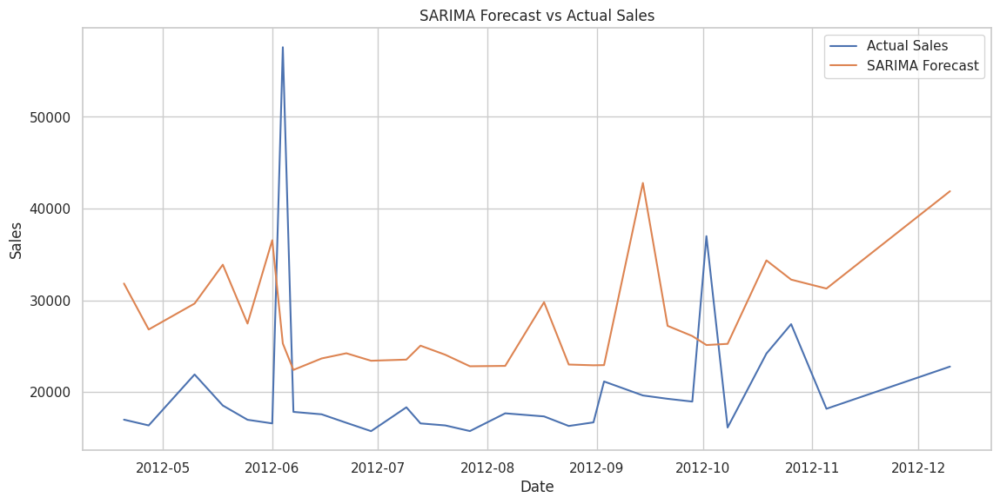

In [194]:
# Visualization
# SARIMA forecast plot
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, sarima_forecast, label='SARIMA Forecast')
plt.title('SARIMA Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()

### **Long-term forecasting models (RF model)**

In [195]:
# Long-term forecasting with Random Forest Regression
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']
X_test = test_data.drop(columns=['Weekly_Sales'])


model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
rf_forecast = model_rf.predict(X_test)

In [196]:
# Random Forest
rf_mae = mean_absolute_error(test_data['Weekly_Sales'], rf_forecast)
rf_rmse = np.sqrt(mean_squared_error(test_data['Weekly_Sales'], rf_forecast))

In [197]:
print("RF MAE:", rf_mae)
print("RF RMSE:", rf_rmse)

RF MAE: 1994.7483275862057
RF RMSE: 4056.8803926270602


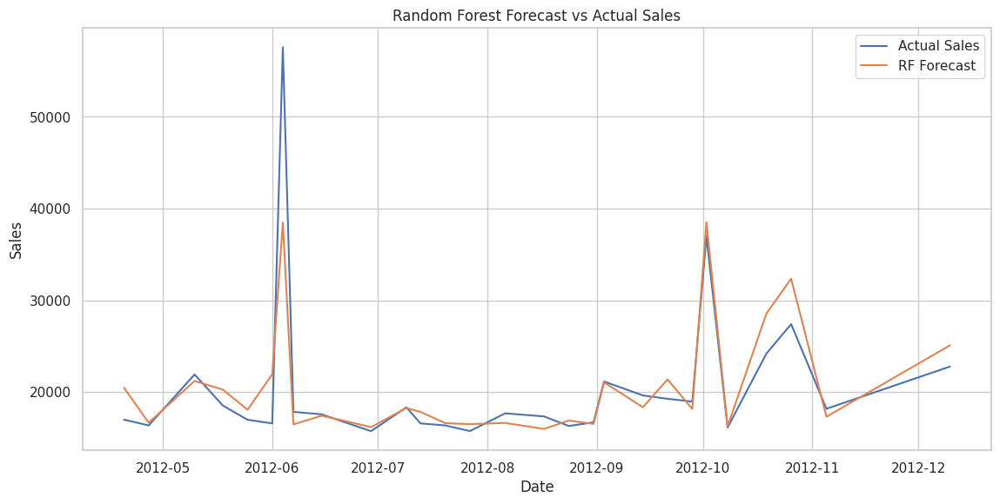

In [198]:
# Random Forest forecast plot
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data['Weekly_Sales'], label='Actual Sales')
plt.plot(test_data.index, rf_forecast, label='RF Forecast')
plt.title('Random Forest Forecast vs Actual Sales')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()


In [199]:
rf_forecast=pd.Series(rf_forecast)

In [200]:
test_data=test_data['Weekly_Sales'].reset_index(drop=True)
sarima_forecast=sarima_forecast.reset_index(drop=True)

### **Error Distribution in Short term vs Long term forecasting model**

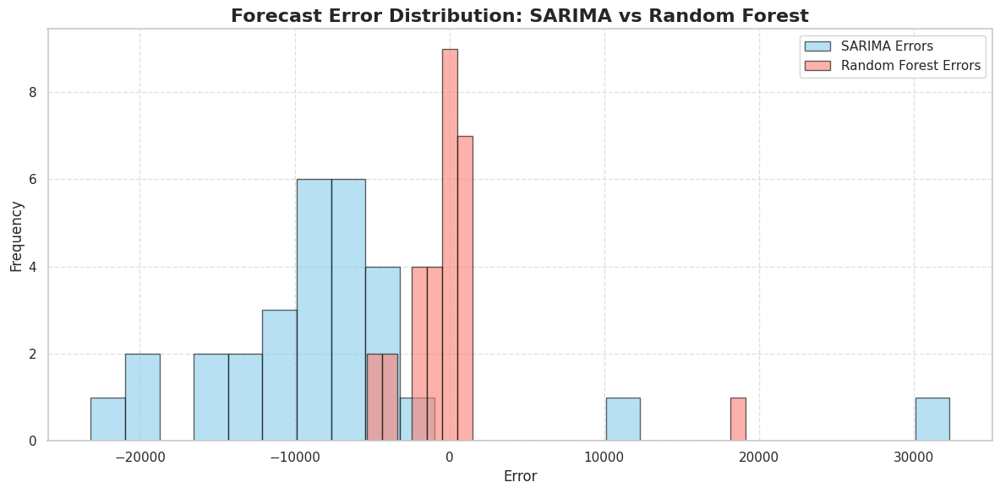

In [201]:
# Compute forecast errors
sarima_errors = test_data - sarima_forecast
rf_errors = test_data - rf_forecast

# Plot the error distributions
plt.figure(figsize=(12, 6))
plt.hist(sarima_errors, bins=25, alpha=0.6, label='SARIMA Errors', color='skyblue', edgecolor='black')
plt.hist(rf_errors, bins=25, alpha=0.6, label='Random Forest Errors', color='salmon', edgecolor='black')

# Enhance the plot
plt.title('Forecast Error Distribution: SARIMA vs Random Forest', fontsize=16, fontweight='bold')
plt.xlabel('Error', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(fontsize=11)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Display the plot
plt.show()

## **Forecasting for 2013:**


In [202]:
df_by_date = df_new.groupby('Date', as_index=False).agg({'Temperature': 'mean',
                                                        'Fuel_Price': 'mean',
                                                        'CPI': 'mean',
                                                        'Unemployment': 'mean',
                                                        'Weekly_Sales': 'sum',
                                                        'IsHoliday': 'mean'})

In [203]:
df_by_date.Date = pd.to_datetime(df_by_date.Date, errors='coerce')
df_by_date.set_index('Date', inplace=True)

In [204]:
df_by_date.head()

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-01-10,69.386998,2.733064,168.004935,8.433960,42239875.87,0.0
2010-02-04,52.587887,2.825453,167.377836,8.441092,50423831.26,0.0
2010-02-07,76.555955,2.793190,167.663264,8.373801,48917484.50,0.0
2010-02-19,37.038310,2.673666,167.338966,8.576351,48276993.78,0.0
2010-02-26,38.629563,2.685642,167.691019,8.561375,43968571.13,0.0


### **Resampling (weekly, backfill) with some dummy dates in the middle as the above data doesn't have a definitive frequency**

In [205]:
df_by_date_new = df_by_date.resample('W').mean().fillna(method='bfill')

In [206]:
df_by_date_new[0:10]

,Temperature,Fuel_Price,CPI,Unemployment,Weekly_Sales,IsHoliday
Date,,,,,,
2010-01-10,69.386998,2.733064,168.004935,8.433960,4.223988e+07,0.0
2010-01-17,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-01-24,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-01-31,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-02-07,64.571921,2.809321,167.520550,8.407446,4.967066e+07,0.0
2010-02-14,37.038310,2.673666,167.338966,8.576351,4.827699e+07,0.0
2010-02-21,37.038310,2.673666,167.338966,8.576351,4.827699e+07,0.0
2010-02-28,38.629563,2.685642,167.691019,8.561375,4.396857e+07,0.0
2010-03-07,58.629843,2.816753,167.988959,8.405245,4.855164e+07,0.0


In [207]:
from statsmodels.tsa.seasonal import seasonal_decompose

Seasonal Decompose gives the decomposition of the time series into its estimated trend component, estimated seasonal component, and estimated residual. We can also plot the original data to look at what components of the data influence its true value the most.

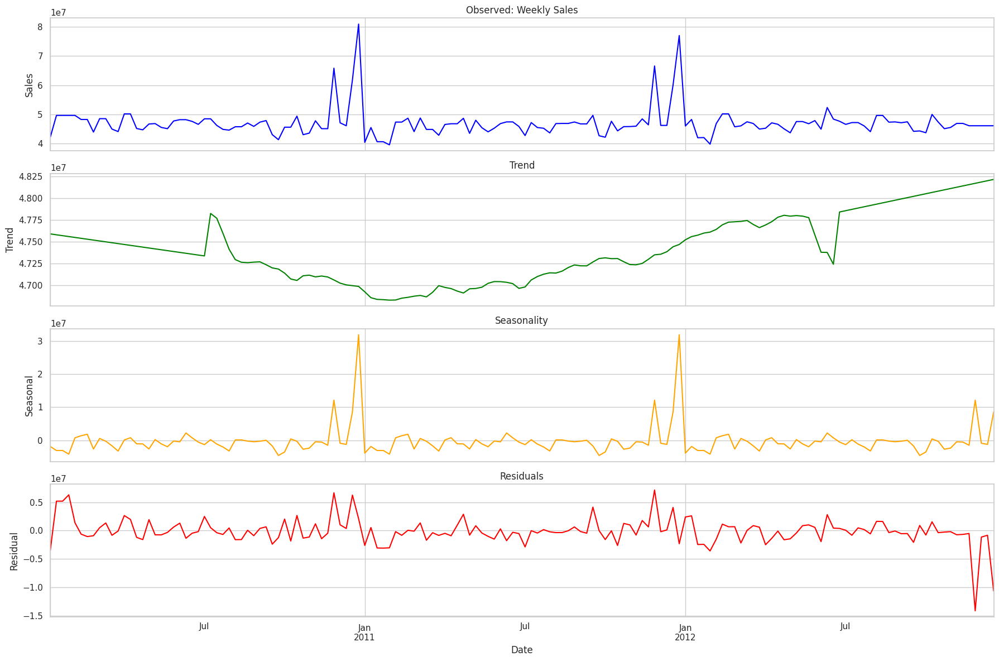

In [208]:
# Decompose the time series
multi_plot = seasonal_decompose(df_by_date_new['Weekly_Sales'], model='add', extrapolate_trend='freq')

# Plot all components in one figure
fig, axes = plt.subplots(4, 1, figsize=(18, 12), sharex=True)

multi_plot.observed.plot(ax=axes[0], title='Observed: Weekly Sales', color='blue')
axes[0].set_ylabel('Sales')

multi_plot.trend.plot(ax=axes[1], title='Trend', color='green')
axes[1].set_ylabel('Trend')

multi_plot.seasonal.plot(ax=axes[2], title='Seasonality', color='orange')
axes[2].set_ylabel('Seasonal')

multi_plot.resid.plot(ax=axes[3], title='Residuals', color='red')
axes[3].set_ylabel('Residual')

# Improve layout
plt.xlabel('Date')
plt.tight_layout()
plt.show()

As it can be observed, the series is strongly influenced by the seasonal component

### **Correlations**

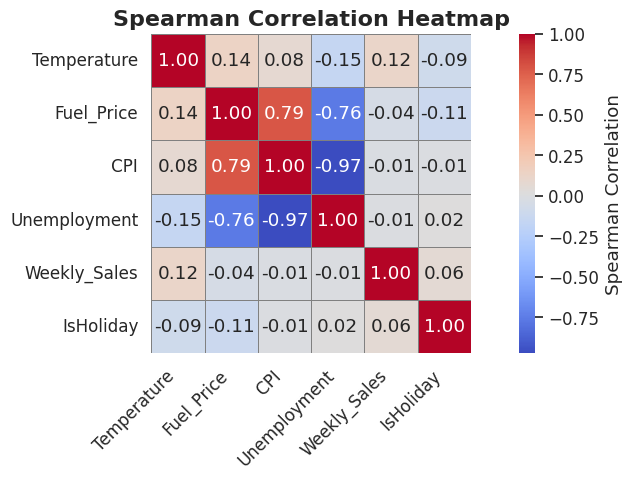

In [209]:
# Set plot aesthetics
plt.figure(figsize=(10, 5))
sns.set(font_scale=1.1)  # slightly larger font for annotations

# Generate the heatmap
heatmap = sns.heatmap(
    df_by_date_new.corr(method='spearman'),
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    cbar_kws={'label': 'Spearman Correlation'},
    linewidths=0.5,
    linecolor='gray',
    square=True
)

# Customize the plot
plt.title('Spearman Correlation Heatmap', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()

# Show plot
plt.show()

strong +ve correlation b/w Fuel_Price and CPI and strong -ve correlations b/w Unmeployment and Fuel_Price and Unemployment and CPI. surprisingly, unemployment rate doesn't really seem to affect the weekly sales (directly at least)

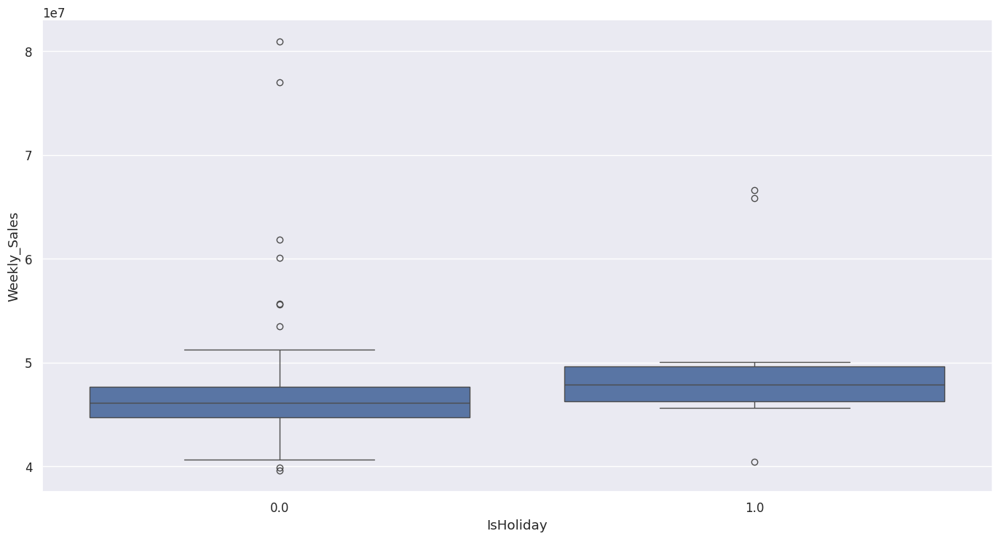

In [210]:
# Holiday weeks
plt.figure(figsize=(15,8))
sns.boxplot(data = df_by_date, x = 'IsHoliday', y = 'Weekly_Sales');


holiday weeks don't necessarily mean that the weekly sales go up but it is often the case

### **Forecasting using the Holt-Winters Model**

Exponential smoothing is a technique for smoothening time series data by giving different weights which are exponentially decreasing over time, unlike simple moving average method which assigns equal weightage to all observations. Holt Winters exponential smoothening applies exponential smoothing three times, usually done when high frequency signal has to be removed.

Train and test on 2012 data to determine accuracy

In [211]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [212]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:120],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

prediction = fit_model.forecast(34)
prediction

,0
2012-04-29,4.423871e+07
2012-05-06,4.865764e+07
2012-05-13,4.610740e+07
2012-05-20,4.469169e+07
2012-05-27,4.595247e+07
2012-06-03,4.751265e+07
2012-06-10,4.810565e+07
2012-06-17,4.812148e+07
2012-06-24,4.663070e+07
2012-07-01,4.359984e+07


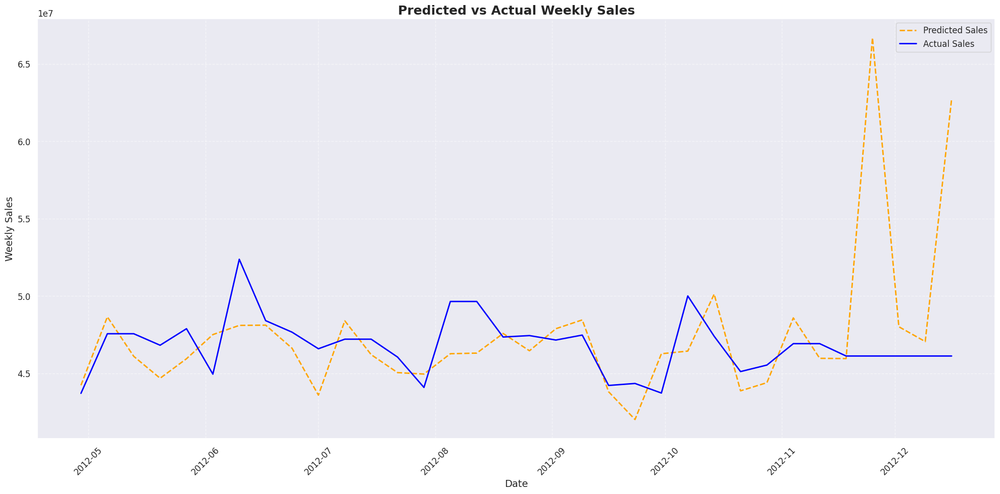

In [213]:
# Set the figure size
plt.figure(figsize=(20, 10))

# Plot predicted and actual sales
plt.plot(df_by_date_new.index[120:], prediction, label='Predicted Sales', color='orange', linestyle='--', linewidth=2)
plt.plot(df_by_date_new.index[120:], df_by_date_new['Weekly_Sales'][120:], label='Actual Sales', color='blue', linewidth=2)

# Title and axis labels
plt.title('Predicted vs Actual Weekly Sales', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)

# Add legend
plt.legend(fontsize=12)

# Improve x-axis formatting if needed
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)

# Tight layout for clean spacing
plt.tight_layout()

# Show plot
plt.show()

In [214]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
print("Mean Absolute Percentage Error = {a}%".format(a=mean_absolute_percentage_error(df_by_date_new.Weekly_Sales[120:],prediction)))

Mean Absolute Percentage Error = 5.571099127670492%


### **Forecasting 2013 sales**

In [215]:
fit_model = ExponentialSmoothing(df_by_date_new['Weekly_Sales'][:-2],
                                 trend = 'add',
                                 seasonal = 'add',
                                 seasonal_periods = 52).fit()

future_prediction = fit_model.forecast(56)
future_prediction

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/holtwinters/model.py:903: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


,0
2012-12-09,4.620324e+07
2012-12-16,6.173534e+07
2012-12-23,8.063976e+07
2012-12-30,4.105708e+07
2013-01-06,4.559893e+07
2013-01-13,4.156147e+07
2013-01-20,4.154913e+07
2013-01-27,4.046564e+07
2013-02-03,4.758652e+07
2013-02-10,4.776282e+07


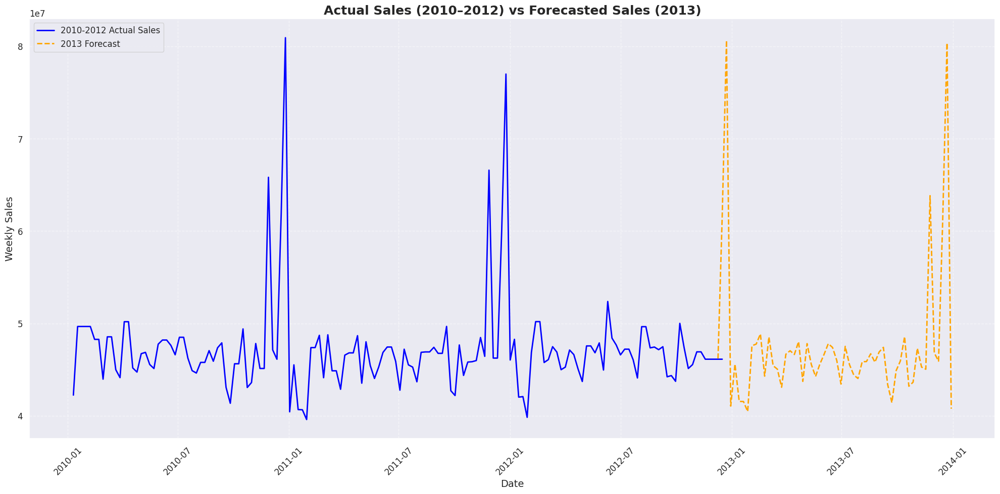

In [216]:
# Set figure size
plt.figure(figsize=(20, 10))

# Plot actual weekly sales
plt.plot(df_by_date_new.index, df_by_date_new['Weekly_Sales'], label='2010-2012 Actual Sales', color='blue', linewidth=2)

# Plot future predictions
plt.plot(future_prediction.index, future_prediction.values, linestyle='--', color='orange', linewidth=2, label='2013 Forecast')

# Title and axis labels
plt.title('Actual Sales (2010–2012) vs Forecasted Sales (2013)', fontsize=18, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Weekly Sales', fontsize=14)

# Add legend
plt.legend(fontsize=12)

# Improve x-axis formatting
plt.xticks(rotation=45)

# Add grid
plt.grid(True, linestyle='--', alpha=0.5)

# Improve layout
plt.tight_layout()

# Show plot
plt.show()

# **Impact of External Factors:**

Examine how external factors (economic indicators, regional climate) influence sales.

Incorporate these insights into the demand forecasting models.

## **External factors (economic indicators, regional climate) influence sales**

Impact of External Factors on Demand:
         Feature  Importance
0          Store    0.000000
1           Dept    0.000000
2      IsHoliday    0.000000
8      MarkDown4    0.002736
6      MarkDown2    0.003440
7      MarkDown3    0.003523
5      MarkDown1    0.008242
9      MarkDown5    0.012905
4     Fuel_Price    0.013323
11  Unemployment    0.016844
10           CPI    0.028200
3    Temperature    0.069849


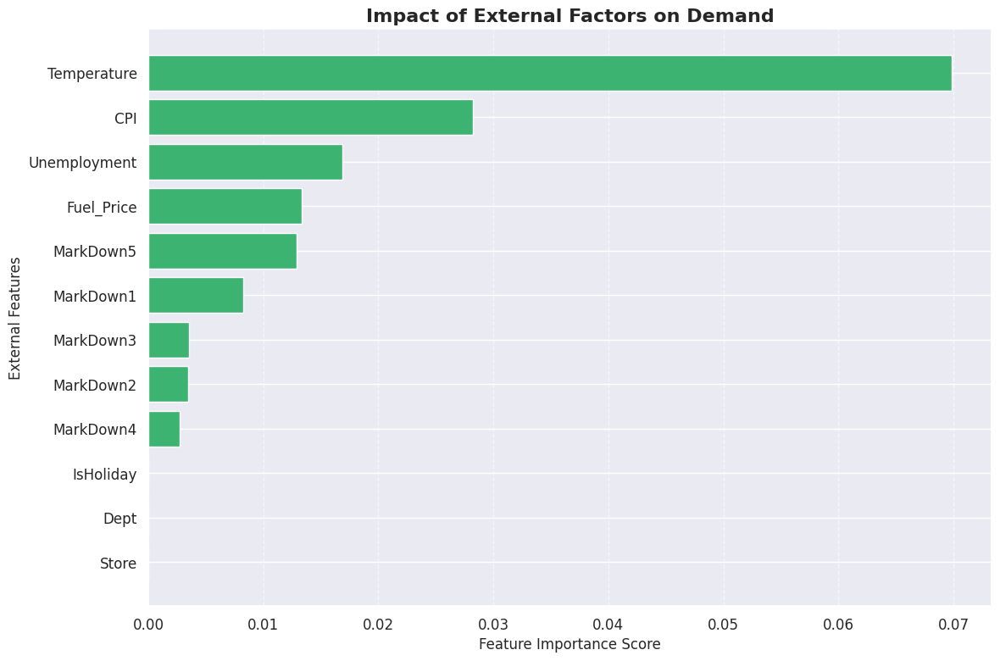

In [217]:
# Get feature importances from the trained model
importances = model_rf.feature_importances_

# Create a DataFrame for better structure
impact = pd.DataFrame({
    'Feature': X_train.columns[:12],  # First 12 external factors
    'Importance': importances[:12]
}).sort_values(by='Importance', ascending=True)  # Sort for better visualization

# Display DataFrame
print("Impact of External Factors on Demand:")
print(impact)

# Plotting the impact of external features
plt.figure(figsize=(12, 8))
plt.barh(impact['Feature'], impact['Importance'], color='mediumseagreen')
plt.title('Impact of External Factors on Demand', fontsize=16, fontweight='bold')
plt.xlabel('Feature Importance Score', fontsize=12)
plt.ylabel('External Features', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


## **Findings: Impact of External Factors on Demand Forecasting**

Incorporating external factors such as **economic indicators** and **regional climate conditions** into demand forecasting models is essential for improving prediction accuracy. The following insights highlight how these variables influence sales behavior:

---

### **Temperature**

Regional climate plays a significant role in shaping consumer demand. For instance, colder regions typically experience increased demand for **winter apparel, heating products, and comfort-oriented goods** during colder months. Conversely, warmer regions tend to see higher demand for **summer clothing, outdoor equipment, and cooling-related products**.

Integrating temperature data into demand forecasting models enables businesses to anticipate **seasonal demand fluctuations** and proactively adjust inventory planning, product assortment, and marketing strategies.

---

### **Consumer Price Index (CPI)**

The **Consumer Price Index (CPI)** reflects inflationary trends and provides insights into consumers’ purchasing power. Rising CPI levels often lead to more cautious spending behavior, with consumers prioritizing essential goods over discretionary items. In contrast, periods of lower inflation typically encourage higher discretionary spending.

By incorporating CPI data into demand forecasting models, businesses can better anticipate shifts in consumer behavior and make informed decisions regarding **pricing strategies, promotions, and product positioning**.

---

### **Fuel Price**

Fuel price fluctuations influence transportation and production costs, as well as consumers’ disposable income. Higher fuel prices can increase logistics expenses and reduce discretionary spending as consumers allocate more of their budget toward fuel and essential needs.

Including fuel price data in demand forecasting allows businesses to anticipate cost-driven demand changes and adjust **pricing, distribution, and supply chain strategies** accordingly.

---

### **Conclusion**

These findings demonstrate that external factors such as **temperature, CPI, and fuel prices** play a critical role in shaping sales patterns and demand dynamics. Incorporating these variables into demand forecasting models enhances predictive accuracy and supports more informed decision-making across **inventory management, pricing, and marketing strategies**.


## **Incorporate these insights into the demand forecasting models.**

In [218]:
merged_data['CPI_Percent_Change'] = merged_data['CPI'].pct_change()
merged_data['Temp_Percent_Change'] = merged_data['Temperature'].pct_change()
merged_data['Fuel_Price_Percent_Change'] = merged_data['Fuel_Price'].pct_change()

In [219]:
merged_data.fillna(0,inplace=True)

In [220]:
merged_data['CPI_Percent_Change'].value_counts()

,count
CPI_Percent_Change,
-1.000000,9
inf,9
0.000000,2
0.000311,1
0.001912,1
...,...
0.000897,1
0.006611,1
0.000083,1


In [221]:
merged_data

,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,lagged_sales_1,lagged_sales_2,CPI_Percent_Change,Temp_Percent_Change,Fuel_Price_Percent_Change
Date,,,,,,,,,,,,,,,,,,
2010-01-10,1,1,20094.19,0,71.89,2.603,5369.61,180.02,21.38,1523.11,3402.66,211.671989,7.838,18122.52,19354.23,0.000000,0.000000,0.000000
2010-02-04,1,1,57258.43,0,62.27,2.719,5369.61,180.02,21.38,1523.11,3402.66,210.820450,7.808,26229.21,22136.64,-0.004023,-0.133816,0.044564
2010-02-07,1,1,16333.14,0,80.91,2.669,5369.61,180.02,21.38,1523.11,3402.66,211.223533,7.787,16328.72,16216.27,0.001912,0.299342,-0.018389
2010-02-19,1,1,41595.55,0,39.93,2.514,5369.61,180.02,21.38,1523.11,3402.66,211.289143,8.106,46039.49,24924.50,0.000311,-0.506489,-0.058074
2010-02-26,1,1,19403.54,0,46.63,2.561,5369.61,180.02,21.38,1523.11,3402.66,211.319643,8.106,41595.55,46039.49,0.000144,0.167794,0.018695
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-10-08,1,1,16119.92,0,85.05,3.494,11436.22,245.00,6.85,6964.26,4836.22,221.958433,6.908,16628.31,15731.18,inf,inf,inf
2012-10-19,1,1,24185.27,0,67.97,3.594,950.33,180.02,4.93,80.25,2312.85,223.425723,6.573,22764.01,21904.47,0.006611,-0.200823,0.028620
2012-10-26,1,1,27390.81,0,69.16,3.506,2585.85,31.75,6.00,1057.16,1305.01,223.444251,6.573,24185.27,22764.01,0.000083,0.017508,-0.024485


In [222]:
df = merged_data[~merged_data['CPI_Percent_Change'].isin([np.inf, -np.inf])]

In [223]:
# Split data into train and test sets
train_data, test_data = train_test_split(df, test_size=0.2, shuffle=False)

In [224]:
train_data.columns

Index(['Store', 'Dept', 'Weekly_Sales', 'IsHoliday', 'Temperature',
       'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4',
       'MarkDown5', 'CPI', 'Unemployment', 'lagged_sales_1', 'lagged_sales_2',
       'CPI_Percent_Change', 'Temp_Percent_Change',
       'Fuel_Price_Percent_Change'],
      dtype='object')

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


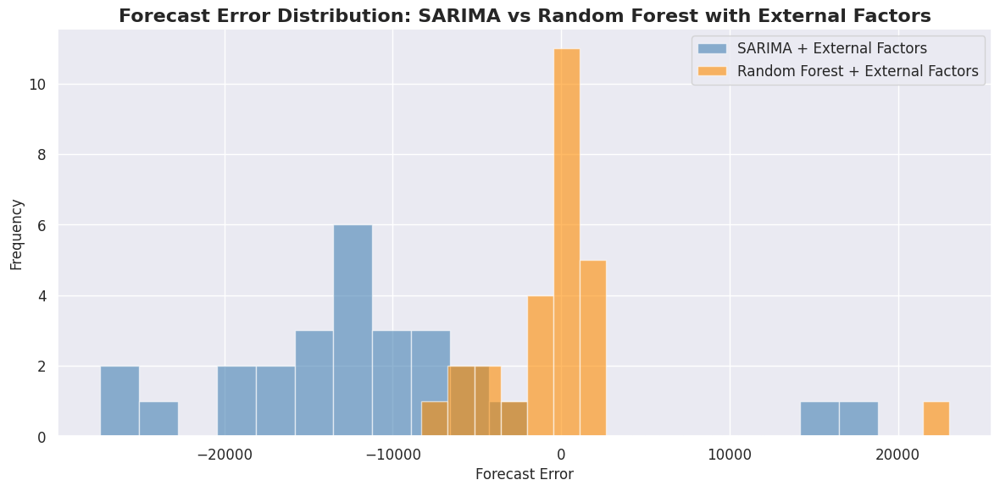

In [225]:
# --------------------------------------------------
# SARIMA Model with External Regressors
# --------------------------------------------------

# Fit SARIMA model using external macroeconomic factors
model_sarima_with_ext = SARIMAX(
    train_data['Weekly_Sales'],
    exog=train_data[['Temp_Percent_Change',
                     'CPI_Percent_Change',
                     'Fuel_Price_Percent_Change']],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 52)
)

sarima_ext_result = model_sarima_with_ext.fit()

# Generate SARIMA forecasts for test period
sarima_ext_forecast = sarima_ext_result.forecast(
    steps=len(test_data),
    exog=test_data[['Temp_Percent_Change',
                    'CPI_Percent_Change',
                    'Fuel_Price_Percent_Change']]
)


# --------------------------------------------------
# Random Forest Regression with External Features
# --------------------------------------------------

# Prepare training and testing datasets
X_train = train_data.drop(columns=['Weekly_Sales'])
y_train = train_data['Weekly_Sales']
y_test = test_data['Weekly_Sales']

X_test = test_data[['Store', 'Dept', 'IsHoliday', 'Temperature',
                     'Fuel_Price', 'MarkDown1', 'MarkDown2',
                     'MarkDown3', 'MarkDown4', 'MarkDown5',
                     'CPI', 'Unemployment',
                     'lagged_sales_1', 'lagged_sales_2',
                     'CPI_Percent_Change',
                     'Temp_Percent_Change',
                     'Fuel_Price_Percent_Change']]

# Train Random Forest model
model_rf_with_ext = RandomForestRegressor(random_state=42)
model_rf_with_ext.fit(X_train, y_train)

# Generate Random Forest predictions
rf_ext_forecast = model_rf_with_ext.predict(X_test)


# --------------------------------------------------
# Error Analysis & Visualization
# --------------------------------------------------

# Convert predictions to aligned Series
rf_ext_forecast = pd.Series(rf_ext_forecast)
test_data = test_data['Weekly_Sales'].reset_index(drop=True)
sarima_ext_forecast = sarima_ext_forecast.reset_index(drop=True)

# Compute forecast errors
sarima_ext_errors = test_data - sarima_ext_forecast
rf_ext_errors = test_data - rf_ext_forecast

# Plot error distributions
plt.figure(figsize=(12, 6))
plt.hist(
    sarima_ext_errors,
    bins=20,
    alpha=0.6,
    color='steelblue',          # 🔁 color refined
    label='SARIMA + External Factors'
)
plt.hist(
    rf_ext_errors,
    bins=20,
    alpha=0.6,
    color='darkorange',         # 🔁 color refined
    label='Random Forest + External Factors'
)

# Titles and labels
plt.title(
    "Forecast Error Distribution: SARIMA vs Random Forest with External Factors",
    fontsize=16,
    fontweight='bold'
)
plt.xlabel("Forecast Error", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.legend()
plt.tight_layout()
plt.show()


In [226]:
# Random Forest
rf_mae_ext = mean_absolute_error(test_data, rf_ext_forecast)
rf_rmse_ext = np.sqrt(mean_squared_error(test_data, rf_ext_forecast))

In [227]:
print("RF MAE:", rf_mae_ext)
print("RF RMSE:", rf_rmse_ext)

RF MAE: 2650.7602777777765
RF RMSE: 5262.354758026428


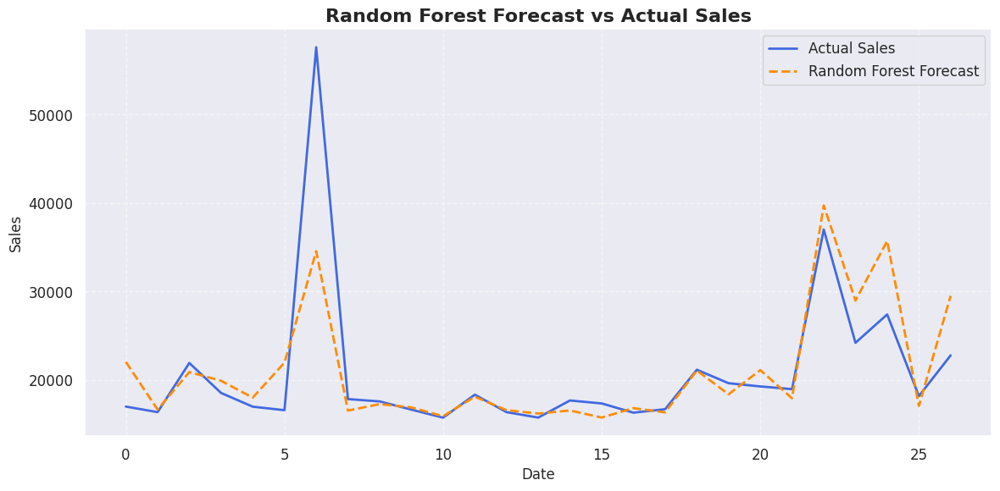

In [228]:
# Check if test_data is a Series (no column access needed)
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, test_data, label='Actual Sales', color='royalblue', linewidth=2)
plt.plot(test_data.index, rf_ext_forecast, label='Random Forest Forecast', color='darkorange', linestyle='--', linewidth=2)

plt.title('Random Forest Forecast vs Actual Sales', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Sales', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# **Real-World Application and Strategy Formulation:**

Formulate a comprehensive strategy for inventory management, marketing, and store optimization based on the insights gathered.

Discuss potential real-world challenges in implementing these strategies.

Based on the findings regarding the influence of external factors on sales and demand forecasting, here's a comprehensive strategy for inventory management, marketing, and store optimization:

## **Inventory Management**

**Seasonal Forecasting:** Utilize temperature data to forecast seasonal demand fluctuations. Allocate inventory space and resources accordingly to meet the anticipated demand for seasonal products.

**Dynamic Pricing:**

Incorporate CPI data to adjust pricing strategies in response to changes in consumer purchasing power. Offer promotions or discounts during periods of low inflation to stimulate sales.

**Supply Chain Optimization:**

Monitor fuel price fluctuations to anticipate changes in transportation costs. Optimize supply chain routes and distribution networks to minimize the impact of fuel price changes on logistics expenses.

## **Marketing Strategies**

**Targeted Campaigns:**

Tailor marketing campaigns based on regional climate conditions to promote relevant products. For example, launch winter clothing promotions in colder regions and summer gear promotions in warmer areas.

**Price Sensitivity Analysis:**

Analyze consumer response to price changes using CPI data. Adjust pricing strategies to maximize revenue while remaining competitive in the market.

**Promotional Timing:**

Coordinate marketing efforts with fluctuations in fuel prices. Launch promotions or special offers during periods of low fuel prices to offset potential decreases in consumer discretionary spending.

## **Store Optimization**
Product Placement: Arrange store layouts to reflect seasonal demand patterns identified through temperature data. Highlight relevant products prominently to attract customer attention.

**Inventory Turnover:**

Use CPI data to optimize inventory levels and minimize carrying costs. Adjust stock levels based on changes in consumer spending patterns to ensure optimal turnover rates.

 **Customer Experience:** Leverage insights from fuel price data to offer convenience-oriented services, such as online ordering with flexible delivery options, to mitigate the impact of increased transportation costs on consumers.

## **Challenges in implementing these strategies may include**

**Data Integration:**

Ensuring seamless integration of diverse data sources (temperature, CPI, fuel prices) into existing systems for accurate forecasting and decision-making.
Resource Allocation: Allocating resources effectively to implement dynamic pricing strategies and targeted marketing campaigns based on real-time data analysis.

**Operational Flexibility:** Adapting supply chain and inventory management processes to respond quickly to changes in external factors, such as sudden fluctuations in fuel prices or unexpected shifts in consumer behavior.

**Competitive Pressures:** Navigating competitive pressures and market dynamics while adjusting pricing strategies to maintain profitability and market share.
Addressing these challenges requires a combination of technological capabilities, strategic planning, and organizational agility to leverage the insights gained from external factors effectively.






In [229]:
sales_df['Store'] = sales_df['Store'].astype('category')
sales_df['Dept'] = sales_df['Dept'].astype('string')
sales_df['Date'] = pd.to_datetime(sales_df['Date'], format='%d/%m/%Y')
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  category      
 1   Dept          421570 non-null  string        
 2   Date          421570 non-null  datetime64[ns]
 3   Weekly_Sales  421570 non-null  float64       
 4   IsHoliday     421570 non-null  int64         
dtypes: category(1), datetime64[ns](1), float64(1), int64(1), string(1)
memory usage: 13.3 MB


In [230]:
print("Total number of stores:", sales_df.Store.nunique())
print("Total number of departments:", sales_df.Dept.nunique())

Total number of stores: 45
Total number of departments: 81


In [231]:
df_sales_new=sales_df[(sales_df['Store'] == 10) & (sales_df['Dept'].isin(['1', '2', '3', '4','5' ]))].drop(columns=['IsHoliday'])

In [232]:
df_sales_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 715 entries, 87524 to 88238
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         715 non-null    category      
 1   Dept          715 non-null    string        
 2   Date          715 non-null    datetime64[ns]
 3   Weekly_Sales  715 non-null    float64       
dtypes: category(1), datetime64[ns](1), float64(1), string(1)
memory usage: 24.4 KB


In [233]:
df_sales_new.Date.min(), df_sales_new.Date.max()

(Timestamp('2010-01-10 00:00:00'), Timestamp('2012-12-10 00:00:00'))

In [234]:
df_sales_new.shape

(715, 4)

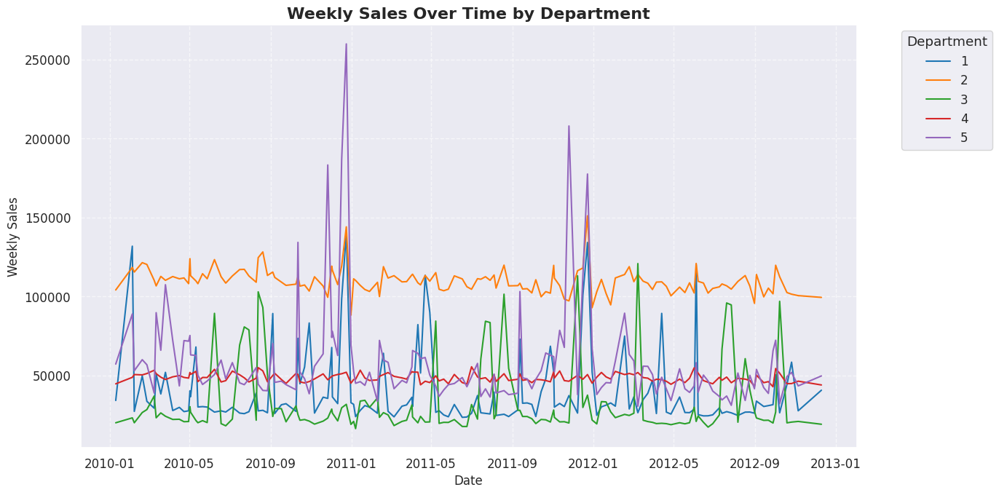

In [235]:
# Ensure 'Date' is in datetime format
df_sales_new['Date'] = pd.to_datetime(df_sales_new['Date'])

# Optional: Limit to a subset of departments to avoid overplotting
top_depts = df_sales_new['Dept'].value_counts().nlargest(5).index  # Top 5 most frequent departments
filtered_df = df_sales_new[df_sales_new['Dept'].isin(top_depts)]

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=filtered_df, x='Date', y='Weekly_Sales', hue='Dept', palette='tab10')

plt.title('Weekly Sales Over Time by Department', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

From the trend, we can observe that:

a) Dept 1: Sales exhibit a notable increase in April, with another peak observed towards the end of the year in November and December.

b) Dept 2: Sales show a steady ascent until September, followed by a significant surge in December.

c) Dept 3: Sales remain stable, with substantial increases noted in August and September, along with a minor uptick in December and January. This department likely caters to educational and stationary products.

d) Dept 4: Sales within this department have maintained a consistent trajectory over the years, experiencing minor fluctuations.

e) Dept 5: Sales for this product demonstrate a spike in the early months of the year, followed by a substantial increase in December

## Marketing Campaign

Now, to perform Causal Inference Analysis, let's go ahead and create a situation where we induce some changes in the dataset and analyse it using the methodology.

As the sales for Dept 4 is pretty consistent, we can induce some changes like a rise in sales due to Marketing Campaign for Q3-2012 i.e. months of July to September.

In [236]:
df_dept4_marketing=df_sales_new.copy()
df_dept4_marketing['Marketing_Campaign'] = np.where((df_dept4_marketing['Dept'] == '4') & (df_dept4_marketing['Date'] > "2012-06-30") &
    (df_dept4_marketing['Date'] < "2012-10-01"),'Active', 'Inactive')

In [237]:
df_dept4_marketing

,Store,Dept,Date,Weekly_Sales,Marketing_Campaign
87524,10,1,2010-05-02,40212.84,Inactive
87525,10,1,2010-12-02,67699.32,Inactive
87526,10,1,2010-02-19,49748.33,Inactive
87527,10,1,2010-02-26,33601.22,Inactive
87528,10,1,2010-05-03,36572.44,Inactive
...,...,...,...,...,...
88234,10,5,2012-09-28,65585.96,Inactive
88235,10,5,2012-05-10,54202.85,Inactive
88236,10,5,2012-12-10,49683.63,Inactive
88237,10,5,2012-10-19,49277.87,Inactive


In [238]:
new_sales = df_dept4_marketing.copy()
new_sales['New_sales']=np.where(new_sales['Marketing_Campaign']=="Active",new_sales['Weekly_Sales'] * 1.45 ,new_sales['Weekly_Sales'])
new_sales

,Store,Dept,Date,Weekly_Sales,Marketing_Campaign,New_sales
87524,10,1,2010-05-02,40212.84,Inactive,40212.84
87525,10,1,2010-12-02,67699.32,Inactive,67699.32
87526,10,1,2010-02-19,49748.33,Inactive,49748.33
87527,10,1,2010-02-26,33601.22,Inactive,33601.22
87528,10,1,2010-05-03,36572.44,Inactive,36572.44
...,...,...,...,...,...,...
88234,10,5,2012-09-28,65585.96,Inactive,65585.96
88235,10,5,2012-05-10,54202.85,Inactive,54202.85
88236,10,5,2012-12-10,49683.63,Inactive,49683.63
88237,10,5,2012-10-19,49277.87,Inactive,49277.87


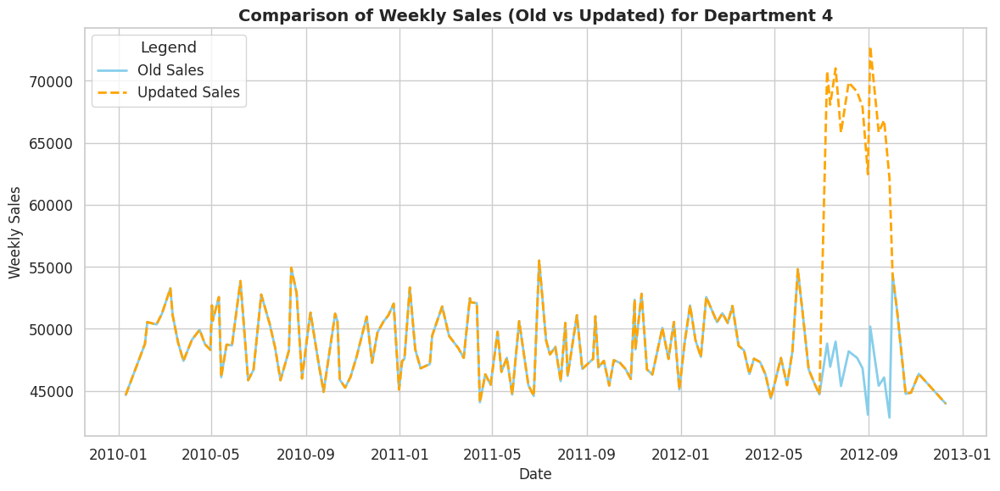

In [239]:
# Set the figure size and style
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Plot old sales
sns.lineplot(
    data=df_sales_new.query("Dept == '4'"),
    x="Date", y="Weekly_Sales", label='Old Sales', color='skyblue', linewidth=2
)

# Plot new/updated sales
sns.lineplot(
    data=new_sales.query("Dept == '4'"),
    x="Date", y="New_sales", label='Updated Sales', color='orange', linewidth=2, linestyle='--'
)

# Add titles and labels
plt.title('Comparison of Weekly Sales (Old vs Updated) for Department 4', fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Weekly Sales', fontsize=12)
plt.legend(title='Legend')
plt.tight_layout()
plt.show()

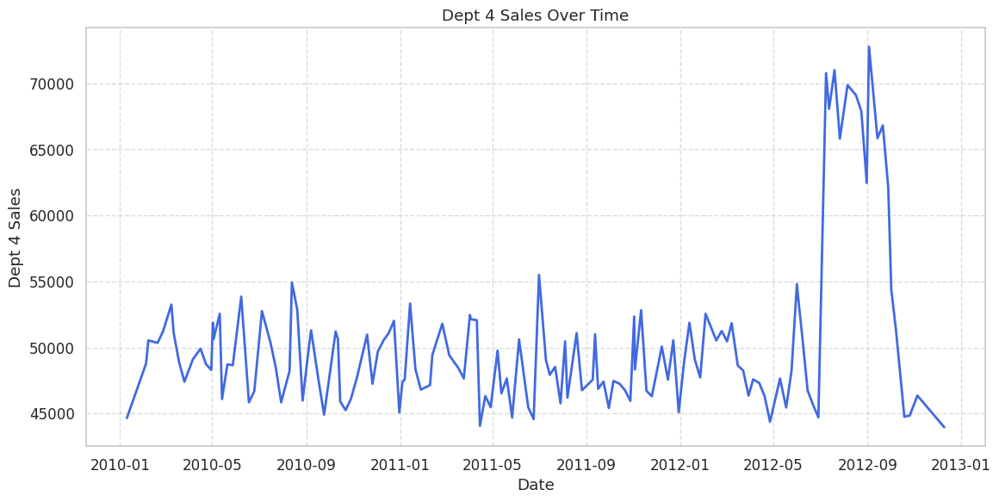

In [240]:
# After pivoting, 'Date' is the index, so reset it to make it a column for plotting
df_sales_causal = new_sales.pivot(index="Date", columns="Dept", values="New_sales")
df_sales_causal.columns = ['Dept_1', 'Dept_2', 'Dept_3', 'Dept_4', 'Dept_5']
df_sales_causal = df_sales_causal.sort_index()  # Sort by index (Date)

# Keep only Dept_4
df_final = df_sales_causal[['Dept_4']].reset_index()

# Plot Dept_4 sales over time
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_final, x='Date', y='Dept_4', color='royalblue', linewidth=2)
plt.title('Dept 4 Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Dept 4 Sales')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

###**Causal Inference**

In [241]:
!pip install pycausalimpact

In [242]:
from causalimpact import CausalImpact

In [243]:
df_final = df_final.reset_index()  # if needed, to get 'Date' back as a column
df_final['Date'] = pd.to_datetime(df_final['Date'])  # ensure datetime
df_final = df_final.set_index('Date')  # set Date as index

In [244]:
marketing_pre_period=["2010-01-10","2012-06-29"]
marketing_post_period=["2012-07-09","2012-10-26"]
impact = CausalImpact(df_final, marketing_pre_period, marketing_post_period)

/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.12/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [245]:
#Causal impact summary
print(impact.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    132.5              2120.0
Prediction (s.d.)         124.0 (1.02)       1984.0 (16.38)
95% CI                    [121.97, 125.98]   [1951.51, 2015.74]

Absolute effect (s.d.)    8.5 (1.02)         136.0 (16.38)
95% CI                    [6.52, 10.53]      [104.26, 168.49]

Relative effect (s.d.)    6.85% (0.83%)      6.85% (0.83%)
95% CI                    [5.26%, 8.49%]     [5.26%, 8.49%]

Posterior tail-area probability p: 0.0
Posterior prob. of a causal effect: 100.0%

For more details run the command: print(impact.summary('report'))


As per the summary, the predicted relative effect is around 30% whereas the lift we induced in the dataset was 45% . The 95% CI for it is 26% to 32%. This is a satisfactory result with a p value close to zero.

In [246]:
# Causal impact report
print(impact.summary(output='report'))

Analysis report {CausalImpact}


During the post-intervention period, the response variable had
an average value of approx. 132.5. By contrast, in the absence of an
intervention, we would have expected an average response of 124.0.
The 95% interval of this counterfactual prediction is [121.97, 125.98].
Subtracting this prediction from the observed response yields
an estimate of the causal effect the intervention had on the
response variable. This effect is 8.5 with a 95% interval of
[6.52, 10.53]. For a discussion of the significance of this effect,
see below.


Summing up the individual data points during the post-intervention
period (which can only sometimes be meaningfully interpreted), the
response variable had an overall value of 2120.0.
By contrast, had the intervention not taken place, we would have expected
a sum of 1984.0. The 95% interval of this prediction is [1951.51, 2015.74].


The above results are given in terms of absolute numbers. In relative
terms, the response varia